In [1]:
import pandas as pd

df = pd.read_table('AI_Dataset1.txt', header=None)


In [3]:
df.loc[44684,16]

1.503101

In [4]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,52,53,54,55,56,57,58,59,60,61
0,Measurement number: 1_1,Channel number: 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,U2722 Channel 1 settings:,Current Range: 1 mA,Voltage Limit (V): 6.000000,Output Leve (mA): 0.000260,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,B2900 Channel 1 settings:,Ch.1Sweep Start (V): 0.00,Ch.1 Sweep Stop (V): 6.00,Ch.2 Sweep Number of Steps: 61,Ch.2 Current Range (A): 0.010000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
subframeStartIndex = []
for i in range(0,65536):
    if "Measurement number:" in df[0][i]:
        subframeStartIndex.append(i)

In [5]:
print(subframeStartIndex)

[0, 18, 36, 54, 72, 90, 108, 126, 144, 162, 180, 198, 216, 234, 252, 270, 288, 306, 324, 342, 360, 378, 396, 414, 432, 450, 468, 486, 504, 522, 540, 558, 576, 594, 612, 630, 648, 666, 684, 702, 720, 738, 756, 774, 792, 810, 828, 846, 864, 882, 900, 918, 936, 954, 972, 990, 1008, 1026, 1044, 1062, 1080, 1098, 1116, 1134, 1152, 1170, 1188, 1206, 1224, 1242, 1260, 1278, 1296, 1314, 1332, 1350, 1368, 1386, 1404, 1422, 1440, 1458, 1476, 1494, 1512, 1530, 1548, 1566, 1584, 1602, 1620, 1638, 1656, 1674, 1692, 1710, 1728, 1746, 1764, 1782, 1800, 1818, 1836, 1854, 1872, 1890, 1908, 1926, 1944, 1962, 1980, 1998, 2016, 2034, 2052, 2070, 2088, 2106, 2124, 2142, 2160, 2178, 2196, 2214, 2232, 2250, 2268, 2286, 2304, 2322, 2340, 2358, 2376, 2394, 2412, 2430, 2448, 2466, 2484, 2502, 2520, 2538, 2556, 2574, 2592, 2610, 2628, 2646, 2664, 2682, 2700, 2718, 2736, 2754, 2772, 2790, 2808, 2826, 2844, 2862, 2880, 2898, 2916, 2934, 2952, 2970, 2988, 3006, 3024, 3042, 3060, 3078, 3096, 3114, 3132, 3150, 3168, 

In [6]:
chunks = list()
num_chunks = len(subframeStartIndex)
print(num_chunks)

3641


In [7]:
for i in range(0,num_chunks-1):
    chunks.append(df[subframeStartIndex[i]:subframeStartIndex[i+1]])

In [8]:
chunks

[                                  0                          1   \
 0            Measurement number: 1_1          Channel number: 1   
 1                                                           NaN   
 2          U2722 Channel 1 settings:        Current Range: 1 mA   
 3                                                           NaN   
 4          B2900 Channel 1 settings:  Ch.1Sweep Start (V): 0.00   
 5                                                           NaN   
 6                   09.06.2017 23:39                        NaN   
 7                                                           NaN   
 8            Voltage Sweep Channel 1                   0.000128   
 9           Current1 Sweep Channel 1                          0   
 10          Current2 Sweep Channel 1                          0   
 11                                                          NaN   
 12                  09.06.2017 23:39                        NaN   
 13                                             

In [8]:
measurementDF = list()
for i in range(0,num_chunks-1):
    df_temp = pd.DataFrame(df.iloc[subframeStartIndex[i]:subframeStartIndex[i+1],:])
    df_temp = df_temp.reset_index()
    measurementDF.append(df_temp)
    
df_last = df.iloc[subframeStartIndex[3640]:subframeStartIndex[3640]+18]
df_last = df_last.reset_index()
measurementDF.append(df_last)

In [9]:
len(measurementDF)

3641

In [10]:
countU2722 = 0
for i in range(0,len(measurementDF)):
    if "U2722" in measurementDF[i][0][2]:
        countU2722 = countU2722+1
        #print(i)
print("count: " + str(countU2722))

count: 3641


In [11]:
countB2900 = 0
for i in range(0,len(measurementDF)):
    if "B2900" in measurementDF[i][0][4]:
        countB2900 = countB2900+1
        #print(i)
print("count: " + str(countB2900))

count: 3641


In [12]:
countCurrentRange1mAForU2722 = 0
for i in range(0,len(measurementDF)):
    if "Current Range: 1 mA" in measurementDF[i][1][2]:
        countCurrentRange1mAForU2722 = countCurrentRange1mAForU2722+1
        #print(i)
print("count: " + str(countCurrentRange1mAForU2722))

count: 1919


In [13]:
countCurrentRange10mAForU2722 = 0
for i in range(0,len(measurementDF)):
    if "Current Range: 10 mA" in measurementDF[i][1][2]:
        countCurrentRange10mAForU2722 = countCurrentRange10mAForU2722+1
        #print(i)
print("count: " + str(countCurrentRange10mAForU2722))

count: 1722


In [14]:
countVoltageLimit6 = 0
for i in range(0,len(measurementDF)):
    if "Voltage Limit (V): 6.000000" in measurementDF[i][2][2]:
        countVoltageLimit6 = countVoltageLimit6+1
        #print(i)
print("count: " + str(countVoltageLimit6))

count: 3581


In [15]:
countVoltageLimit2 = 0
for i in range(0,len(measurementDF)):
    if "Voltage Limit (V): 2.000000" in measurementDF[i][2][2]:
        countVoltageLimit2 = countVoltageLimit2+1
        #print(i)
print("count: " + str(countVoltageLimit2))

count: 60


In [16]:
countCh1SweepStart = 0
for i in range(0,len(measurementDF)):
    if "Ch.1Sweep Start (V): 0.00" in measurementDF[i][1][4]:
        countCh1SweepStart = countCh1SweepStart+1
        #print(i)
print("count: " + str(countCh1SweepStart))

count: 3641


In [17]:
countCh1SweepStop = 0
for i in range(0,len(measurementDF)):
    if "Ch.1 Sweep Stop (V): 6.00" in measurementDF[i][2][4]:
        countCh1SweepStop = countCh1SweepStop+1
        #print(i)
print("count: " + str(countCh1SweepStop))

count: 3641


In [21]:
processed_df = pd.DataFrame()
for element_df in measurementDF:
    for cell in element_df[0]:
        if 'Voltage Sweep Channel 1' in cell:
            rowIndex_VoltageSweep = cell.index
            processed_df = pd.concat([processed_df, element_df[rowIndex_VoltageSweep]])
    

TypeError: must be str, not DataFrame

In [35]:
test_df

,index,0,1,2,3,4,5,6,7,8,...,52,53,54,55,56,57,58,59,60,61
0,18,Measurement number: 1_2,Channel number: 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,19,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20,U2722 Channel 2 settings:,Current Range: 1 mA,Voltage Limit (V): 6.000000,Output Leve (mA): 0.000520,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,21,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,22,B2900 Channel 2 settings:,Ch.1Sweep Start (V): 0.00,Ch.1 Sweep Stop (V): 6.00,Ch.2 Sweep Number of Steps: 61,Ch.2 Current Range (A): 0.010000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,23,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,24,09.06.2017 23:39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,25,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,26,Voltage Sweep Channel 2,0.000791,0.102404,0.201277,0.299988,0.399993,0.500012,0.599996,0.700899,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,27,Current1 Sweep Channel 2,0,0,0,0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [23]:
List_of_voltageSweepList = list()
List_of_currentOneList = list()
List_of_currentTwoList = list()

List_of_voltageSweepReversedList = list()
List_of_currentOneReverseList = list()
List_of_currentTwoReverseList = list()

List_of_channelNumber = list()
List_of_measurementNumber = list()

for df_index in range(len(measurementDF)-1):
    temp_df = measurementDF[df_index]
    
    channelNumberTemp = temp_df[1][0]
    channelNumberTemp = channelNumberTemp.replace("Channel number: ","")
    channelNumberTemp = int(channelNumberTemp)

    measurementNumberTemp = temp_df[0][0]
    measurementNumberTemp = measurementNumberTemp.replace("Measurement number: ","")
    
    column = temp_df[0]
    for i in range(len(column)-1):
        if 'Voltage Sweep Channel' in column[i]:
            voltageSweepList = list()
            currentOneList = list()
            currentTwoList = list()
            for j in range(1,temp_df.shape[1]-1):
                voltageTemp = float(temp_df[j][i])
                currentOneTemp = float(temp_df[j][i+1])
                currentTwoTemp = float(temp_df[j][i+2])

                voltageSweepList.append(voltageTemp)
                currentOneList.append(currentOneTemp)
                currentTwoList.append(currentTwoTemp)
            #print(voltageSweepList)

        if 'Voltage Sweep Reversed Channel' in column[i]:
            voltageSweepReversedList = list()
            currentOneReversedList = list()
            currentTwoReversedList = list()
            for j in range(1,temp_df.shape[1]-1):
                voltageReverseTemp = float(temp_df[j][i])
                currentOneReverseTemp = float(temp_df[j][i+1])
                currentTwoReverseTemp = float(temp_df[j][i+2])

                voltageSweepReversedList.append(voltageReverseTemp)
                currentOneReversedList.append(currentOneReverseTemp)
                currentTwoReversedList.append(currentTwoReverseTemp)
            #print(voltageSweepReversedList)
    
    List_of_voltageSweepList.append(voltageSweepList)
    List_of_currentOneList.append(currentOneList)
    List_of_currentTwoList.append(currentTwoList)

    List_of_voltageSweepReversedList.append(voltageSweepReversedList)
    List_of_currentOneReverseList.append(currentOneReversedList)
    List_of_currentTwoReverseList.append(currentTwoReversedList)
    
    List_of_channelNumber.append(channelNumberTemp)
    List_of_measurementNumber.append(measurementNumberTemp)

In [103]:
List_of_voltageSweepList

[[0.000128,
  0.101752,
  0.204574,
  0.301251,
  0.40252,
  0.5045,
  0.601989,
  0.702588,
  0.804648,
  0.901894,
  1.000011,
  1.099986,
  1.199992,
  1.302022,
  1.399992,
  1.500719,
  1.601968,
  1.699996,
  1.800918,
  1.900009,
  2.000008,
  2.100002,
  2.2,
  2.3,
  2.4,
  2.5,
  2.6,
  2.7,
  2.8,
  2.9,
  3.0,
  3.1,
  3.19999,
  3.3,
  3.4,
  3.5,
  3.6,
  3.7,
  3.8,
  3.9,
  4.0,
  4.1,
  4.2,
  4.3,
  4.4,
  4.5,
  4.6,
  4.7,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0],
 [0.000791,
  0.102404,
  0.201277,
  0.299988,
  0.399993,
  0.500012,
  0.599996,
  0.700899,
  0.801563,
  0.9,
  0.999986,
  1.099544,
  1.202606,
  1.299982,
  1.399986,
  1.501852,
  1.599991,
  1.7,
  1.800014,
  1.899995,
  1.999993,
  2.099998,
  2.2,
  2.3,
  2.4,
  2.5,
  2.6,
  2.7,
  2.8,
  2.9,
  3.0,
  3.1,
  3.2,
  3.3,
  3.4,
  3.5,
  3.6,
  3.7,
  3.8,
  3.9,
  4.0,
  4.1,
  4.2,
  4.3,
  4.4,
  4.5,
  4.6,
  4.7,
  4.8,
  4.89605,
  0.0,


In [39]:
import numpy as np
import matplotlib.pyplot as plt

[-2.2e-05, 0.100007, 0.200012, 0.299979, 0.400001, 0.500019, 0.60102, 0.70291, 0.802758, 0.89998, 0.999998, 1.100018, 1.199987, 1.3, 1.400016, 1.499992, 1.599996, 1.700025, 1.799998, 1.89999, 2.000022, 2.099993, 2.2, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 5.39684, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


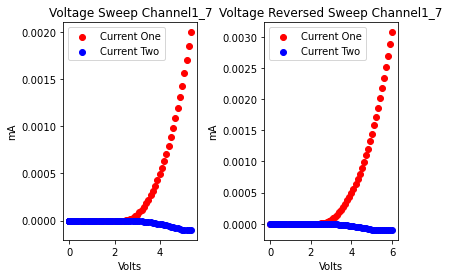

[-0.000581, 0.100004, 0.199992, 0.300012, 0.400009, 0.499983, 0.600008, 0.699115, 0.799985, 0.900596, 1.003074, 1.099994, 1.199983, 1.30002, 1.399997, 1.499993, 1.600016, 1.699997, 1.799986, 1.900015, 2.000003, 2.099982, 2.20002, 2.3, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


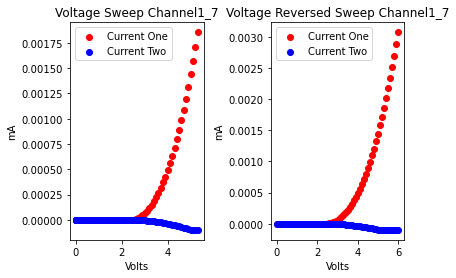

[-0.001146, 0.099992, 0.19999, 0.300022, 0.4, 0.499988, 0.600018, 0.699999, 0.79999, 0.900019, 0.99984, 1.099987, 1.200005, 1.300013, 1.399992, 1.500009, 1.600008, 1.69998, 1.800003, 1.900015, 1.999982, 2.100013, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


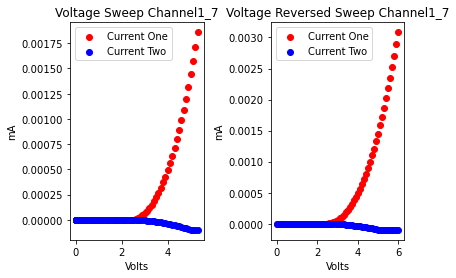

[-1.6e-05, 0.100018, 0.199712, 0.305646, 0.402024, 0.500011, 0.599979, 0.70001, 0.800014, 0.899982, 1.000004, 1.100011, 1.199986, 1.300006, 1.400016, 1.49999, 1.600001, 1.700018, 1.799988, 1.899999, 2.000015, 2.099983, 2.2, 2.30002, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


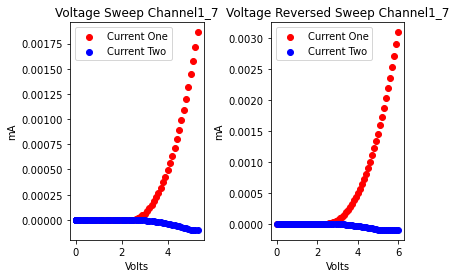

[8.4e-05, 0.104374, 0.201756, 0.299995, 0.399989, 0.500018, 0.6, 0.699987, 0.800018, 0.899999, 0.999985, 1.100016, 1.200004, 1.299984, 1.400011, 1.500012, 1.599991, 1.700012, 1.800008, 1.899982, 2.000007, 2.100022, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


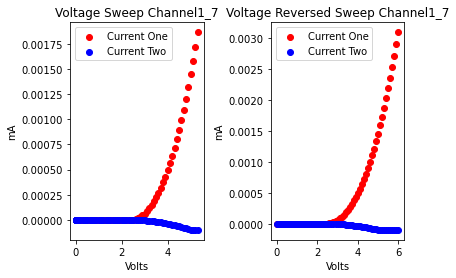

[0.001268, 0.102686, 0.202931, 0.299981, 0.400004, 0.500015, 0.599987, 0.7, 0.800017, 0.900507, 1.005136, 1.103159, 1.199989, 1.29999, 1.40002, 1.499998, 1.599992, 1.700018, 1.799998, 1.899987, 2.000012, 2.100002, 2.19998, 2.30002, 2.4, 2.5, 2.59999, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


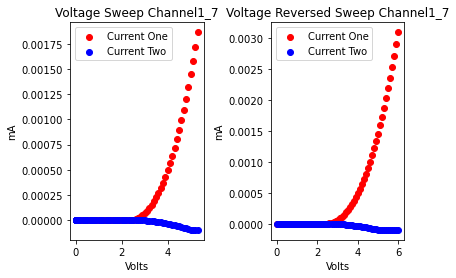

[0.000394, 0.104018, 0.201761, 0.299995, 0.401062, 0.50189, 0.600011, 0.699989, 0.800013, 0.899115, 0.999987, 1.1, 1.200016, 1.299985, 1.399999, 1.500016, 1.599985, 1.699997, 1.800016, 1.899994, 1.999997, 2.100013, 2.19999, 2.29999, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


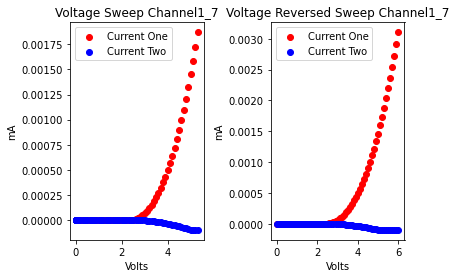

[0.000443, 0.103792, 0.201856, 0.299991, 0.399984, 0.50002, 0.599997, 0.701125, 0.802339, 0.900007, 0.999986, 1.100006, 1.200017, 1.299978, 1.400001, 1.500013, 1.599981, 1.700003, 1.80002, 1.899987, 2.000006, 2.10001, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.09999, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


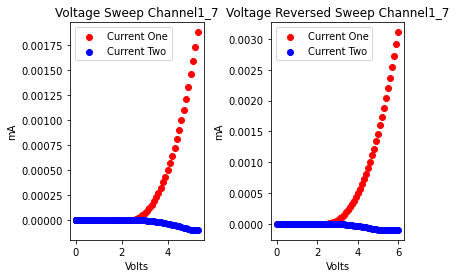

[-0.000317, 0.100015, 0.199983, 0.300008, 0.40001, 0.499983, 0.600005, 0.700012, 0.800605, 0.904631, 1.002872, 1.099996, 1.199985, 1.30002, 1.399997, 1.499989, 1.600017, 1.699997, 1.799986, 1.900015, 2.000003, 2.099982, 2.20001, 2.3, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


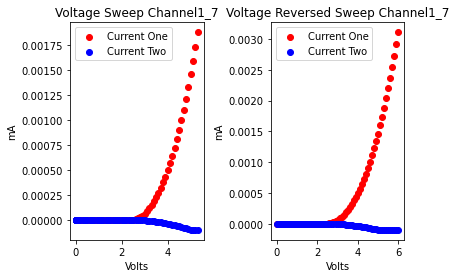

[-0.000815, 0.100011, 0.199983, 0.300002, 0.400019, 0.499983, 0.600005, 0.70001, 0.800943, 0.903659, 1.003196, 1.09999, 1.199992, 1.300015, 1.399995, 1.499991, 1.600016, 1.699997, 1.79999, 1.900018, 1.999994, 2.099986, 2.20001, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


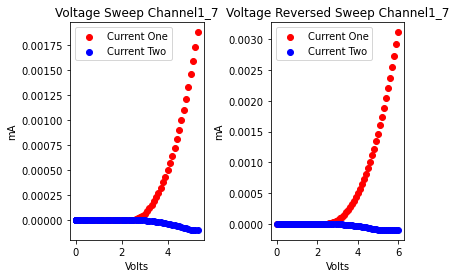

[0.000223, 0.104439, 0.20204, 0.299998, 0.399985, 0.50002, 0.600002, 0.699986, 0.800012, 0.90001, 1.001262, 1.104207, 1.200012, 1.299987, 1.399999, 1.500017, 1.599987, 1.699997, 1.800017, 1.899992, 1.999993, 2.100014, 2.19999, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.09999, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


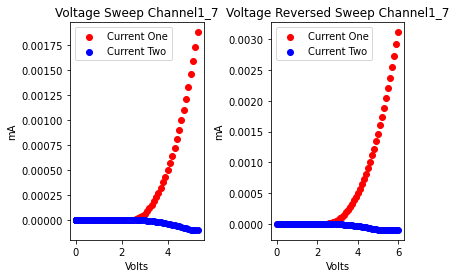

[-0.000802, 0.09998, 0.200009, 0.300014, 0.399982, 0.500007, 0.600012, 0.699986, 0.800001, 0.900015, 1.000856, 1.104837, 1.200016, 1.299998, 1.399988, 1.500021, 1.599993, 1.699984, 1.80002, 1.899999, 1.999991, 2.100019, 2.19999, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


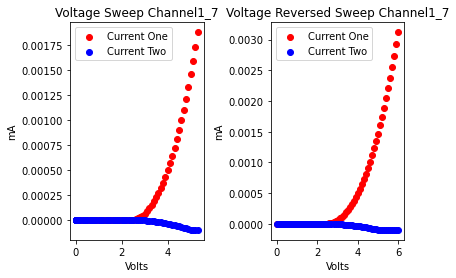

[-0.001026, 0.099984, 0.200001, 0.30002, 0.39999, 0.499997, 0.600014, 0.699995, 0.799995, 0.900026, 1.000244, 1.099982, 1.200009, 1.300012, 1.399986, 1.500012, 1.60001, 1.699979, 1.800004, 1.900016, 1.999985, 2.100006, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


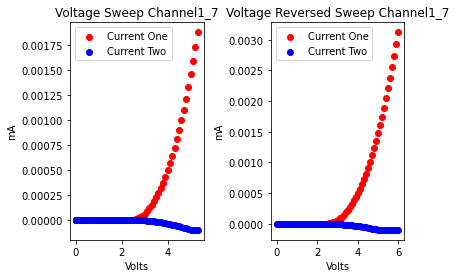

[0.001236, 0.102186, 0.200011, 0.29998, 0.400002, 0.500016, 0.599987, 0.7, 0.800017, 0.900581, 1.004871, 1.103257, 1.199995, 1.299983, 1.400021, 1.499997, 1.599992, 1.700017, 1.799997, 1.899986, 2.000018, 2.100002, 2.19998, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


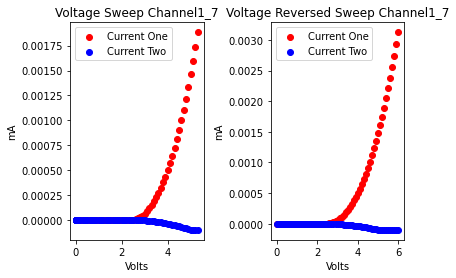

[-0.001148, 0.099992, 0.199985, 0.298987, 0.400006, 0.49999, 0.600008, 0.70001, 0.79998, 0.900006, 1.000013, 1.101016, 1.204876, 1.300016, 1.399989, 1.499992, 1.600017, 1.699996, 1.799991, 1.900022, 1.999997, 2.099984, 2.20002, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


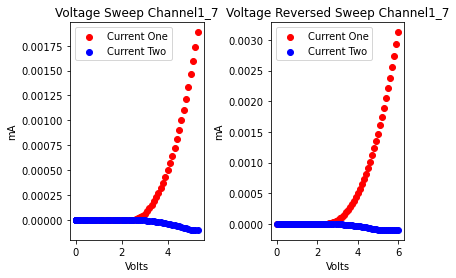

[-0.000482, 0.100013, 0.199983, 0.300012, 0.400016, 0.499982, 0.600003, 0.700011, 0.800758, 0.904131, 1.002918, 1.099996, 1.199986, 1.300021, 1.399997, 1.499989, 1.600017, 1.699997, 1.799988, 1.900017, 1.999996, 2.099983, 2.20001, 2.3, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


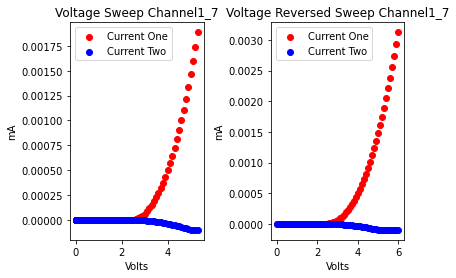

[-0.001146, 0.099996, 0.199987, 0.300019, 0.40001, 0.501226, 0.602644, 0.702952, 0.799986, 0.900002, 1.000015, 1.099991, 1.200899, 1.303912, 1.399998, 1.499989, 1.600009, 1.700009, 1.799981, 1.900008, 2.00001, 2.099985, 2.2, 2.30002, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


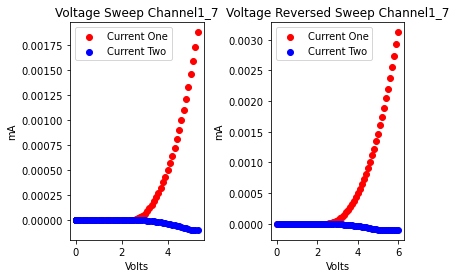

[0.001246, 0.102377, 0.200012, 0.300726, 0.403585, 0.501966, 0.599995, 0.699984, 0.800018, 0.899994, 0.999989, 1.100018, 1.200085, 1.299982, 1.400011, 1.500005, 1.599983, 1.700013, 1.80001, 1.899986, 2.000006, 2.100015, 2.19997, 2.3, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.49999, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


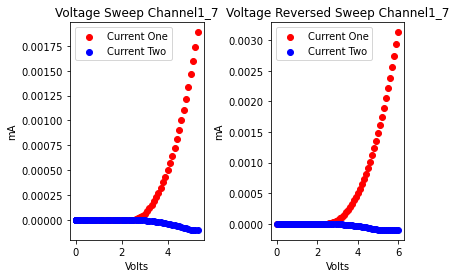

[0.000717, 0.103761, 0.201892, 0.299996, 0.39999, 0.500017, 0.600002, 0.701175, 0.802536, 0.900016, 0.999983, 1.100037, 1.200017, 1.299995, 1.399987, 1.500017, 1.599994, 1.699984, 1.800021, 1.900006, 1.999985, 2.100003, 2.20002, 2.29998, 2.4, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


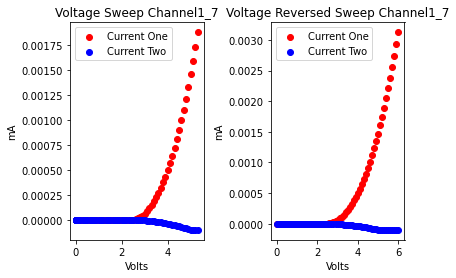

[-0.001102, 0.100005, 0.199986, 0.300005, 0.400016, 0.499981, 0.600003, 0.700015, 0.799985, 0.9, 1.000015, 1.099984, 1.199999, 1.300016, 1.399992, 1.499994, 1.600018, 1.699995, 1.799987, 1.900013, 2.000004, 2.09998, 2.20001, 2.3, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


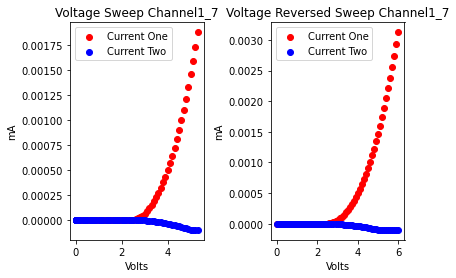

[0.000405, 0.102775, 0.201942, 0.299993, 0.399994, 0.500022, 0.599998, 0.699983, 0.80002, 0.899995, 0.99999, 1.099076, 1.200012, 1.299988, 1.400007, 1.500013, 1.599984, 1.700012, 1.80001, 1.899984, 2.000005, 2.100015, 2.19998, 2.3, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


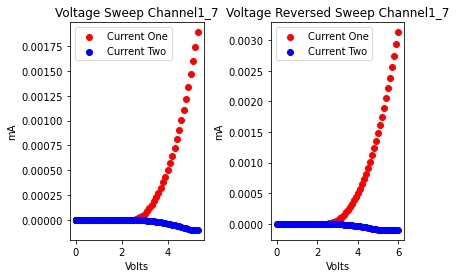

[-0.001134, 0.099992, 0.201148, 0.302135, 0.400015, 0.499983, 0.600004, 0.700014, 0.799986, 0.900002, 1.000014, 1.099995, 1.199988, 1.30002, 1.399994, 1.499989, 1.600014, 1.700002, 1.799983, 1.900012, 2.000011, 2.09998, 2.2, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


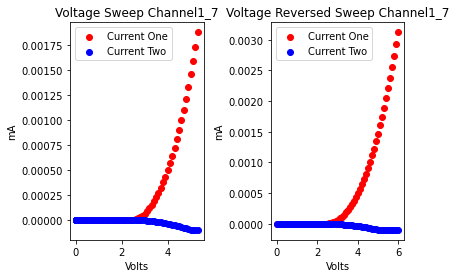

[-0.001018, 0.099984, 0.199999, 0.30002, 0.399983, 0.499999, 0.600011, 0.699995, 0.799996, 0.900019, 1.000254, 1.099985, 1.200017, 1.300002, 1.399983, 1.500008, 1.60001, 1.699991, 1.800009, 1.90001, 1.999981, 2.100001, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.39999, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


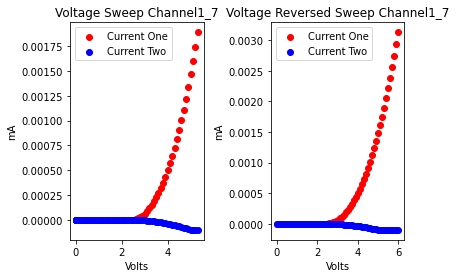

[-0.001232, 0.1, 0.199987, 0.300017, 0.400002, 0.499984, 0.600012, 0.700008, 0.799983, 0.900007, 1.000006, 1.09998, 1.200006, 1.300018, 1.399982, 1.500005, 1.600012, 1.699985, 1.800004, 1.900013, 1.999989, 2.099998, 2.20001, 2.29998, 2.4, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


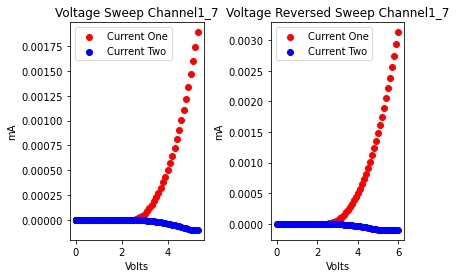

[0.001242, 0.102462, 0.200011, 0.299983, 0.400004, 0.500018, 0.599986, 0.7, 0.80002, 0.899988, 0.999998, 1.100012, 1.19999, 1.299995, 1.40002, 1.499998, 1.599986, 1.700026, 1.799998, 1.899988, 2.000016, 2.099996, 2.19999, 2.30002, 2.4, 2.5, 2.59999, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


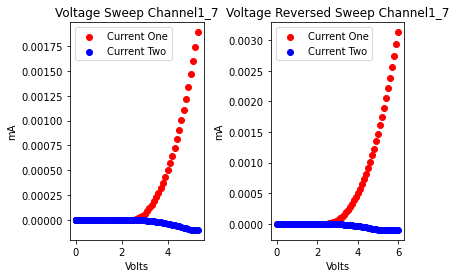

[-1.7e-05, 0.100008, 0.200008, 0.299988, 0.400007, 0.499101, 0.599986, 0.7, 0.80002, 0.899989, 1.0, 1.100016, 1.19999, 1.300733, 1.404293, 1.499993, 1.599989, 1.700019, 1.8, 1.899987, 2.000017, 2.100001, 2.19998, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


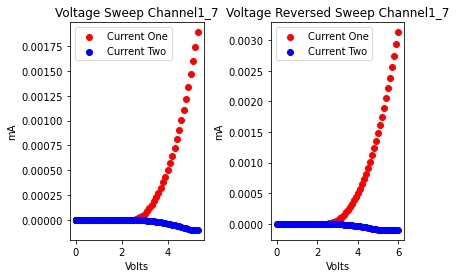

[0.001194, 0.101703, 0.200011, 0.299981, 0.400008, 0.500008, 0.59998, 0.700005, 0.799073, 0.899989, 0.999998, 1.100012, 1.199996, 1.299991, 1.400025, 1.499997, 1.599983, 1.700018, 1.799997, 1.89999, 2.000018, 2.099999, 2.19999, 2.30002, 2.4, 2.5, 2.59999, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


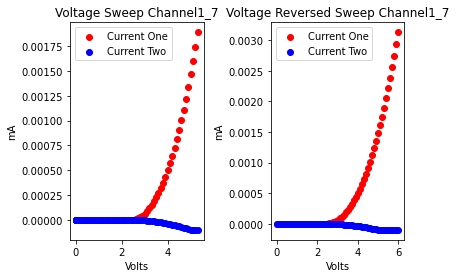

[-1.4e-05, 0.104619, 0.201732, 0.300005, 0.399985, 0.500014, 0.600011, 0.699986, 0.800007, 0.900016, 1.001107, 1.10416, 1.200017, 1.299994, 1.399993, 1.500014, 1.599996, 1.699988, 1.800021, 1.899995, 1.999989, 2.100016, 2.2, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


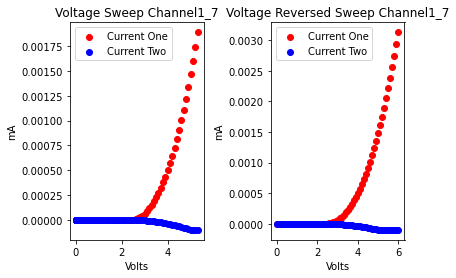

[-0.001046, 0.09999, 0.199998, 0.300015, 0.399997, 0.499985, 0.600022, 0.699998, 0.799984, 0.900024, 0.999997, 1.09999, 1.200019, 1.3, 1.399988, 1.500016, 1.599997, 1.699984, 1.800017, 1.900004, 1.999988, 2.100017, 2.2, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.40001, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


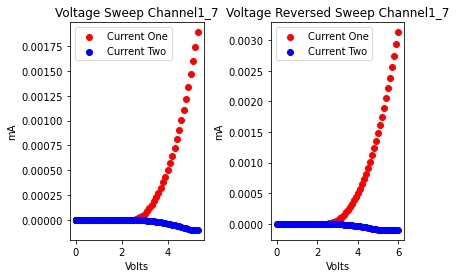

[0.001083, 0.101828, 0.20001, 0.299985, 0.400011, 0.500008, 0.601219, 0.702652, 0.802975, 0.899984, 1.0, 1.098914, 1.199992, 1.299991, 1.400026, 1.499994, 1.599984, 1.700019, 1.799996, 1.899989, 2.000018, 2.099994, 2.19998, 2.30001, 2.4, 2.5, 2.59999, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


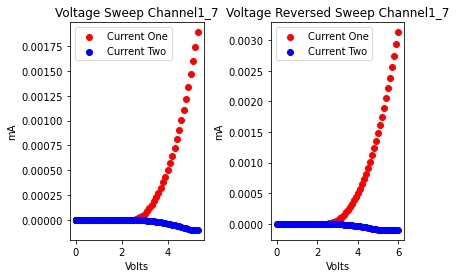

[0.000276, 0.102849, 0.199987, 0.299999, 0.400018, 0.500542, 0.60435, 0.701947, 0.799993, 0.901047, 1.002981, 1.100006, 1.199992, 1.299695, 1.400016, 1.499988, 1.599999, 1.70002, 1.799987, 1.900001, 2.000013, 2.099991, 2.19999, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.89999, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


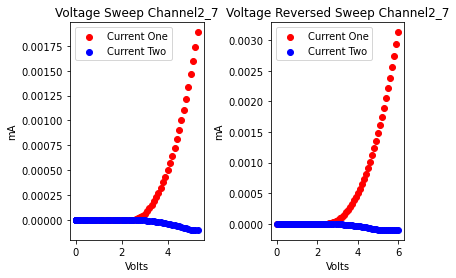

[-0.000356, 0.104548, 0.201644, 0.300002, 0.399984, 0.500015, 0.600004, 0.701254, 0.802723, 0.900014, 0.999987, 1.099998, 1.200017, 1.299984, 1.4, 1.500017, 1.599995, 1.699999, 1.800016, 1.89999, 1.999991, 2.100017, 2.19999, 2.29999, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


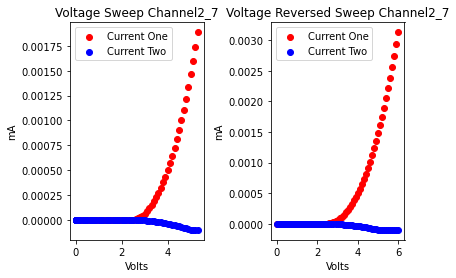

[-0.001112, 0.100003, 0.199987, 0.300013, 0.400006, 0.499991, 0.60001, 0.700006, 0.799981, 0.900008, 0.999029, 1.099988, 1.199996, 1.300017, 1.399992, 1.49999, 1.600017, 1.699994, 1.799993, 1.900021, 1.999994, 2.099988, 2.20002, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


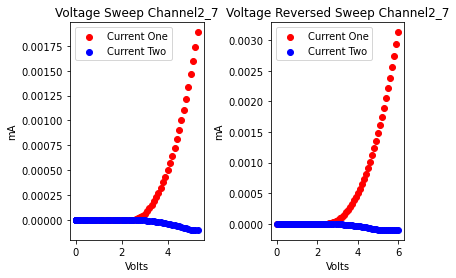

[-0.000709, 0.100014, 0.199979, 0.300009, 0.400018, 0.499981, 0.600008, 0.700011, 0.799982, 0.900007, 1.000013, 1.099988, 1.200508, 1.300021, 1.399996, 1.49999, 1.600018, 1.699997, 1.799989, 1.900016, 1.999996, 2.09999, 2.20002, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


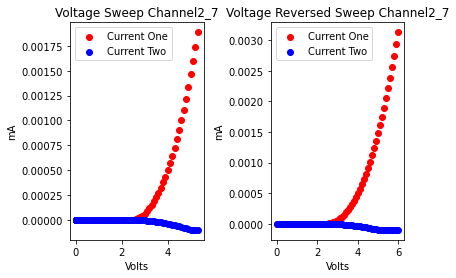

[0.000738, 0.101984, 0.199989, 0.299992, 0.400011, 0.500374, 0.6044, 0.701976, 0.799997, 0.899987, 1.000017, 1.100002, 1.199987, 1.300019, 1.400004, 1.499985, 1.600013, 1.700011, 1.799984, 1.900008, 2.000011, 2.099978, 2.2, 2.30001, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


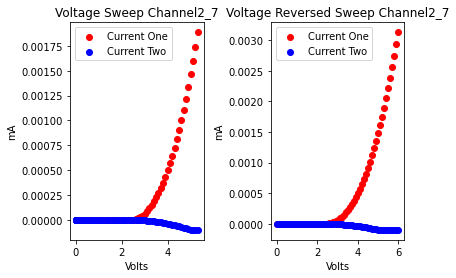

[0.000365, 0.102575, 0.199984, 0.3, 0.400018, 0.500428, 0.604112, 0.702288, 0.799997, 0.89999, 1.000018, 1.099999, 1.199985, 1.300017, 1.400004, 1.499986, 1.600015, 1.700006, 1.799987, 1.900011, 2.000008, 2.099979, 2.2, 2.30001, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


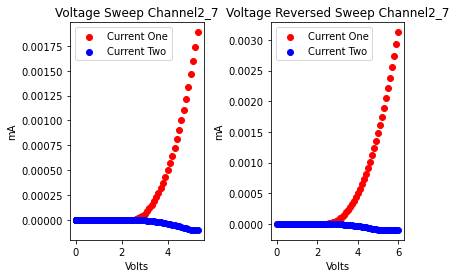

[-0.001053, 0.099986, 0.200001, 0.300019, 0.399992, 0.499988, 0.600019, 0.699996, 0.799984, 0.900019, 1.000007, 1.09999, 1.200008, 1.299118, 1.399974, 1.499998, 1.600018, 1.699989, 1.799999, 1.900013, 1.999992, 2.099992, 2.20001, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


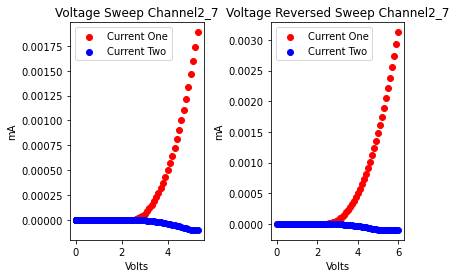

[-0.000248, 0.104539, 0.201748, 0.30001, 0.399981, 0.500006, 0.600016, 0.701114, 0.803006, 0.900017, 1.000589, 1.105262, 1.203705, 1.299993, 1.399984, 1.500017, 1.599994, 1.699989, 1.80002, 1.899997, 1.999987, 2.100019, 2.2, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


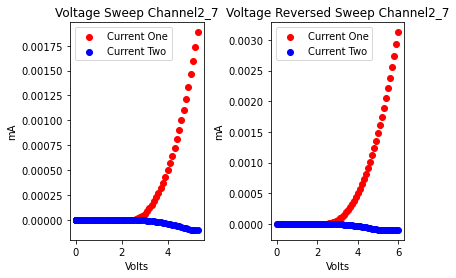

[-0.000682, 0.105301, 0.202338, 0.300016, 0.399982, 0.500003, 0.60001, 0.699985, 0.800003, 0.900017, 1.000811, 1.104919, 1.200015, 1.299997, 1.399986, 1.50002, 1.599996, 1.699983, 1.800018, 1.899998, 1.999992, 2.100017, 2.19999, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


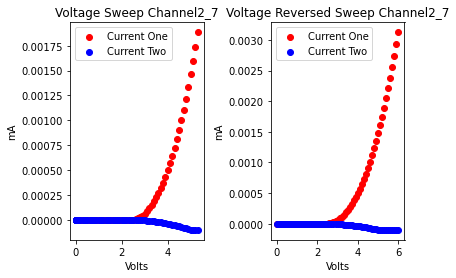

[0.000571, 0.10243, 0.199993, 0.299992, 0.400023, 0.500177, 0.604796, 0.701787, 0.799998, 0.901183, 1.003037, 1.100011, 1.199982, 1.300005, 1.400017, 1.499988, 1.600006, 1.700018, 1.799986, 1.900006, 2.000014, 2.099988, 2.2, 2.30001, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


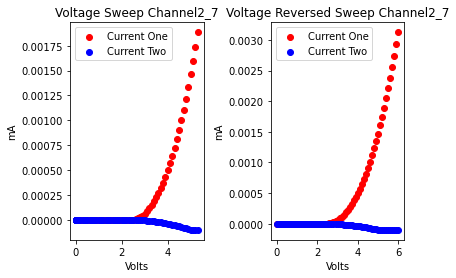

[0.001251, 0.102631, 0.202476, 0.299984, 0.399999, 0.500017, 0.599988, 0.699997, 0.800018, 0.899995, 0.999996, 1.100014, 1.199991, 1.300864, 1.400014, 1.500003, 1.599984, 1.700009, 1.800006, 1.899987, 2.00001, 2.10001, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


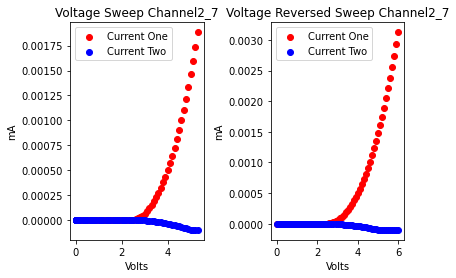

[0.00115, 0.101903, 0.200004, 0.299983, 0.400018, 0.500004, 0.599983, 0.700006, 0.800009, 0.899988, 1.000011, 1.0991, 1.199985, 1.300001, 1.400018, 1.499986, 1.599999, 1.70002, 1.799988, 1.899992, 2.000014, 2.099997, 2.19999, 2.30002, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.89999, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


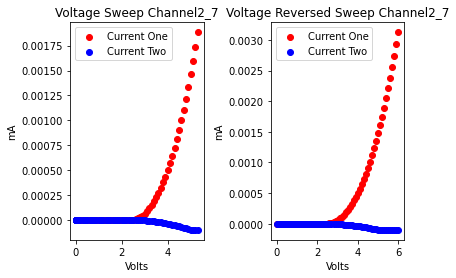

[-0.001128, 0.099992, 0.201009, 0.301808, 0.400011, 0.49999, 0.600011, 0.700006, 0.79998, 0.900004, 1.000016, 1.10107, 1.204629, 1.300021, 1.399981, 1.5, 1.600016, 1.699991, 1.799993, 1.900015, 1.999997, 2.099983, 2.20002, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


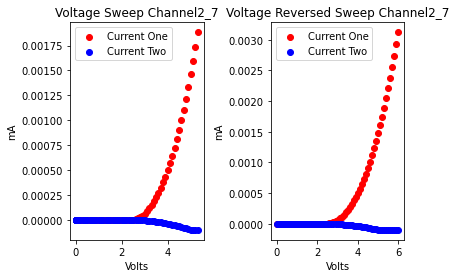

[-0.001227, 0.099994, 0.19999, 0.300021, 0.399999, 0.499983, 0.600015, 0.700003, 0.801135, 0.902546, 1.000017, 1.099984, 1.200006, 1.300012, 1.399983, 1.500006, 1.600018, 1.699987, 1.799999, 1.900017, 1.999984, 2.1, 2.20001, 2.29998, 2.4, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


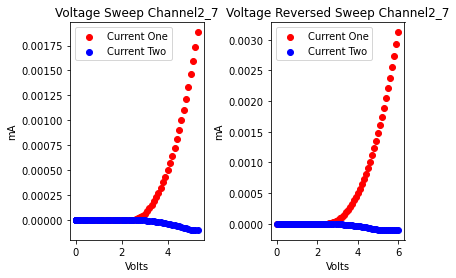

[-0.001221, 0.099994, 0.199989, 0.300022, 0.4, 0.499984, 0.600015, 0.700001, 0.799983, 0.900009, 1.000007, 1.099991, 1.200007, 1.300015, 1.399979, 1.500006, 1.600017, 1.699982, 1.800008, 1.89898, 1.99999, 2.099998, 2.20001, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


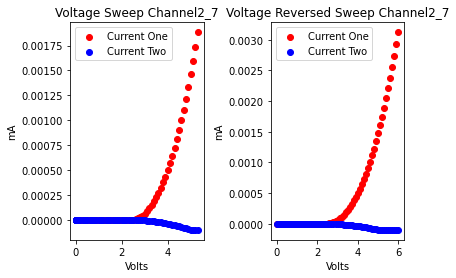

[0.000938, 0.10162, 0.200002, 0.299981, 0.399471, 0.500013, 0.599984, 0.700004, 0.800014, 0.899982, 1.000006, 1.098919, 1.199993, 1.29999, 1.400017, 1.499995, 1.599994, 1.700023, 1.799998, 1.899985, 2.000019, 2.099991, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


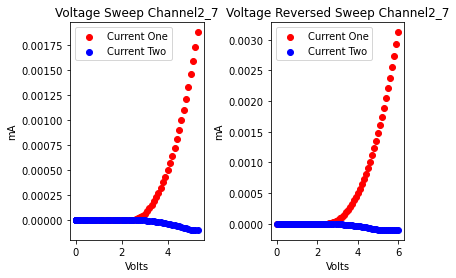

[0.000895, 0.101916, 0.199993, 0.300901, 0.400598, 0.499997, 0.599986, 0.700013, 0.800002, 0.899983, 1.000009, 1.100007, 1.199985, 1.299594, 1.400012, 1.499987, 1.600004, 1.700017, 1.799986, 1.900002, 2.000017, 2.099989, 2.2, 2.30001, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.89999, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


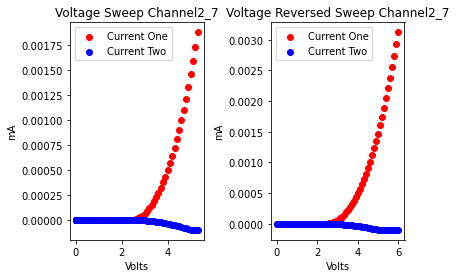

[-0.00033, 0.102569, 0.199987, 0.3, 0.400018, 0.499983, 0.599999, 0.700012, 0.800381, 0.905148, 1.002556, 1.099993, 1.199989, 1.300019, 1.399995, 1.499986, 1.600015, 1.700004, 1.799984, 1.900018, 2.000003, 2.099981, 2.20001, 2.3, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


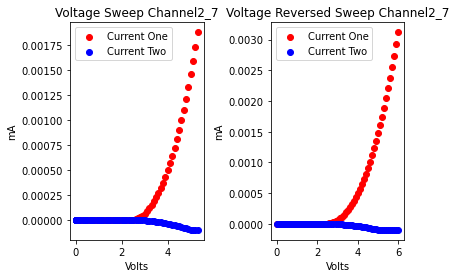

[-1.4e-05, 0.100018, 0.200004, 0.299986, 0.400009, 0.500008, 0.59998, 0.700003, 0.800016, 0.899983, 1.000004, 1.100012, 1.199985, 1.300004, 1.400017, 1.499988, 1.600002, 1.70002, 1.799994, 1.899994, 2.000016, 2.099993, 2.2, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


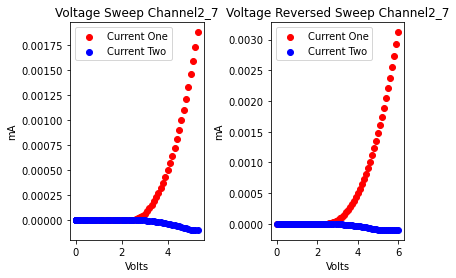

[-0.001068, 0.099988, 0.199996, 0.298739, 0.399998, 0.499985, 0.600015, 0.699997, 0.799985, 0.900019, 1.000004, 1.09999, 1.200013, 1.300008, 1.399982, 1.500004, 1.600017, 1.699984, 1.800007, 1.900013, 1.999984, 2.100005, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


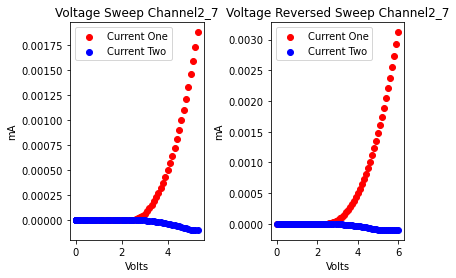

[-0.001157, 0.099995, 0.199984, 0.300026, 0.399991, 0.499986, 0.600018, 0.699996, 0.799991, 0.90002, 0.999996, 1.09999, 1.200016, 1.299997, 1.399986, 1.500015, 1.599998, 1.699985, 1.80002, 1.900004, 1.999986, 2.100009, 2.20001, 2.29999, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


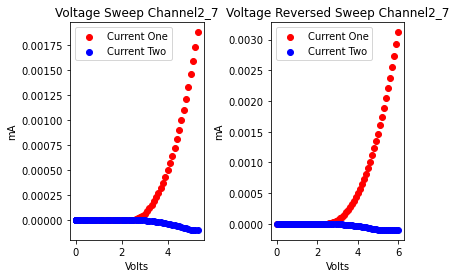

[-0.000435, 0.10001, 0.199985, 0.300006, 0.400019, 0.499981, 0.600004, 0.700009, 0.799984, 0.900005, 1.000015, 1.099986, 1.200558, 1.300022, 1.399992, 1.499984, 1.600019, 1.699997, 1.79999, 1.900015, 1.999999, 2.099988, 2.20001, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


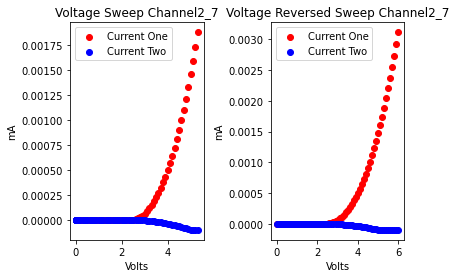

[-1.8e-05, 0.100018, 0.20004, 0.30489, 0.40179, 0.500003, 0.599991, 0.700011, 0.800011, 0.901238, 1.003526, 1.100014, 1.199987, 1.300557, 1.400023, 1.499998, 1.59999, 1.700018, 1.799997, 1.899987, 2.000014, 2.100001, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.49999, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


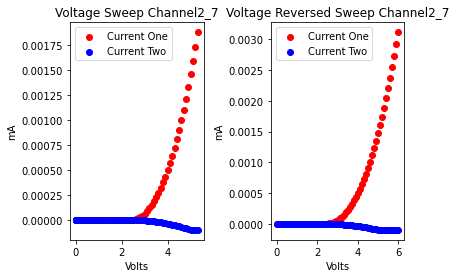

[-0.000399, 0.100006, 0.199979, 0.300005, 0.40002, 0.501019, 0.603325, 0.702681, 0.79999, 0.899991, 1.000016, 1.099996, 1.199994, 1.300023, 1.399993, 1.499986, 1.600018, 1.699997, 1.799986, 1.900017, 1.999998, 2.099985, 2.20002, 2.3, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


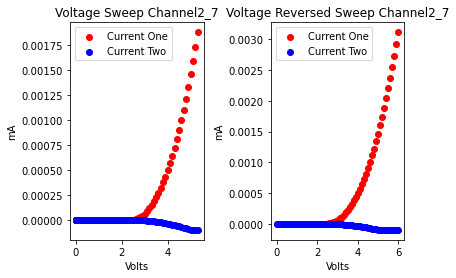

[0.000505, 0.103103, 0.202422, 0.299989, 0.39999, 0.500016, 0.599996, 0.699995, 0.800018, 0.900284, 1.00562, 1.102963, 1.199997, 1.299986, 1.399355, 1.500015, 1.599984, 1.700006, 1.800011, 1.899986, 2.00001, 2.100016, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.49999, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


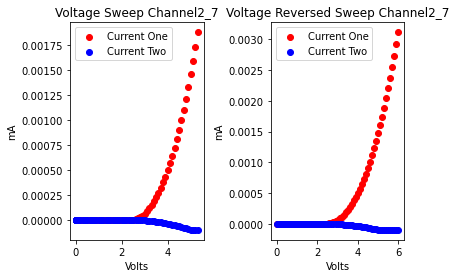

[-0.001054, 0.099988, 0.2, 0.300017, 0.399991, 0.49999, 0.600019, 0.699993, 0.799996, 0.90002, 1.000227, 1.099985, 1.199493, 1.300011, 1.399984, 1.500004, 1.600013, 1.699983, 1.800004, 1.900014, 1.999985, 2.099998, 2.20002, 2.29999, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


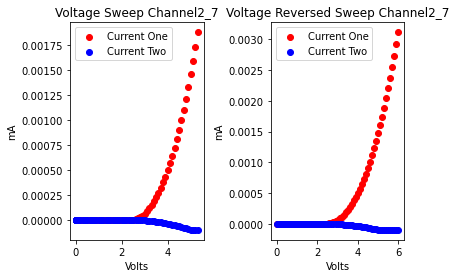

[-0.001185, 0.099995, 0.199994, 0.300026, 0.399993, 0.499986, 0.600017, 0.7, 0.799989, 0.900017, 0.999998, 1.101119, 1.203768, 1.300013, 1.399979, 1.500003, 1.600012, 1.699982, 1.800003, 1.900012, 1.999986, 2.100002, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


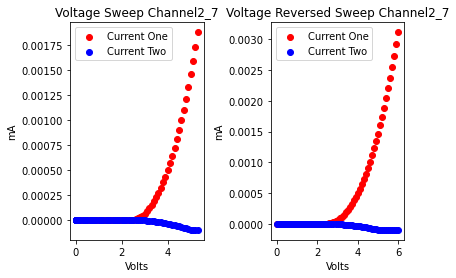

[-1.9e-05, 0.100017, 0.199995, 0.299982, 0.400015, 0.500002, 0.599984, 0.70001, 0.800009, 0.899986, 1.000007, 1.099036, 1.199983, 1.300001, 1.400021, 1.499989, 1.599999, 1.700016, 1.799992, 1.899991, 2.000018, 2.099998, 2.19998, 2.30002, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.49999, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


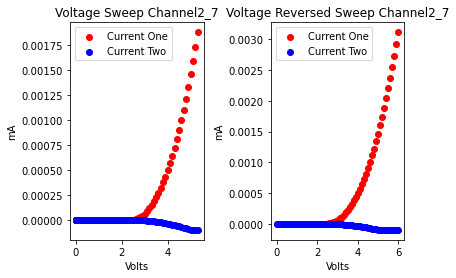

[0.000436, 0.103608, 0.202137, 0.299992, 0.399986, 0.500021, 0.599997, 0.701138, 0.802143, 0.900009, 1.00121, 1.10434, 1.200016, 1.299983, 1.399999, 1.500015, 1.599989, 1.69999, 1.80002, 1.899998, 1.999983, 2.100019, 2.19999, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


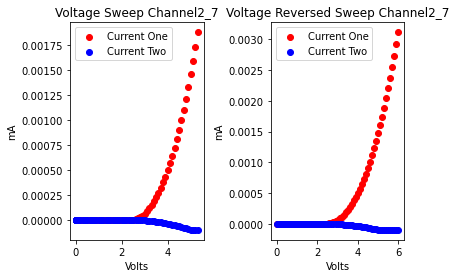

[-0.001127, 0.099996, 0.199985, 0.30002, 0.399997, 0.499989, 0.600017, 0.699996, 0.799984, 0.899344, 1.000015, 1.099984, 1.200003, 1.300014, 1.399983, 1.500005, 1.600016, 1.699982, 1.800001, 1.900016, 1.999989, 2.099995, 2.20001, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.09999, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


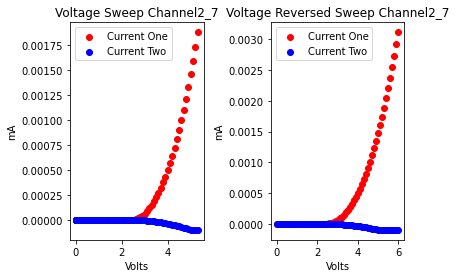

[-0.001151, 0.099991, 0.19999, 0.300023, 0.399954, 0.505081, 0.60201, 0.70001, 0.799983, 0.900006, 0.999041, 1.099984, 1.199999, 1.30002, 1.399992, 1.499989, 1.600018, 1.699997, 1.799984, 1.900021, 1.999993, 2.099989, 2.20001, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


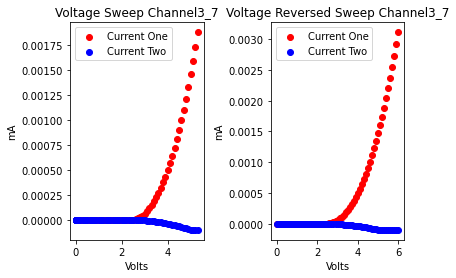

[0.001122, 0.101856, 0.200007, 0.299976, 0.400004, 0.500015, 0.599981, 0.700005, 0.800015, 0.899982, 1.000003, 1.100016, 1.199986, 1.299999, 1.400022, 1.499987, 1.600001, 1.700013, 1.799991, 1.899997, 2.000015, 2.099998, 2.19999, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


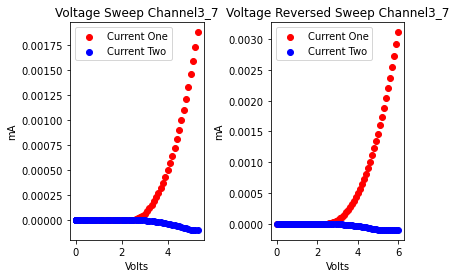

[-0.001097, 0.099987, 0.199988, 0.300019, 0.400309, 0.504732, 0.60171, 0.699997, 0.799984, 0.900018, 0.999425, 1.099983, 1.200005, 1.300011, 1.40096, 1.506138, 1.600017, 1.699997, 1.799989, 1.900017, 1.999996, 2.099988, 2.20002, 2.3, 2.39998, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


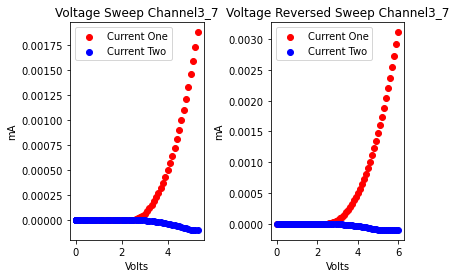

[0.001123, 0.101185, 0.200002, 0.3013, 0.402602, 0.502917, 0.599982, 0.700004, 0.800016, 0.899986, 1.000003, 1.100017, 1.199992, 1.299991, 1.40002, 1.499996, 1.599998, 1.700024, 1.799998, 1.899982, 2.000016, 2.099997, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


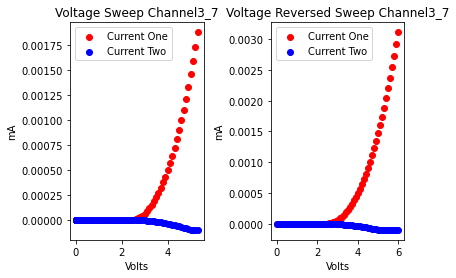

[-0.000226, 0.102781, 0.199984, 0.300005, 0.400012, 0.500876, 0.603639, 0.702179, 0.799991, 0.900927, 1.00275, 1.099993, 1.199985, 1.300015, 1.400005, 1.499985, 1.600008, 1.700009, 1.799986, 1.90001, 2.000007, 2.099977, 2.2, 2.30002, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


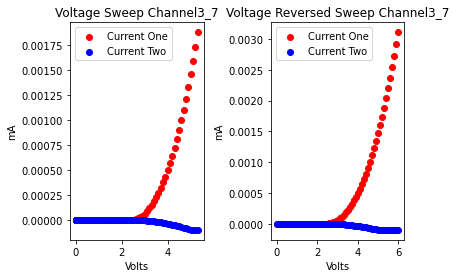

[-0.000786, 0.105255, 0.202038, 0.30001, 0.399981, 0.500002, 0.600017, 0.699985, 0.800006, 0.898945, 0.999996, 1.099985, 1.198946, 1.300002, 1.399984, 1.500015, 1.600003, 1.699985, 1.800013, 1.900011, 1.999987, 2.100003, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


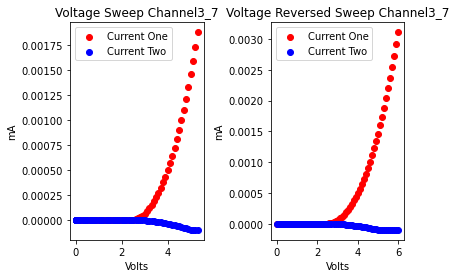

[-0.001098, 0.099993, 0.199993, 0.300024, 0.399995, 0.499991, 0.600023, 0.700241, 0.805042, 0.902595, 1.000003, 1.101171, 1.203836, 1.300018, 1.399983, 1.500004, 1.600014, 1.699984, 1.800004, 1.900012, 1.999986, 2.100007, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


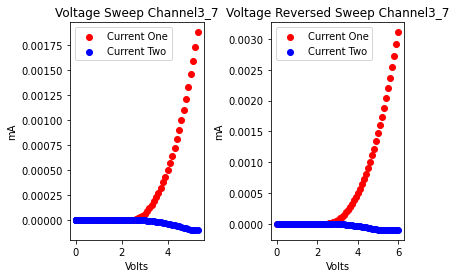

[-0.000461, 0.100009, 0.199984, 0.299803, 0.402408, 0.499986, 0.600657, 0.701949, 0.799992, 0.899989, 1.000017, 1.100055, 1.199989, 1.300011, 1.400009, 1.49998, 1.600005, 1.700019, 1.799977, 1.90001, 2.000013, 2.099981, 2.20001, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


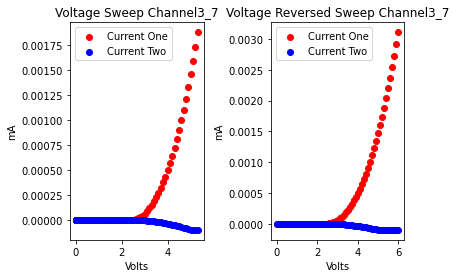

[-2e-05, 0.100016, 0.200003, 0.299982, 0.400011, 0.500011, 0.601244, 0.702568, 0.80001, 0.899984, 1.000006, 1.098895, 1.199995, 1.299982, 1.40002, 1.499997, 1.599991, 1.70002, 1.799996, 1.899987, 2.000014, 2.100004, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.89999, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


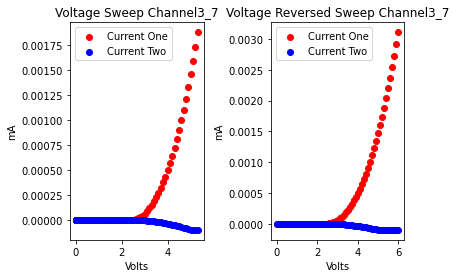

[-0.000444, 0.105262, 0.201096, 0.300011, 0.399982, 0.500003, 0.600016, 0.701024, 0.803386, 0.900016, 0.999994, 1.099997, 1.200014, 1.29999, 1.399989, 1.49875, 1.599996, 1.699986, 1.80002, 1.899998, 1.999986, 2.100016, 2.2, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


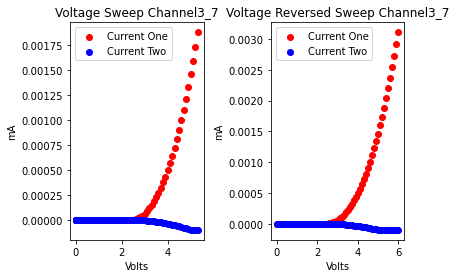

[-0.000468, 0.100006, 0.201196, 0.302472, 0.402828, 0.499982, 0.600004, 0.700012, 0.799986, 0.900361, 1.002972, 1.099994, 1.199991, 1.300022, 1.399993, 1.499989, 1.600018, 1.699997, 1.799991, 1.900018, 1.999998, 2.099983, 2.20002, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


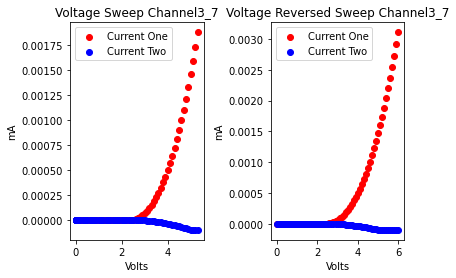

[0.001136, 0.102018, 0.200009, 0.301102, 0.402796, 0.502367, 0.599983, 0.699997, 0.800018, 0.900447, 1.004724, 1.103211, 1.199989, 1.29999, 1.40002, 1.499999, 1.59999, 1.700016, 1.800004, 1.899987, 2.000016, 2.100001, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


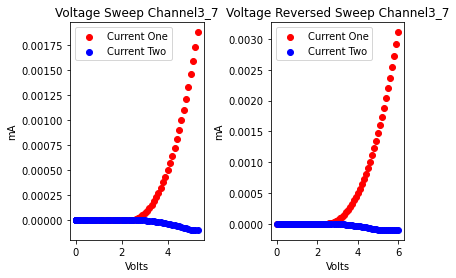

[-0.000661, 0.100008, 0.199986, 0.300004, 0.400014, 0.499976, 0.600009, 0.700016, 0.801043, 0.903414, 1.000017, 1.100381, 1.199985, 1.300017, 1.399998, 1.499987, 1.600012, 1.700005, 1.799982, 1.90001, 2.000005, 2.09999, 2.20001, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


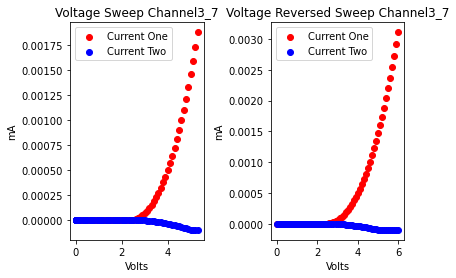

[-0.00033, 0.103, 0.199983, 0.300004, 0.398888, 0.499996, 0.599989, 0.700017, 0.799994, 0.899985, 1.000019, 1.099996, 1.199988, 1.300021, 1.399827, 1.499985, 1.600004, 1.70002, 1.799982, 1.900008, 2.000013, 2.099982, 2.2, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


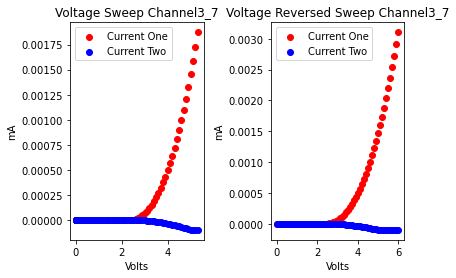

[-1e-05, 0.100003, 0.200015, 0.300615, 0.403677, 0.501868, 0.599989, 0.699987, 0.800019, 0.899996, 0.999992, 1.100016, 1.199998, 1.299984, 1.400019, 1.500001, 1.599984, 1.700018, 1.800004, 1.89999, 2.000008, 2.100011, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


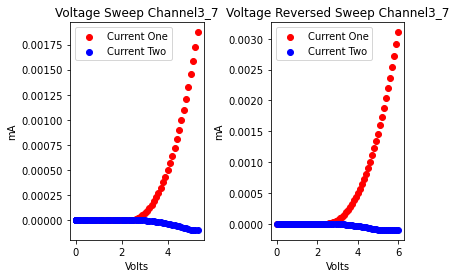

[-1.4e-05, 0.100006, 0.200013, 0.300989, 0.402981, 0.502215, 0.59999, 0.699998, 0.800015, 0.899997, 0.999993, 1.100023, 1.199997, 1.299981, 1.400024, 1.499997, 1.599992, 1.700018, 1.799996, 1.899987, 2.000017, 2.100002, 2.19998, 2.30002, 2.4, 2.5, 2.59999, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


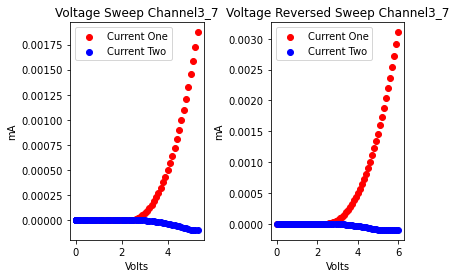

[0.000863, 0.101778, 0.199993, 0.299989, 0.400018, 0.499766, 0.59998, 0.700003, 0.799083, 0.899983, 1.0, 1.100015, 1.199989, 1.29999, 1.400023, 1.499999, 1.599997, 1.700026, 1.799998, 1.899986, 2.000018, 2.099994, 2.19999, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


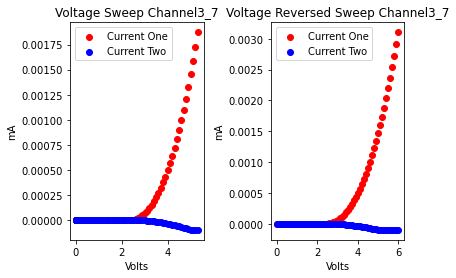

[-2e-05, 0.100016, 0.2, 0.299985, 0.400012, 0.499146, 0.599986, 0.700005, 0.800017, 0.900531, 1.004903, 1.103186, 1.199993, 1.299991, 1.400019, 1.499998, 1.599986, 1.700017, 1.800001, 1.899984, 2.000012, 2.100003, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


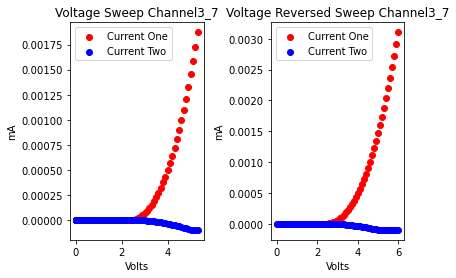

[-0.001053, 0.099989, 0.199999, 0.300013, 0.399988, 0.499992, 0.60002, 0.699995, 0.799984, 0.900019, 0.999998, 1.099993, 1.200019, 1.3, 1.39999, 1.500014, 1.599997, 1.699987, 1.800021, 1.900002, 1.999984, 2.100009, 2.2, 2.29999, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


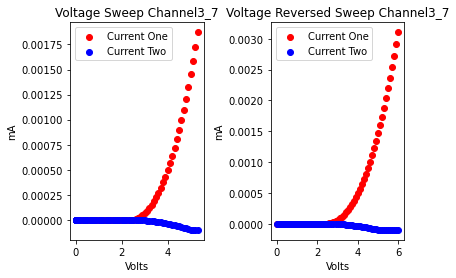

[0.000936, 0.101625, 0.199996, 0.299984, 0.40002, 0.500002, 0.599985, 0.700009, 0.800005, 0.899992, 1.000012, 1.099248, 1.199983, 1.300006, 1.400017, 1.499988, 1.6, 1.70002, 1.79999, 1.9, 2.000013, 2.099992, 2.19999, 2.30002, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


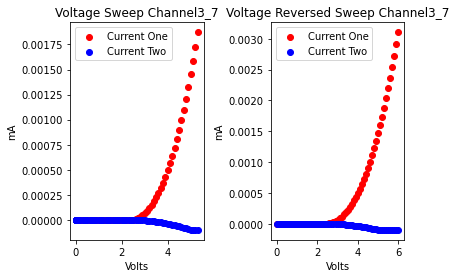

[-7.7e-05, 0.102709, 0.199984, 0.300001, 0.400015, 0.499985, 0.600002, 0.700016, 0.799988, 0.899994, 1.000014, 1.099997, 1.199989, 1.300022, 1.399995, 1.499991, 1.600019, 1.699999, 1.799986, 1.900013, 2.000001, 2.099981, 2.20001, 2.3, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


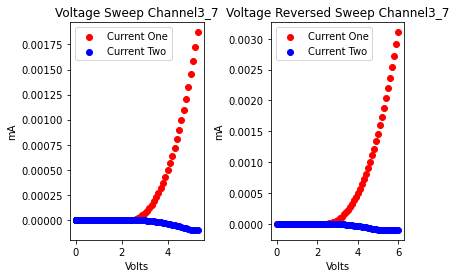

[-0.001018, 0.099983, 0.200002, 0.300019, 0.399993, 0.499989, 0.600016, 0.700297, 0.804929, 0.902173, 1.0, 1.099988, 1.200017, 1.300005, 1.399994, 1.500013, 1.600011, 1.699981, 1.800004, 1.900017, 1.999986, 2.100003, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


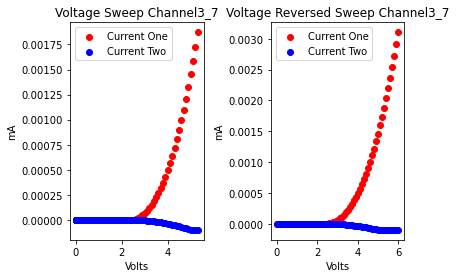

[-0.000455, 0.100015, 0.199985, 0.300006, 0.400011, 0.499983, 0.600004, 0.69895, 0.799996, 0.899984, 1.000017, 1.099996, 1.199991, 1.300019, 1.399996, 1.499989, 1.600016, 1.699996, 1.799986, 1.900015, 2.000003, 2.099985, 2.20003, 2.3, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


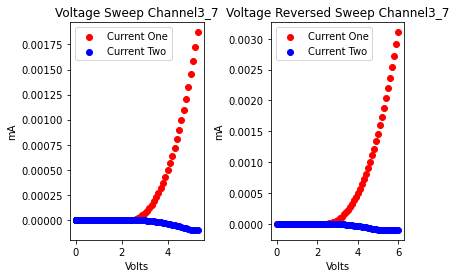

[-0.001131, 0.099994, 0.199986, 0.300017, 0.400001, 0.499983, 0.60001, 0.700007, 0.799991, 0.900008, 1.000011, 1.099983, 1.200003, 1.299035, 1.399987, 1.499993, 1.600013, 1.699996, 1.799988, 1.900022, 1.999995, 2.099989, 2.20002, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


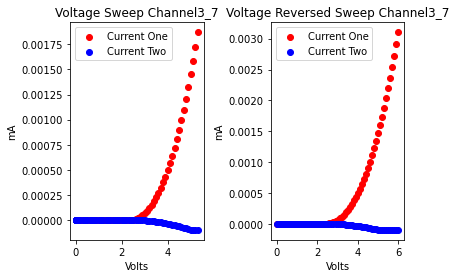

[-1.7e-05, 0.100017, 0.199998, 0.299986, 0.400014, 0.499997, 0.599986, 0.700016, 0.799354, 0.89998, 1.000006, 1.098913, 1.199991, 1.299996, 1.400027, 1.499999, 1.599982, 1.700022, 1.799993, 1.899989, 2.000019, 2.099998, 2.19999, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


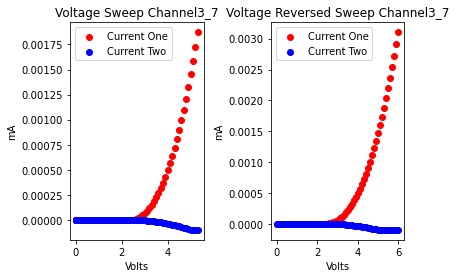

[-0.000648, 0.100005, 0.201306, 0.302519, 0.402702, 0.499983, 0.599998, 0.700015, 0.800531, 0.904551, 1.00272, 1.099994, 1.19999, 1.300019, 1.399997, 1.499986, 1.600015, 1.7, 1.799986, 1.90002, 2.000003, 2.099984, 2.20001, 2.3, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


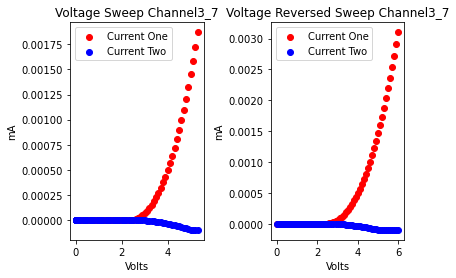

[-0.001012, 0.105398, 0.202036, 0.300019, 0.399983, 0.500003, 0.600011, 0.699985, 0.800003, 0.900013, 0.999986, 1.100005, 1.200012, 1.299984, 1.400004, 1.500013, 1.599987, 1.7, 1.800017, 1.899992, 1.999997, 2.10001, 2.19998, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


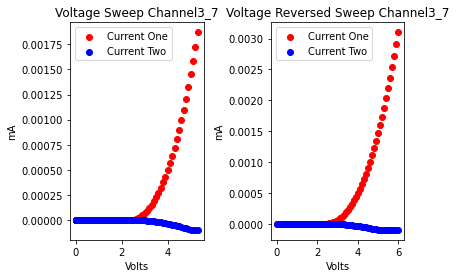

[-0.001046, 0.099995, 0.199987, 0.300018, 0.399997, 0.499989, 0.600019, 0.699997, 0.79999, 0.900017, 0.999997, 1.099985, 1.200016, 1.300003, 1.399984, 1.500008, 1.60001, 1.699984, 1.800009, 1.90001, 1.999984, 2.100002, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


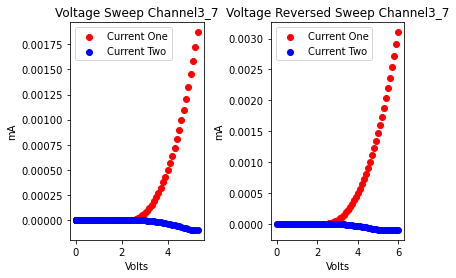

[-0.000507, 0.100017, 0.199983, 0.300005, 0.400014, 0.499983, 0.600006, 0.700011, 0.799983, 0.900006, 1.000015, 1.099983, 1.2, 1.300016, 1.399991, 1.499997, 1.600022, 1.699995, 1.799986, 1.900017, 1.999997, 2.099991, 2.20002, 2.29999, 2.39998, 2.49999, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


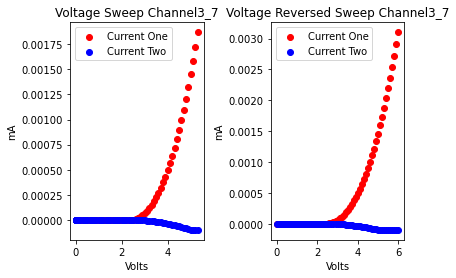

[-0.000821, 0.1053, 0.20213, 0.300018, 0.401046, 0.50288, 0.602375, 0.699991, 0.799997, 0.900013, 0.999992, 1.100863, 1.203391, 1.299998, 1.399985, 1.500015, 1.600004, 1.699986, 1.800017, 1.900005, 1.99999, 2.100007, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


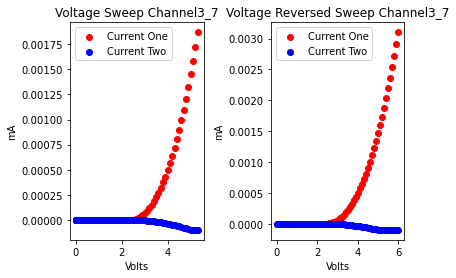

[-0.000698, 0.105142, 0.201995, 0.300007, 0.399977, 0.50001, 0.600014, 0.699984, 0.800004, 0.900015, 0.999987, 1.100496, 1.203709, 1.299989, 1.399986, 1.500016, 1.599999, 1.699986, 1.80002, 1.899998, 1.999987, 2.100018, 2.2, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


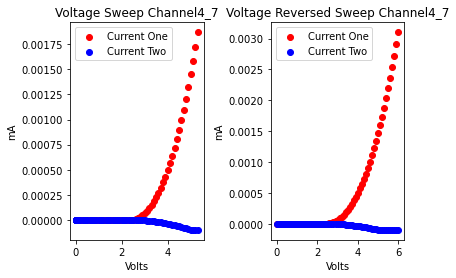

[-1.8e-05, 0.100012, 0.200011, 0.301287, 0.402569, 0.502647, 0.599983, 0.700003, 0.800016, 0.900641, 1.004789, 1.10331, 1.199996, 1.299996, 1.400026, 1.5, 1.599985, 1.700019, 1.799996, 1.899991, 2.000016, 2.099997, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.49999, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


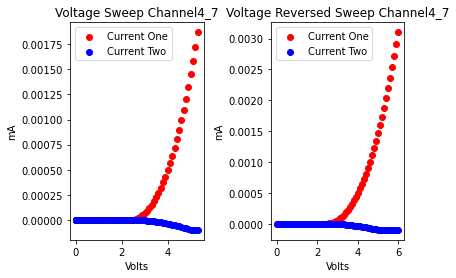

[-0.001126, 0.099995, 0.201058, 0.301897, 0.40001, 0.499981, 0.600004, 0.700014, 0.799984, 0.900007, 1.000013, 1.1009, 1.205327, 1.300014, 1.399997, 1.499989, 1.600022, 1.699992, 1.799989, 1.900021, 1.999997, 2.099987, 2.20002, 2.29999, 2.39998, 2.49999, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


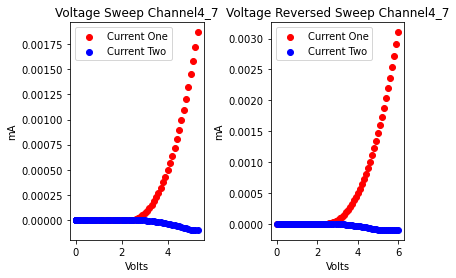

[-0.000204, 0.10473, 0.201762, 0.300004, 0.399988, 0.500012, 0.600013, 0.699986, 0.800006, 0.900018, 0.999985, 1.099986, 1.200016, 1.299992, 1.399999, 1.500015, 1.599999, 1.699989, 1.800025, 1.899993, 1.999989, 2.100018, 2.19999, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


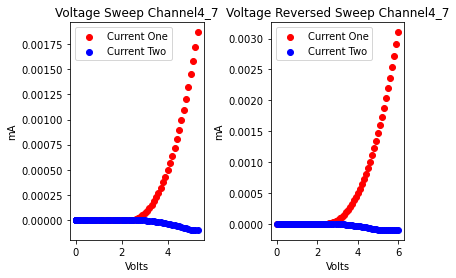

[-0.000667, 0.105087, 0.201941, 0.30001, 0.399983, 0.500007, 0.600007, 0.699981, 0.800004, 0.900017, 0.999983, 1.100006, 1.200013, 1.299985, 1.400004, 1.500016, 1.599986, 1.700001, 1.800019, 1.899987, 2.000003, 2.100018, 2.19998, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


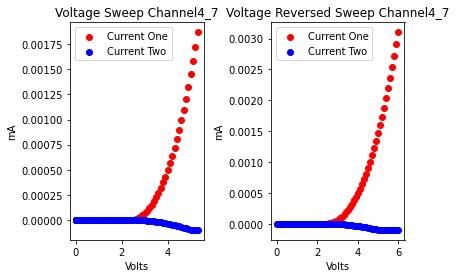

[-2.1e-05, 0.100009, 0.199164, 0.299979, 0.400004, 0.500016, 0.599985, 0.7, 0.800018, 0.899991, 0.999988, 1.100014, 1.199997, 1.299989, 1.400023, 1.499996, 1.599987, 1.70002, 1.799996, 1.899989, 2.000016, 2.099997, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


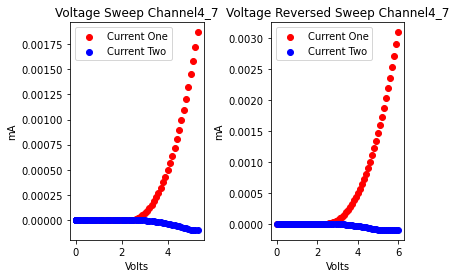

[0.00048, 0.103466, 0.20191, 0.299995, 0.400943, 0.502067, 0.600005, 0.699991, 0.800009, 0.900008, 1.001231, 1.103901, 1.200017, 1.299985, 1.400765, 1.500018, 1.599996, 1.699987, 1.80002, 1.899998, 1.999988, 2.100014, 2.2, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


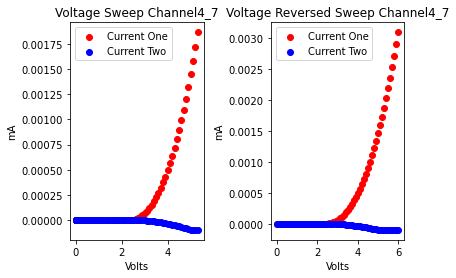

[-0.001029, 0.105068, 0.202309, 0.300011, 0.399983, 0.500005, 0.600015, 0.699988, 0.800002, 0.90002, 0.999994, 1.09999, 1.19878, 1.299996, 1.399984, 1.499316, 1.600007, 1.69998, 1.800007, 1.900014, 1.999986, 2.100003, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


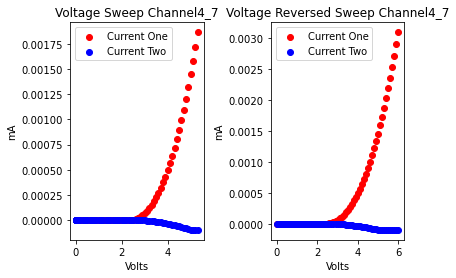

[-0.000919, 0.100004, 0.199985, 0.300014, 0.400012, 0.499981, 0.600004, 0.700016, 0.799984, 0.900003, 1.000012, 1.099985, 1.200005, 1.300017, 1.399981, 1.500002, 1.600019, 1.699992, 1.799995, 1.900012, 1.999995, 2.099989, 2.20001, 2.29999, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


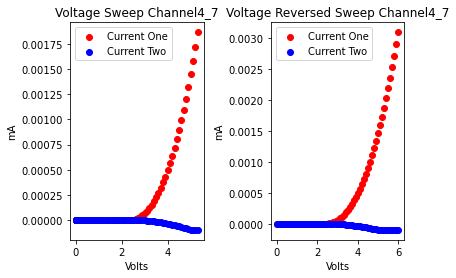

[-0.000362, 0.104823, 0.201833, 0.30001, 0.399985, 0.500006, 0.60001, 0.699979, 0.800002, 0.900017, 0.999984, 1.100004, 1.200013, 1.299984, 1.400004, 1.500015, 1.599987, 1.7, 1.800019, 1.899994, 2.000001, 2.100013, 2.19999, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


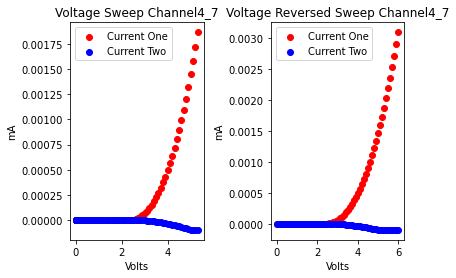

[-9.7e-05, 0.10458, 0.201694, 0.3, 0.399982, 0.499559, 0.600011, 0.700833, 0.80353, 0.902661, 0.999992, 1.099995, 1.200019, 1.299999, 1.399987, 1.500017, 1.59999, 1.699991, 1.800019, 1.899997, 1.999986, 2.100014, 2.19999, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


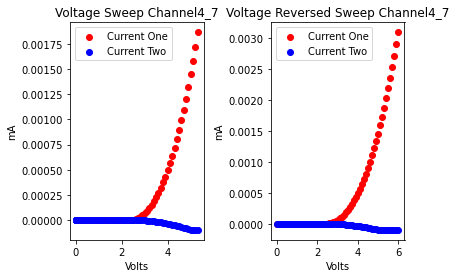

[0.001146, 0.102524, 0.202488, 0.299982, 0.400417, 0.501882, 0.599993, 0.699983, 0.800017, 0.899996, 0.99999, 1.100019, 1.199999, 1.299984, 1.400016, 1.499999, 1.599983, 1.700013, 1.800013, 1.89999, 2.000005, 2.100015, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


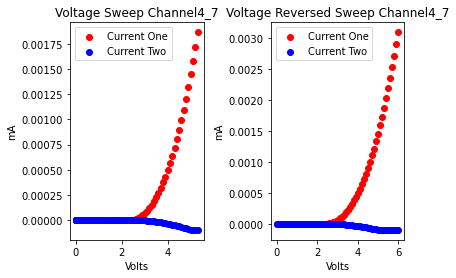

[0.000929, 0.101646, 0.199998, 0.299981, 0.400016, 0.500004, 0.599984, 0.700013, 0.800005, 0.901223, 1.003257, 1.100009, 1.199986, 1.300006, 1.400018, 1.499987, 1.600002, 1.70002, 1.799995, 1.900003, 2.000012, 2.099989, 2.19998, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


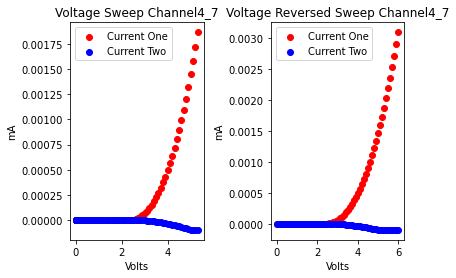

[-0.000257, 0.104912, 0.201638, 0.300001, 0.401242, 0.502637, 0.600011, 0.699985, 0.800005, 0.900015, 1.000693, 1.105038, 1.203797, 1.299993, 1.399986, 1.500017, 1.599996, 1.699988, 1.800017, 1.899996, 1.999987, 2.10002, 2.2, 2.29998, 2.40002, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


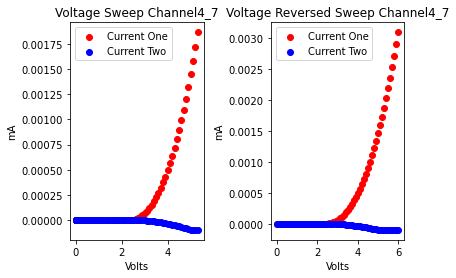

[0.001263, 0.102265, 0.20271, 0.305488, 0.402172, 0.500015, 0.599983, 0.700004, 0.800015, 0.900903, 1.004223, 1.100014, 1.199998, 1.299993, 1.400023, 1.499994, 1.600983, 1.700021, 1.800003, 1.899988, 2.000009, 2.100011, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


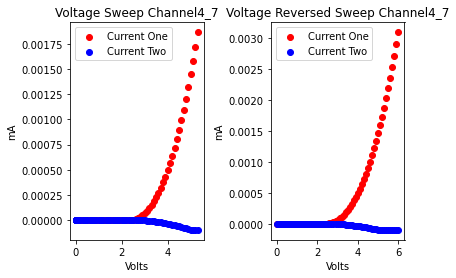

[-1.9e-05, 0.100016, 0.199997, 0.299989, 0.400021, 0.499998, 0.599988, 0.700018, 0.799999, 0.899986, 1.000015, 1.100003, 1.199986, 1.30001, 1.400003, 1.499989, 1.600008, 1.700013, 1.79999, 1.900011, 2.000012, 2.099986, 2.20001, 2.3, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


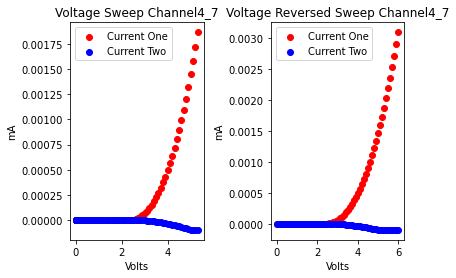

[0.001095, 0.101192, 0.2, 0.299982, 0.400012, 0.499167, 0.599984, 0.700001, 0.800017, 0.899985, 1.000003, 1.100019, 1.199989, 1.3, 1.40002, 1.499994, 1.599999, 1.700015, 1.79999, 1.899992, 2.000013, 2.099993, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


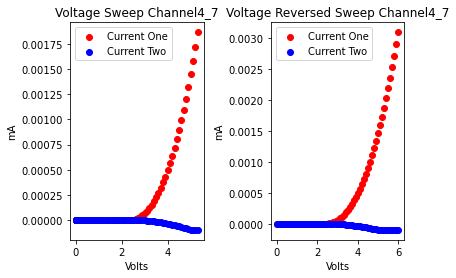

[-0.001012, 0.099979, 0.200009, 0.300019, 0.399981, 0.500005, 0.600012, 0.699987, 0.800002, 0.900015, 0.999987, 1.10036, 1.200025, 1.299993, 1.399989, 1.500017, 1.599998, 1.69999, 1.800018, 1.899998, 1.999985, 2.100015, 2.2, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


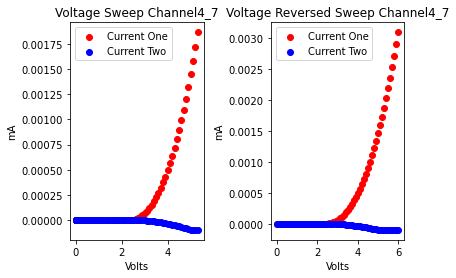

[-0.001137, 0.099994, 0.199985, 0.300019, 0.400003, 0.501231, 0.602352, 0.70001, 0.799982, 0.900005, 1.000013, 1.099985, 1.200006, 1.300017, 1.399987, 1.499997, 1.600017, 1.699982, 1.8, 1.900016, 1.999991, 2.099994, 2.20002, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


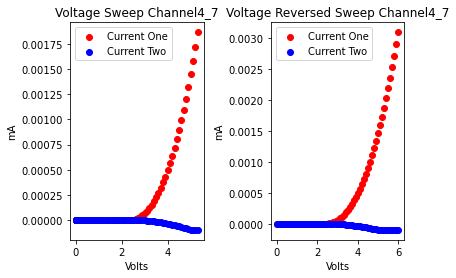

[0.000968, 0.102562, 0.202578, 0.299982, 0.400001, 0.500019, 0.600429, 0.704198, 0.801991, 0.899995, 0.999987, 1.100016, 1.200004, 1.299987, 1.400017, 1.500002, 1.599984, 1.70001, 1.800013, 1.899988, 2.000003, 2.100014, 2.19997, 2.3, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


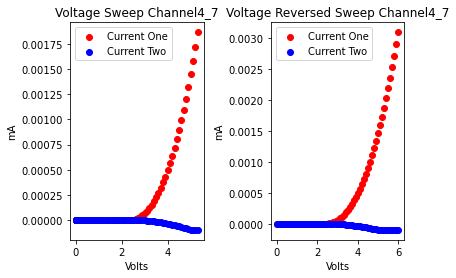

[0.001113, 0.101775, 0.200008, 0.299983, 0.400005, 0.50002, 0.599984, 0.700003, 0.800012, 0.899983, 1.000006, 1.100014, 1.199985, 1.299999, 1.400021, 1.499984, 1.599998, 1.700014, 1.79999, 1.899991, 2.000019, 2.099999, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


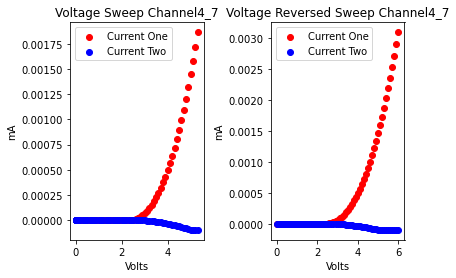

[-0.000547, 0.100007, 0.199983, 0.300001, 0.40002, 0.501007, 0.603023, 0.702459, 0.799985, 0.899999, 1.000016, 1.099993, 1.199989, 1.298755, 1.399992, 1.499986, 1.600015, 1.700002, 1.799984, 1.900009, 2.000004, 2.09999, 2.20001, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


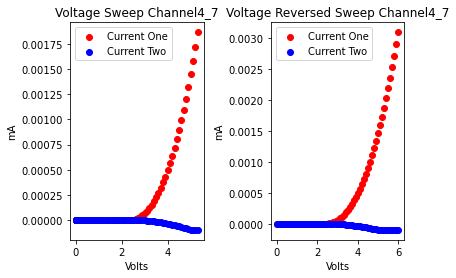

[-1.6e-05, 0.099424, 0.203197, 0.299982, 0.400004, 0.500012, 0.599985, 0.700003, 0.800016, 0.899981, 1.000001, 1.100018, 1.199992, 1.299998, 1.400016, 1.499993, 1.599998, 1.700027, 1.799999, 1.899983, 2.000015, 2.099997, 2.19999, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


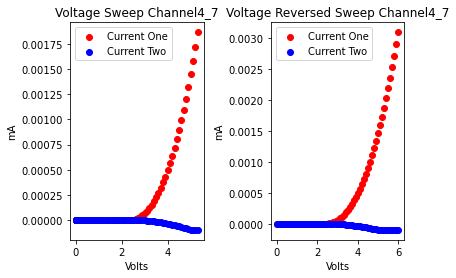

[0.001005, 0.102719, 0.202373, 0.299983, 0.400001, 0.500018, 0.600363, 0.70448, 0.801931, 0.899999, 0.999985, 1.099294, 1.200012, 1.29998, 1.400006, 1.500011, 1.599983, 1.700003, 1.800017, 1.899989, 2.000002, 2.100017, 2.19998, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


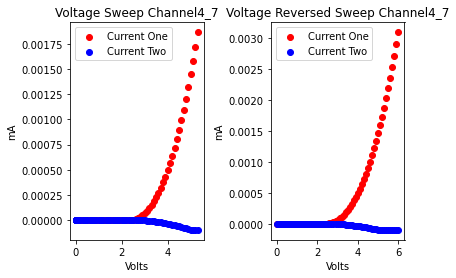

[-0.000445, 0.103299, 0.199983, 0.300008, 0.398981, 0.499987, 0.599994, 0.700016, 0.8, 0.899985, 1.000018, 1.100118, 1.199983, 1.300014, 1.400012, 1.499987, 1.600008, 1.700008, 1.79998, 1.900007, 2.000018, 2.099982, 2.20001, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


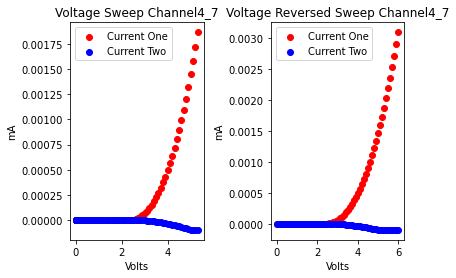

[0.000204, 0.102224, 0.199983, 0.299999, 0.400013, 0.500394, 0.604261, 0.701923, 0.799997, 0.901045, 1.003084, 1.10001, 1.199984, 1.300005, 1.400017, 1.499984, 1.60001, 1.700017, 1.799984, 1.900004, 2.000012, 2.099983, 2.2, 2.30001, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


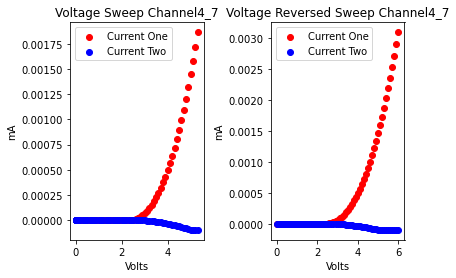

[0.001242, 0.101703, 0.200014, 0.29998, 0.400004, 0.500018, 0.599986, 0.700004, 0.800016, 0.900622, 1.004622, 1.103328, 1.199996, 1.299987, 1.400018, 1.499995, 1.599988, 1.70002, 1.799998, 1.899986, 2.000014, 2.100004, 2.19998, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


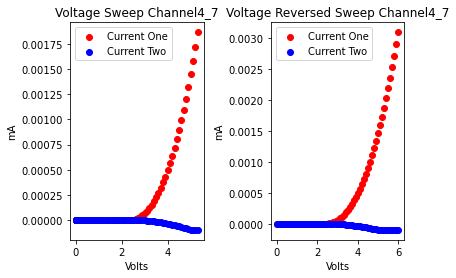

[0.001288, 0.102167, 0.200014, 0.299983, 0.400003, 0.500018, 0.599986, 0.7, 0.800019, 0.899987, 1.0, 1.100016, 1.199991, 1.299992, 1.400015, 1.499996, 1.599995, 1.700025, 1.799998, 1.899994, 2.000022, 2.099992, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


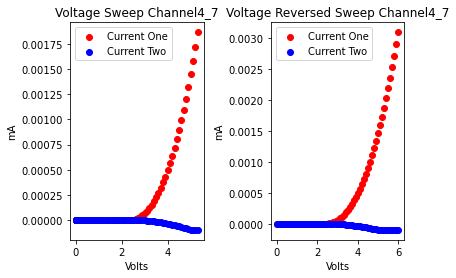

[-0.00101, 0.105054, 0.202257, 0.303029, 0.399981, 0.500004, 0.600013, 0.699988, 0.799999, 0.900018, 1.000669, 1.105176, 1.203832, 1.299994, 1.399985, 1.498956, 1.600002, 1.699985, 1.800019, 1.900006, 1.999989, 2.100014, 2.20001, 2.29999, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


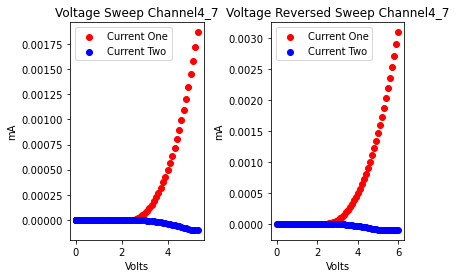

[-0.001012, 0.100001, 0.201261, 0.30232, 0.40308, 0.499982, 0.600004, 0.700012, 0.800918, 0.903868, 1.003093, 1.099991, 1.199996, 1.300023, 1.399993, 1.499987, 1.600017, 1.699995, 1.799992, 1.900018, 1.999994, 2.099986, 2.20001, 2.29999, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


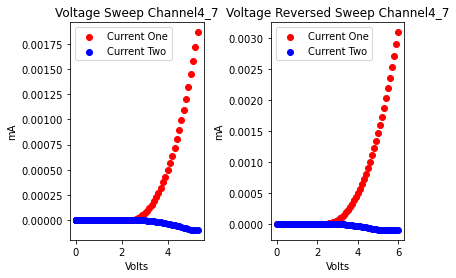

[-0.001229, 0.099997, 0.199987, 0.300021, 0.400031, 0.505271, 0.601836, 0.700003, 0.799986, 0.900011, 1.000013, 1.099982, 1.200006, 1.300012, 1.399977, 1.500006, 1.60002, 1.699982, 1.800008, 1.900012, 1.999985, 2.100007, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


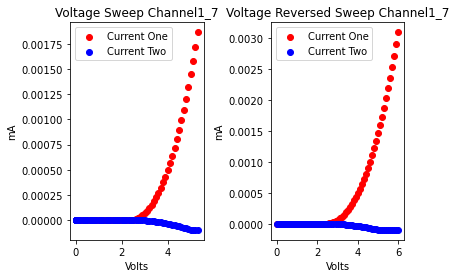

[-1.4e-05, 0.100019, 0.200003, 0.301271, 0.402331, 0.50001, 0.599985, 0.700003, 0.800017, 0.89998, 1.0, 1.100015, 1.199992, 1.299996, 1.400014, 1.499992, 1.59999, 1.700021, 1.799999, 1.899988, 2.00002, 2.099994, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


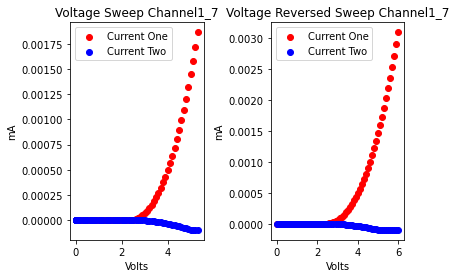

[0.001282, 0.102377, 0.202902, 0.299979, 0.400004, 0.500015, 0.599985, 0.700002, 0.800017, 0.899983, 1.000002, 1.098854, 1.199994, 1.299989, 1.400021, 1.499997, 1.599985, 1.700017, 1.800003, 1.899988, 2.000018, 2.100003, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


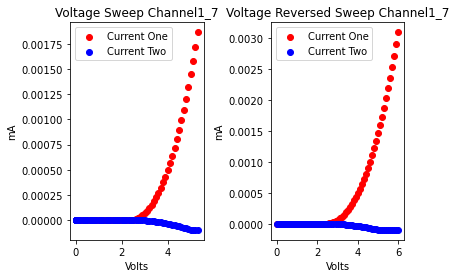

[-0.001223, 0.099994, 0.199992, 0.300019, 0.399812, 0.499979, 0.600007, 0.700016, 0.799979, 0.900008, 1.000015, 1.099985, 1.200005, 1.300018, 1.399987, 1.500005, 1.600017, 1.699983, 1.8, 1.900017, 1.999995, 2.099997, 2.20001, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


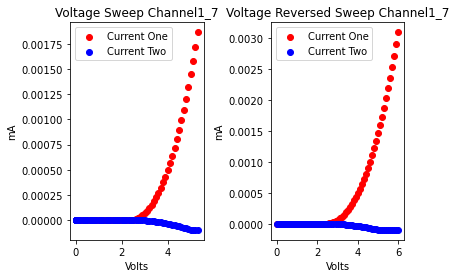

[-0.001258, 0.099992, 0.199991, 0.300022, 0.399792, 0.499981, 0.600005, 0.700012, 0.799981, 0.900002, 0.999034, 1.099988, 1.200588, 1.300021, 1.399995, 1.49999, 1.600018, 1.700002, 1.799987, 1.900019, 2.000004, 2.099981, 2.20001, 2.3, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


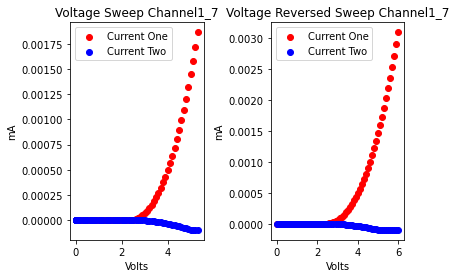

[-0.001171, 0.099994, 0.199986, 0.300018, 0.400001, 0.499984, 0.600019, 0.700002, 0.799989, 0.900012, 1.000012, 1.101291, 1.204017, 1.300012, 1.399983, 1.500004, 1.600018, 1.699987, 1.800001, 1.900017, 1.999986, 2.099999, 2.20002, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


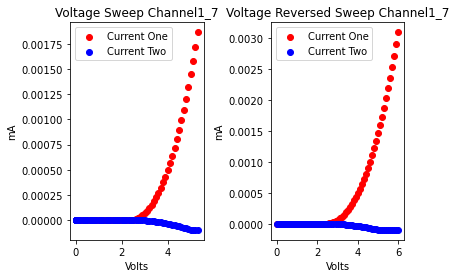

[-0.001127, 0.099991, 0.19999, 0.300023, 0.400001, 0.499986, 0.600016, 0.699999, 0.799986, 0.900022, 1.000004, 1.101219, 1.204203, 1.300012, 1.399981, 1.500006, 1.600014, 1.699983, 1.800007, 1.900015, 1.999981, 2.100001, 2.20001, 2.29999, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


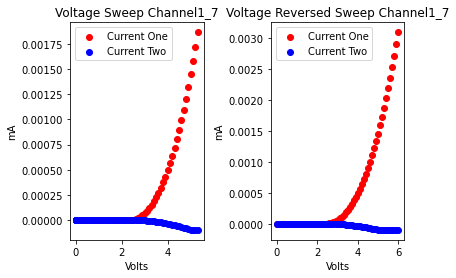

[0.000108, 0.102248, 0.199982, 0.300002, 0.400017, 0.500402, 0.604787, 0.70178, 0.799995, 0.899986, 1.000016, 1.1, 1.199983, 1.300011, 1.400004, 1.499993, 1.600012, 1.700014, 1.79999, 1.900008, 2.000011, 2.099978, 2.2, 2.3, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


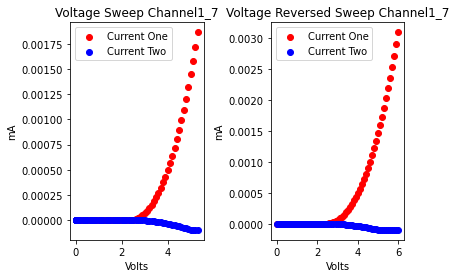

[-0.001027, 0.099982, 0.200002, 0.300018, 0.399984, 0.500003, 0.600014, 0.699987, 0.799999, 0.90002, 0.999984, 1.100618, 1.200018, 1.300004, 1.399988, 1.500007, 1.600007, 1.699983, 1.800006, 1.900007, 1.999985, 2.100005, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


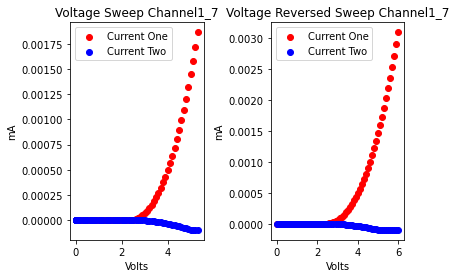

[-1.2e-05, 0.100016, 0.199996, 0.299986, 0.400018, 0.49971, 0.605424, 0.702072, 0.800006, 0.901235, 1.003504, 1.100016, 1.199984, 1.3, 1.400022, 1.499993, 1.599988, 1.700014, 1.799996, 1.899995, 2.000022, 2.099998, 2.19998, 2.30002, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.89999, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


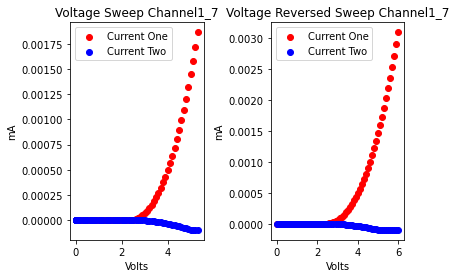

[-0.000524, 0.100008, 0.199979, 0.300014, 0.400012, 0.499982, 0.600005, 0.700013, 0.799986, 0.900568, 1.002815, 1.099995, 1.200945, 1.30376, 1.399998, 1.499986, 1.600009, 1.700005, 1.799993, 1.900009, 2.000007, 2.099981, 2.20001, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.09999, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


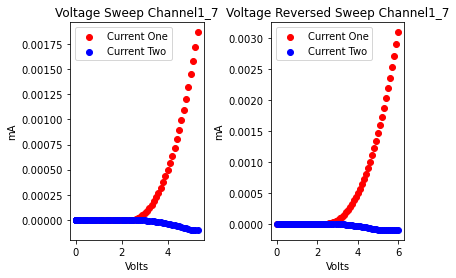

[0.001276, 0.102377, 0.202815, 0.299979, 0.400002, 0.500018, 0.599988, 0.700002, 0.798865, 0.899995, 0.999988, 1.100017, 1.199998, 1.30114, 1.404641, 1.500006, 1.599979, 1.700001, 1.800018, 1.899983, 2.000004, 2.100013, 2.19998, 2.3, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


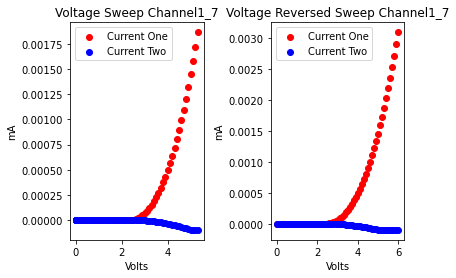

[-0.000469, 0.104968, 0.201663, 0.300001, 0.401268, 0.502736, 0.600011, 0.699986, 0.800004, 0.900017, 0.999986, 1.1, 1.200017, 1.299987, 1.4, 1.500012, 1.599992, 1.699986, 1.800018, 1.899996, 1.999984, 2.100027, 2.19999, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


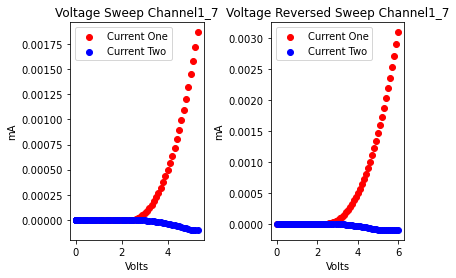

[-0.001074, 0.099985, 0.200001, 0.300019, 0.399992, 0.49999, 0.600015, 0.699994, 0.799995, 0.900026, 1.000192, 1.099982, 1.20001, 1.300009, 1.399985, 1.500006, 1.600016, 1.699982, 1.800005, 1.900011, 1.999987, 2.100005, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


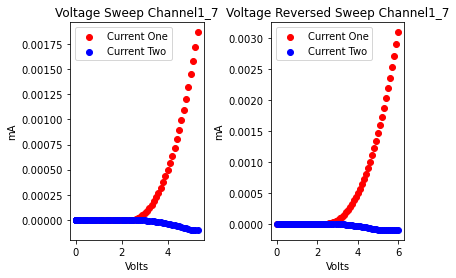

[0.000257, 0.104215, 0.201649, 0.299998, 0.399982, 0.500016, 0.600001, 0.701154, 0.802577, 0.900018, 0.999985, 1.100004, 1.200013, 1.299984, 1.400007, 1.500017, 1.599988, 1.7, 1.800018, 1.899989, 2.0, 2.100014, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


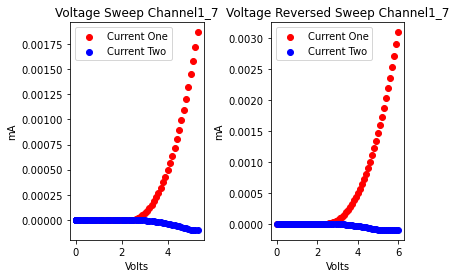

In [28]:
for i in range(len(measurementDF)-1):
    if List_of_channelNumber[i] == 7:
        print(List_of_voltageSweepList[i])
        plt.subplot(1, 2, 1)
        C1 = plt.scatter(List_of_voltageSweepList[i] , List_of_currentOneList[i],color='red')
        C2 = plt.scatter(List_of_voltageSweepList[i],List_of_currentTwoList[i],color='blue')
        plt.legend(['Current One', 'Current Two'])
        plt.title('Voltage Sweep Channel' + str(List_of_measurementNumber[i]))
        plt.xlabel('Volts')
        plt.ylabel('mA')

        plt.subplot(1, 2, 2)
        reverseC1 = plt.scatter(List_of_voltageSweepReversedList[i],List_of_currentOneReverseList[i],color='red')
        reverseC2 = plt.scatter(List_of_voltageSweepReversedList[i],List_of_currentTwoReverseList[i],color='blue')
        plt.legend(['Current One', 'Current Two'])
        plt.title('Voltage Reversed Sweep Channel' + str(List_of_measurementNumber[i]))
        plt.xlabel('Volts')
        plt.ylabel('mA')

        plt.subplots_adjust(wspace=0.5)

        plt.show()

voltage
[-0.00014719413712390548, 0.10288277000456394, 0.20120814104912405, 0.3000031416269339, 0.40014826823335403, 0.5003452312299006, 0.6001087015117523, 0.7006135213154039, 0.8012164061930791, 0.9000545768765764, 1.0001802724695787, 1.10000702259214, 1.200052803708493, 1.3001814979847075, 1.4002899589107811, 1.5000113585510726, 1.5999959390857064, 1.699994063077656, 1.8000133604021675, 1.8999960343311537, 1.9999954411508334, 2.100011756654198, 2.199990121267695, 2.2999929387234523, 2.4000104526367707, 2.4999999485778783, 2.5999999999999996, 2.7, 2.7999996874999997, 2.89999984375, 3.0, 3.1, 3.1999999999809265, 3.3, 3.4000000000000004, 3.5, 3.6, 3.7, 3.799999999694521, 3.8999999999999995, 4.0, 4.0999996874999995, 4.199999911421786, 4.3, 4.399999999990463, 4.5, 4.6, 4.699998749997615, 4.799999686278104, 4.9, 4.999999365196144, 5.0999999975535255, 5.2, 5.2999998435973374, 1.1378911109588844e-80, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

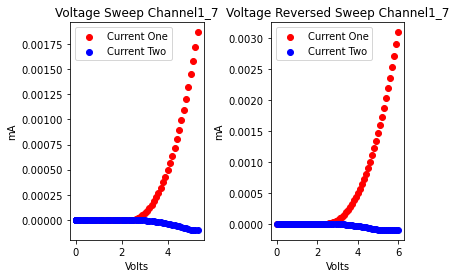

voltage
[-0.000581, 0.100004, 0.199992, 0.300012, 0.400009, 0.499983, 0.600008, 0.699115, 0.799985, 0.900596, 1.003074, 1.099994, 1.199983, 1.30002, 1.399997, 1.499993, 1.600016, 1.699997, 1.799986, 1.900015, 2.000003, 2.099982, 2.20002, 2.3, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.7e-05, -4.2e-05, -4.7e-05, -5.2e-05, -5.8e-05, -6.4e-05, -7e-05, -7.7e-05, -8.3e-05, -9.1e-05, -9.8e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


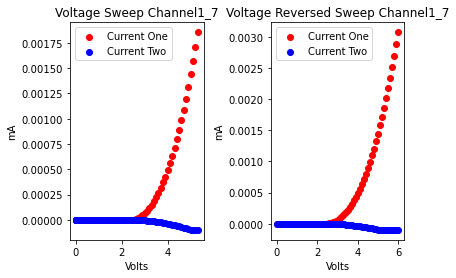

voltage
[-0.001146, 0.099992, 0.19999, 0.300022, 0.4, 0.499988, 0.600018, 0.699999, 0.79999, 0.900019, 0.99984, 1.099987, 1.200005, 1.300013, 1.399992, 1.500009, 1.600008, 1.69998, 1.800003, 1.900015, 1.999982, 2.100013, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.7e-05, -4.2e-05, -4.7e-05, -5.2e-05, -5.8e-05, -6.4e-05, -7e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.8e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


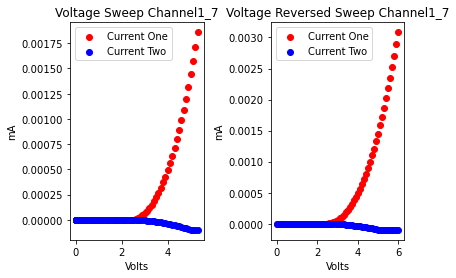

voltage
[-1.6e-05, 0.100018, 0.199712, 0.305646, 0.402024, 0.500011, 0.599979, 0.70001, 0.800014, 0.899982, 1.000004, 1.100011, 1.199986, 1.300006, 1.400016, 1.49999, 1.600001, 1.700018, 1.799988, 1.899999, 2.000015, 2.099983, 2.2, 2.30002, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.7e-05, -4.2e-05, -4.7e-05, -5.2e-05, -5.8e-05, -6.4e-05, -7e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.8e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


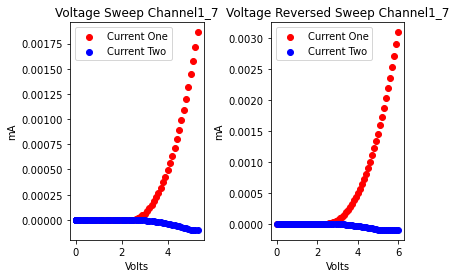

voltage
[8.4e-05, 0.104374, 0.201756, 0.299995, 0.399989, 0.500018, 0.6, 0.699987, 0.800018, 0.899999, 0.999985, 1.100016, 1.200004, 1.299984, 1.400011, 1.500012, 1.599991, 1.700012, 1.800008, 1.899982, 2.000007, 2.100022, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.7e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.8e-05, -6.4e-05, -7e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.8e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


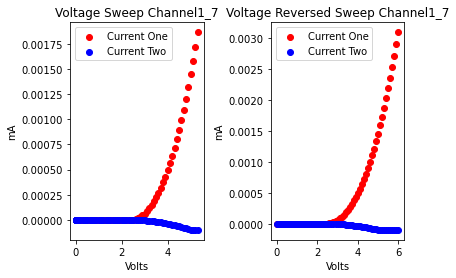

voltage
[0.001268, 0.102686, 0.202931, 0.299981, 0.400004, 0.500015, 0.599987, 0.7, 0.800017, 0.900507, 1.005136, 1.103159, 1.199989, 1.29999, 1.40002, 1.499998, 1.599992, 1.700018, 1.799998, 1.899987, 2.000012, 2.100002, 2.19998, 2.30002, 2.4, 2.5, 2.59999, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.7e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.8e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


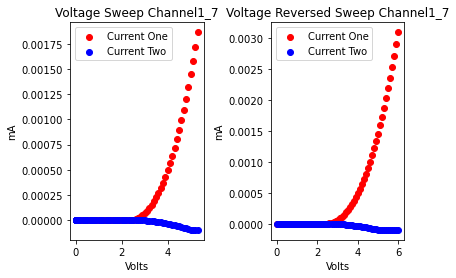

voltage
[0.000394, 0.104018, 0.201761, 0.299995, 0.401062, 0.50189, 0.600011, 0.699989, 0.800013, 0.899115, 0.999987, 1.1, 1.200016, 1.299985, 1.399999, 1.500016, 1.599985, 1.699997, 1.800016, 1.899994, 1.999997, 2.100013, 2.19999, 2.29999, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.8e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


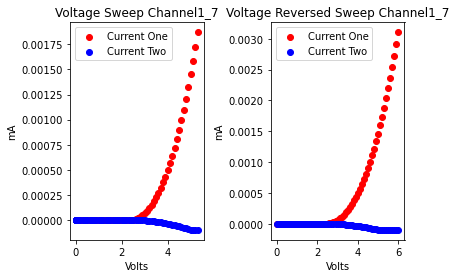

voltage
[0.000443, 0.103792, 0.201856, 0.299991, 0.399984, 0.50002, 0.599997, 0.701125, 0.802339, 0.900007, 0.999986, 1.100006, 1.200017, 1.299978, 1.400001, 1.500013, 1.599981, 1.700003, 1.80002, 1.899987, 2.000006, 2.10001, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.09999, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.8e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


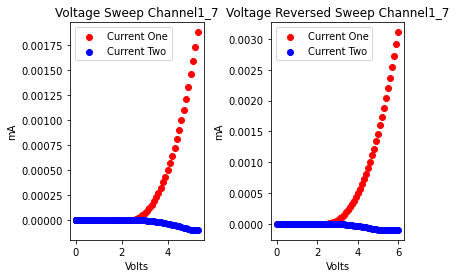

voltage
[-0.000317, 0.100015, 0.199983, 0.300008, 0.40001, 0.499983, 0.600005, 0.700012, 0.800605, 0.904631, 1.002872, 1.099996, 1.199985, 1.30002, 1.399997, 1.499989, 1.600017, 1.699997, 1.799986, 1.900015, 2.000003, 2.099982, 2.20001, 2.3, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


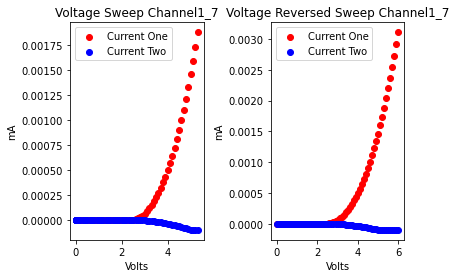

voltage
[-0.000815, 0.100011, 0.199983, 0.300002, 0.400019, 0.499983, 0.600005, 0.70001, 0.800943, 0.903659, 1.003196, 1.09999, 1.199992, 1.300015, 1.399995, 1.499991, 1.600016, 1.699997, 1.79999, 1.900018, 1.999994, 2.099986, 2.20001, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


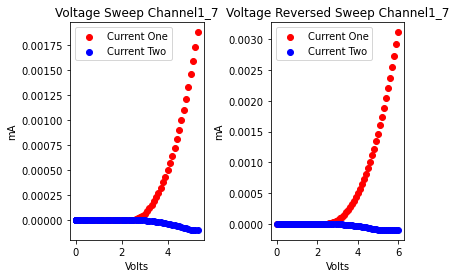

voltage
[0.000223, 0.104439, 0.20204, 0.299998, 0.399985, 0.50002, 0.600002, 0.699986, 0.800012, 0.90001, 1.001262, 1.104207, 1.200012, 1.299987, 1.399999, 1.500017, 1.599987, 1.699997, 1.800017, 1.899992, 1.999993, 2.100014, 2.19999, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.09999, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


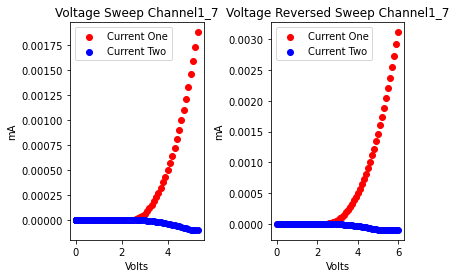

voltage
[-0.000802, 0.09998, 0.200009, 0.300014, 0.399982, 0.500007, 0.600012, 0.699986, 0.800001, 0.900015, 1.000856, 1.104837, 1.200016, 1.299998, 1.399988, 1.500021, 1.599993, 1.699984, 1.80002, 1.899999, 1.999991, 2.100019, 2.19999, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


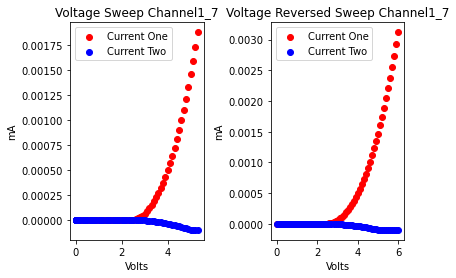

voltage
[-0.001026, 0.099984, 0.200001, 0.30002, 0.39999, 0.499997, 0.600014, 0.699995, 0.799995, 0.900026, 1.000244, 1.099982, 1.200009, 1.300012, 1.399986, 1.500012, 1.60001, 1.699979, 1.800004, 1.900016, 1.999985, 2.100006, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


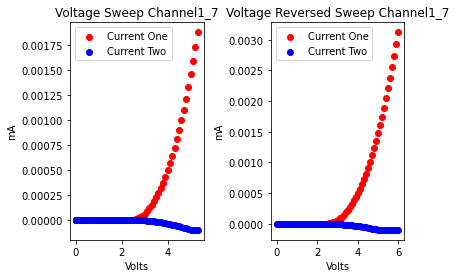

voltage
[0.001236, 0.102186, 0.200011, 0.29998, 0.400002, 0.500016, 0.599987, 0.7, 0.800017, 0.900581, 1.004871, 1.103257, 1.199995, 1.299983, 1.400021, 1.499997, 1.599992, 1.700017, 1.799997, 1.899986, 2.000018, 2.100002, 2.19998, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


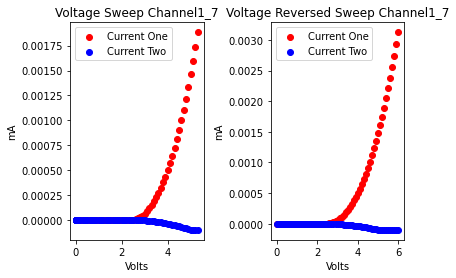

voltage
[-0.001148, 0.099992, 0.199985, 0.298987, 0.400006, 0.49999, 0.600008, 0.70001, 0.79998, 0.900006, 1.000013, 1.101016, 1.204876, 1.300016, 1.399989, 1.499992, 1.600017, 1.699996, 1.799991, 1.900022, 1.999997, 2.099984, 2.20002, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


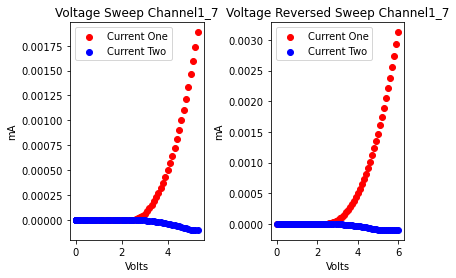

voltage
[-0.000482, 0.100013, 0.199983, 0.300012, 0.400016, 0.499982, 0.600003, 0.700011, 0.800758, 0.904131, 1.002918, 1.099996, 1.199986, 1.300021, 1.399997, 1.499989, 1.600017, 1.699997, 1.799988, 1.900017, 1.999996, 2.099983, 2.20001, 2.3, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


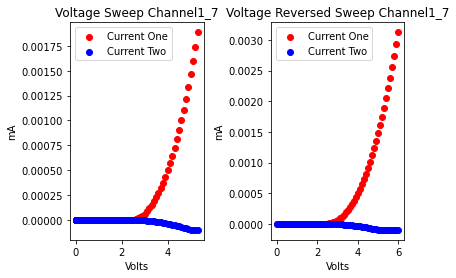

voltage
[-0.001146, 0.099996, 0.199987, 0.300019, 0.40001, 0.501226, 0.602644, 0.702952, 0.799986, 0.900002, 1.000015, 1.099991, 1.200899, 1.303912, 1.399998, 1.499989, 1.600009, 1.700009, 1.799981, 1.900008, 2.00001, 2.099985, 2.2, 2.30002, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


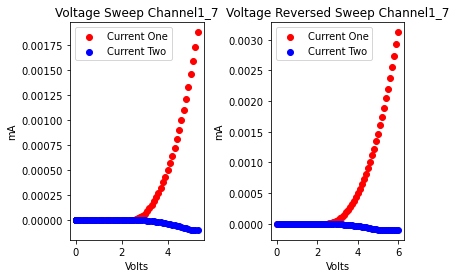

voltage
[0.001246, 0.102377, 0.200012, 0.300726, 0.403585, 0.501966, 0.599995, 0.699984, 0.800018, 0.899994, 0.999989, 1.100018, 1.200085, 1.299982, 1.400011, 1.500005, 1.599983, 1.700013, 1.80001, 1.899986, 2.000006, 2.100015, 2.19997, 2.3, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.49999, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


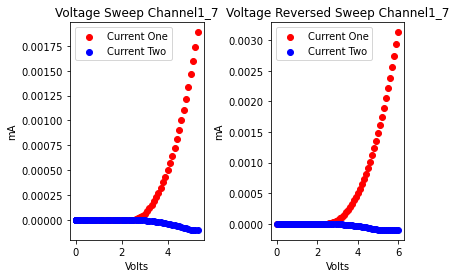

voltage
[0.000717, 0.103761, 0.201892, 0.299996, 0.39999, 0.500017, 0.600002, 0.701175, 0.802536, 0.900016, 0.999983, 1.100037, 1.200017, 1.299995, 1.399987, 1.500017, 1.599994, 1.699984, 1.800021, 1.900006, 1.999985, 2.100003, 2.20002, 2.29998, 2.4, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


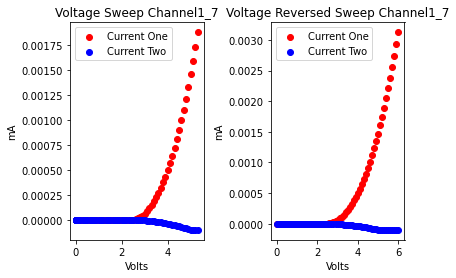

voltage
[-0.001102, 0.100005, 0.199986, 0.300005, 0.400016, 0.499981, 0.600003, 0.700015, 0.799985, 0.9, 1.000015, 1.099984, 1.199999, 1.300016, 1.399992, 1.499994, 1.600018, 1.699995, 1.799987, 1.900013, 2.000004, 2.09998, 2.20001, 2.3, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


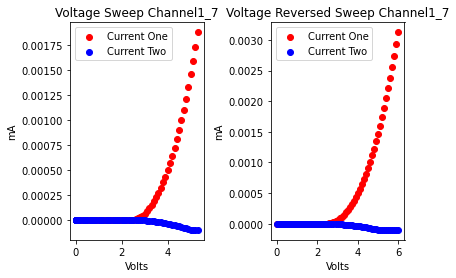

voltage
[0.000405, 0.102775, 0.201942, 0.299993, 0.399994, 0.500022, 0.599998, 0.699983, 0.80002, 0.899995, 0.99999, 1.099076, 1.200012, 1.299988, 1.400007, 1.500013, 1.599984, 1.700012, 1.80001, 1.899984, 2.000005, 2.100015, 2.19998, 2.3, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


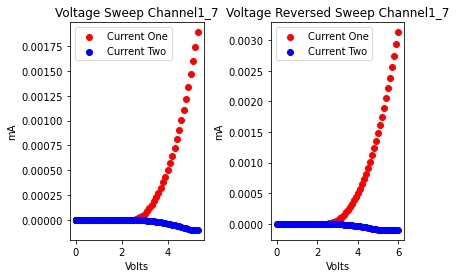

voltage
[-0.001134, 0.099992, 0.201148, 0.302135, 0.400015, 0.499983, 0.600004, 0.700014, 0.799986, 0.900002, 1.000014, 1.099995, 1.199988, 1.30002, 1.399994, 1.499989, 1.600014, 1.700002, 1.799983, 1.900012, 2.000011, 2.09998, 2.2, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


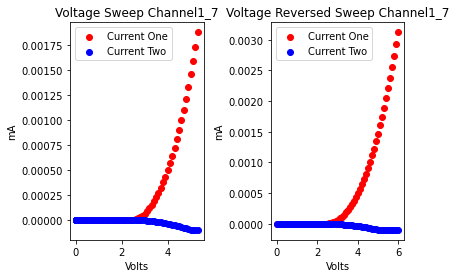

voltage
[-0.001018, 0.099984, 0.199999, 0.30002, 0.399983, 0.499999, 0.600011, 0.699995, 0.799996, 0.900019, 1.000254, 1.099985, 1.200017, 1.300002, 1.399983, 1.500008, 1.60001, 1.699991, 1.800009, 1.90001, 1.999981, 2.100001, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.39999, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.2e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


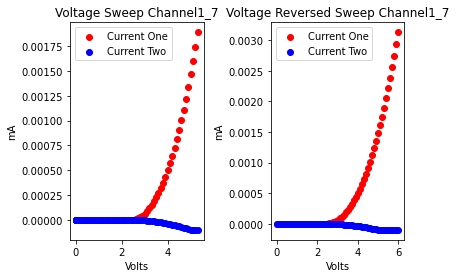

voltage
[-0.001232, 0.1, 0.199987, 0.300017, 0.400002, 0.499984, 0.600012, 0.700008, 0.799983, 0.900007, 1.000006, 1.09998, 1.200006, 1.300018, 1.399982, 1.500005, 1.600012, 1.699985, 1.800004, 1.900013, 1.999989, 2.099998, 2.20001, 2.29998, 2.4, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.2e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


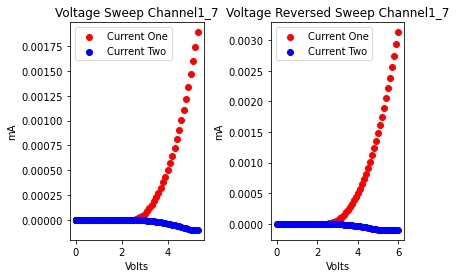

voltage
[0.001242, 0.102462, 0.200011, 0.299983, 0.400004, 0.500018, 0.599986, 0.7, 0.80002, 0.899988, 0.999998, 1.100012, 1.19999, 1.299995, 1.40002, 1.499998, 1.599986, 1.700026, 1.799998, 1.899988, 2.000016, 2.099996, 2.19999, 2.30002, 2.4, 2.5, 2.59999, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.2e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


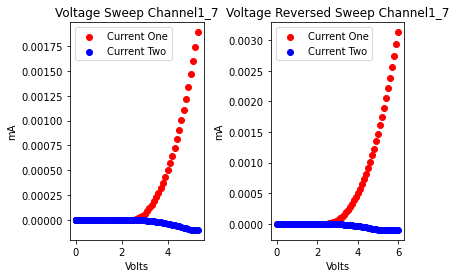

voltage
[-1.7e-05, 0.100008, 0.200008, 0.299988, 0.400007, 0.499101, 0.599986, 0.7, 0.80002, 0.899989, 1.0, 1.100016, 1.19999, 1.300733, 1.404293, 1.499993, 1.599989, 1.700019, 1.8, 1.899987, 2.000017, 2.100001, 2.19998, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.2e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


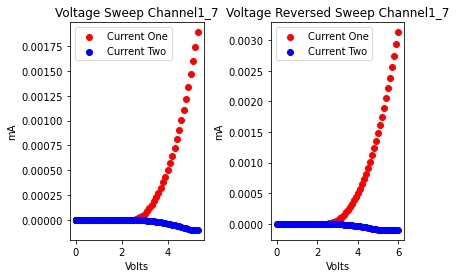

voltage
[0.001194, 0.101703, 0.200011, 0.299981, 0.400008, 0.500008, 0.59998, 0.700005, 0.799073, 0.899989, 0.999998, 1.100012, 1.199996, 1.299991, 1.400025, 1.499997, 1.599983, 1.700018, 1.799997, 1.89999, 2.000018, 2.099999, 2.19999, 2.30002, 2.4, 2.5, 2.59999, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.2e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


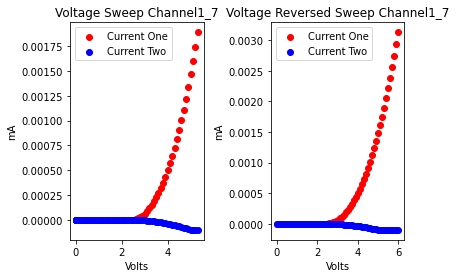

voltage
[-1.4e-05, 0.104619, 0.201732, 0.300005, 0.399985, 0.500014, 0.600011, 0.699986, 0.800007, 0.900016, 1.001107, 1.10416, 1.200017, 1.299994, 1.399993, 1.500014, 1.599996, 1.699988, 1.800021, 1.899995, 1.999989, 2.100016, 2.2, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


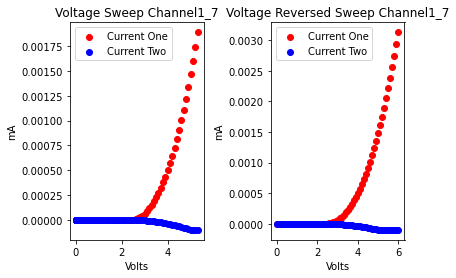

voltage
[-0.001046, 0.09999, 0.199998, 0.300015, 0.399997, 0.499985, 0.600022, 0.699998, 0.799984, 0.900024, 0.999997, 1.09999, 1.200019, 1.3, 1.399988, 1.500016, 1.599997, 1.699984, 1.800017, 1.900004, 1.999988, 2.100017, 2.2, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.40001, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


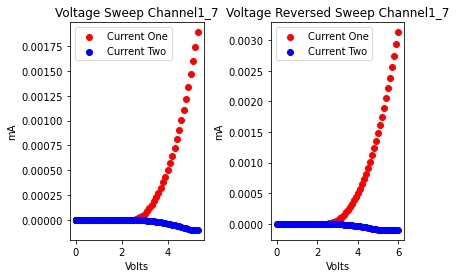

voltage
[0.001083, 0.101828, 0.20001, 0.299985, 0.400011, 0.500008, 0.601219, 0.702652, 0.802975, 0.899984, 1.0, 1.098914, 1.199992, 1.299991, 1.400026, 1.499994, 1.599984, 1.700019, 1.799996, 1.899989, 2.000018, 2.099994, 2.19998, 2.30001, 2.4, 2.5, 2.59999, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.2e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


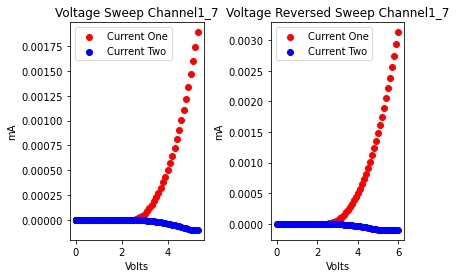

voltage
[0.000276, 0.102849, 0.199987, 0.299999, 0.400018, 0.500542, 0.60435, 0.701947, 0.799993, 0.901047, 1.002981, 1.100006, 1.199992, 1.299695, 1.400016, 1.499988, 1.599999, 1.70002, 1.799987, 1.900001, 2.000013, 2.099991, 2.19999, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.89999, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.2e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


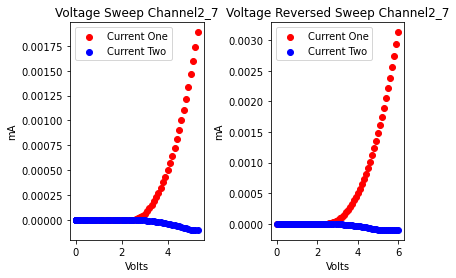

voltage
[-0.000356, 0.104548, 0.201644, 0.300002, 0.399984, 0.500015, 0.600004, 0.701254, 0.802723, 0.900014, 0.999987, 1.099998, 1.200017, 1.299984, 1.4, 1.500017, 1.599995, 1.699999, 1.800016, 1.89999, 1.999991, 2.100017, 2.19999, 2.29999, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


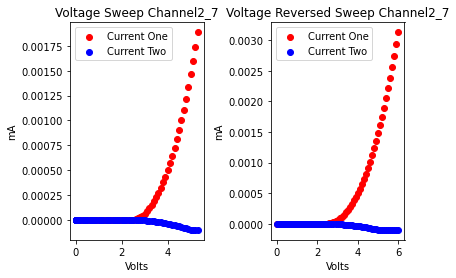

voltage
[-0.001112, 0.100003, 0.199987, 0.300013, 0.400006, 0.499991, 0.60001, 0.700006, 0.799981, 0.900008, 0.999029, 1.099988, 1.199996, 1.300017, 1.399992, 1.49999, 1.600017, 1.699994, 1.799993, 1.900021, 1.999994, 2.099988, 2.20002, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


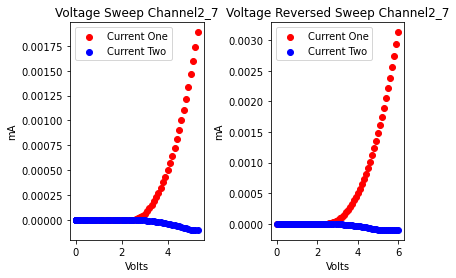

voltage
[-0.000709, 0.100014, 0.199979, 0.300009, 0.400018, 0.499981, 0.600008, 0.700011, 0.799982, 0.900007, 1.000013, 1.099988, 1.200508, 1.300021, 1.399996, 1.49999, 1.600018, 1.699997, 1.799989, 1.900016, 1.999996, 2.09999, 2.20002, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


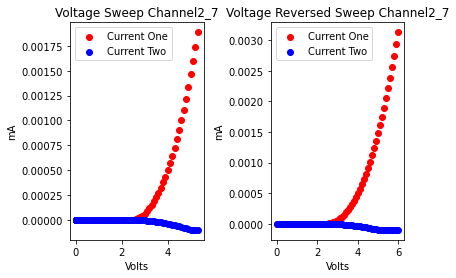

voltage
[0.000738, 0.101984, 0.199989, 0.299992, 0.400011, 0.500374, 0.6044, 0.701976, 0.799997, 0.899987, 1.000017, 1.100002, 1.199987, 1.300019, 1.400004, 1.499985, 1.600013, 1.700011, 1.799984, 1.900008, 2.000011, 2.099978, 2.2, 2.30001, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


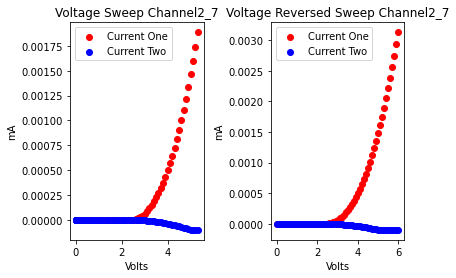

voltage
[0.000365, 0.102575, 0.199984, 0.3, 0.400018, 0.500428, 0.604112, 0.702288, 0.799997, 0.89999, 1.000018, 1.099999, 1.199985, 1.300017, 1.400004, 1.499986, 1.600015, 1.700006, 1.799987, 1.900011, 2.000008, 2.099979, 2.2, 2.30001, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


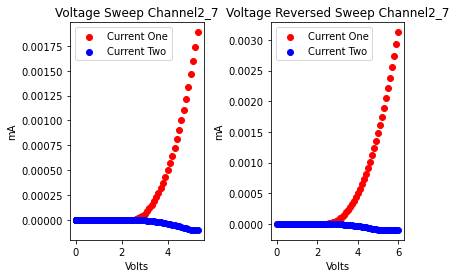

voltage
[-0.001053, 0.099986, 0.200001, 0.300019, 0.399992, 0.499988, 0.600019, 0.699996, 0.799984, 0.900019, 1.000007, 1.09999, 1.200008, 1.299118, 1.399974, 1.499998, 1.600018, 1.699989, 1.799999, 1.900013, 1.999992, 2.099992, 2.20001, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


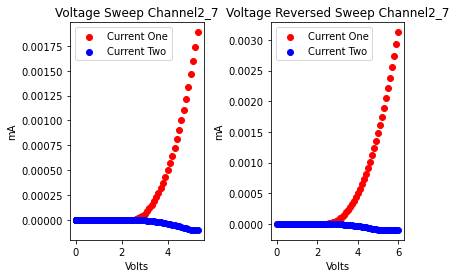

voltage
[-0.000248, 0.104539, 0.201748, 0.30001, 0.399981, 0.500006, 0.600016, 0.701114, 0.803006, 0.900017, 1.000589, 1.105262, 1.203705, 1.299993, 1.399984, 1.500017, 1.599994, 1.699989, 1.80002, 1.899997, 1.999987, 2.100019, 2.2, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


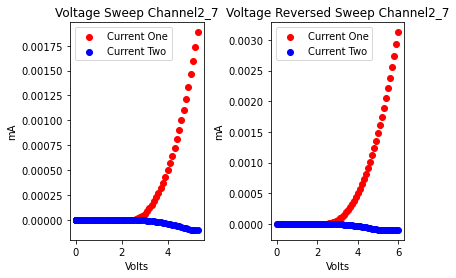

voltage
[-0.000682, 0.105301, 0.202338, 0.300016, 0.399982, 0.500003, 0.60001, 0.699985, 0.800003, 0.900017, 1.000811, 1.104919, 1.200015, 1.299997, 1.399986, 1.50002, 1.599996, 1.699983, 1.800018, 1.899998, 1.999992, 2.100017, 2.19999, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


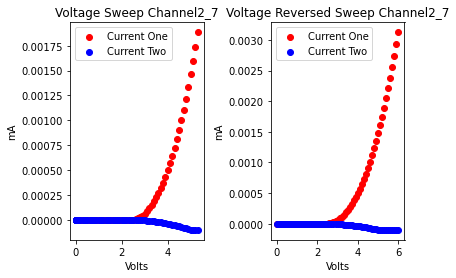

voltage
[0.000571, 0.10243, 0.199993, 0.299992, 0.400023, 0.500177, 0.604796, 0.701787, 0.799998, 0.901183, 1.003037, 1.100011, 1.199982, 1.300005, 1.400017, 1.499988, 1.600006, 1.700018, 1.799986, 1.900006, 2.000014, 2.099988, 2.2, 2.30001, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


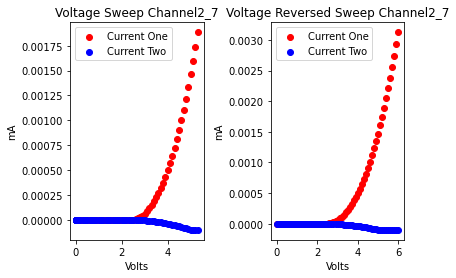

voltage
[0.001251, 0.102631, 0.202476, 0.299984, 0.399999, 0.500017, 0.599988, 0.699997, 0.800018, 0.899995, 0.999996, 1.100014, 1.199991, 1.300864, 1.400014, 1.500003, 1.599984, 1.700009, 1.800006, 1.899987, 2.00001, 2.10001, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


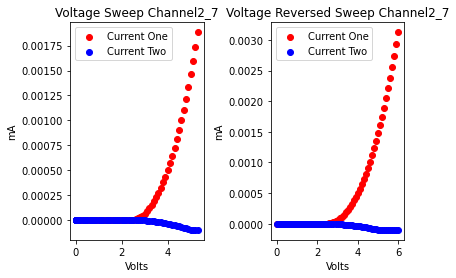

voltage
[0.00115, 0.101903, 0.200004, 0.299983, 0.400018, 0.500004, 0.599983, 0.700006, 0.800009, 0.899988, 1.000011, 1.0991, 1.199985, 1.300001, 1.400018, 1.499986, 1.599999, 1.70002, 1.799988, 1.899992, 2.000014, 2.099997, 2.19999, 2.30002, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.89999, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


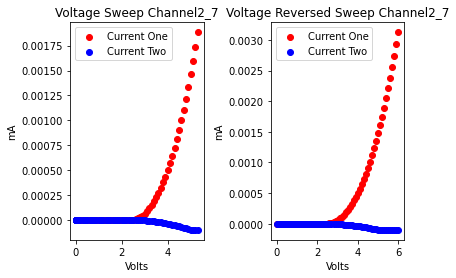

voltage
[-0.001128, 0.099992, 0.201009, 0.301808, 0.400011, 0.49999, 0.600011, 0.700006, 0.79998, 0.900004, 1.000016, 1.10107, 1.204629, 1.300021, 1.399981, 1.5, 1.600016, 1.699991, 1.799993, 1.900015, 1.999997, 2.099983, 2.20002, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


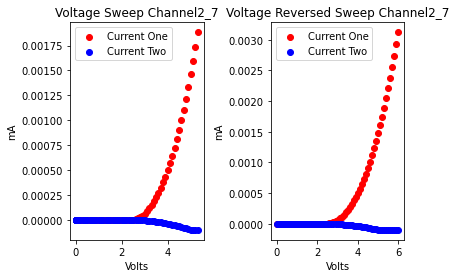

voltage
[-0.001227, 0.099994, 0.19999, 0.300021, 0.399999, 0.499983, 0.600015, 0.700003, 0.801135, 0.902546, 1.000017, 1.099984, 1.200006, 1.300012, 1.399983, 1.500006, 1.600018, 1.699987, 1.799999, 1.900017, 1.999984, 2.1, 2.20001, 2.29998, 2.4, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


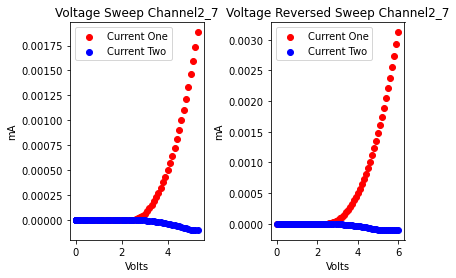

voltage
[-0.001221, 0.099994, 0.199989, 0.300022, 0.4, 0.499984, 0.600015, 0.700001, 0.799983, 0.900009, 1.000007, 1.099991, 1.200007, 1.300015, 1.399979, 1.500006, 1.600017, 1.699982, 1.800008, 1.89898, 1.99999, 2.099998, 2.20001, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


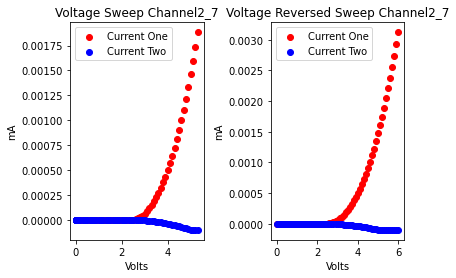

voltage
[0.000938, 0.10162, 0.200002, 0.299981, 0.399471, 0.500013, 0.599984, 0.700004, 0.800014, 0.899982, 1.000006, 1.098919, 1.199993, 1.29999, 1.400017, 1.499995, 1.599994, 1.700023, 1.799998, 1.899985, 2.000019, 2.099991, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


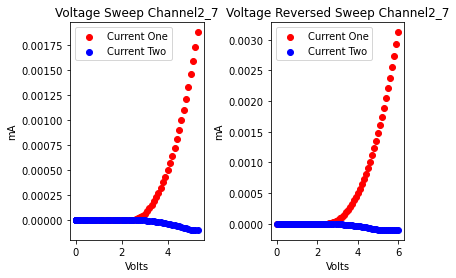

voltage
[0.000895, 0.101916, 0.199993, 0.300901, 0.400598, 0.499997, 0.599986, 0.700013, 0.800002, 0.899983, 1.000009, 1.100007, 1.199985, 1.299594, 1.400012, 1.499987, 1.600004, 1.700017, 1.799986, 1.900002, 2.000017, 2.099989, 2.2, 2.30001, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.89999, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


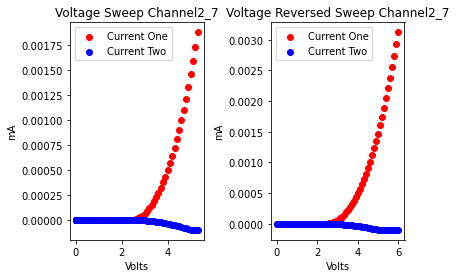

voltage
[-0.00033, 0.102569, 0.199987, 0.3, 0.400018, 0.499983, 0.599999, 0.700012, 0.800381, 0.905148, 1.002556, 1.099993, 1.199989, 1.300019, 1.399995, 1.499986, 1.600015, 1.700004, 1.799984, 1.900018, 2.000003, 2.099981, 2.20001, 2.3, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -0.0001, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


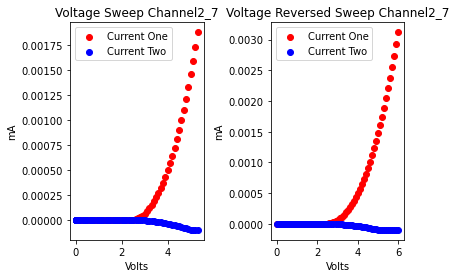

voltage
[-1.4e-05, 0.100018, 0.200004, 0.299986, 0.400009, 0.500008, 0.59998, 0.700003, 0.800016, 0.899983, 1.000004, 1.100012, 1.199985, 1.300004, 1.400017, 1.499988, 1.600002, 1.70002, 1.799994, 1.899994, 2.000016, 2.099993, 2.2, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


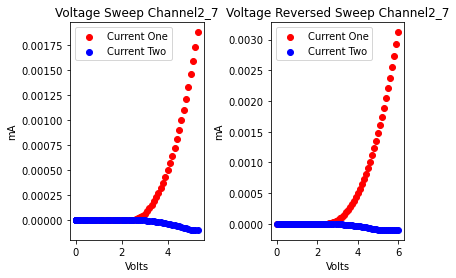

voltage
[-0.001068, 0.099988, 0.199996, 0.298739, 0.399998, 0.499985, 0.600015, 0.699997, 0.799985, 0.900019, 1.000004, 1.09999, 1.200013, 1.300008, 1.399982, 1.500004, 1.600017, 1.699984, 1.800007, 1.900013, 1.999984, 2.100005, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


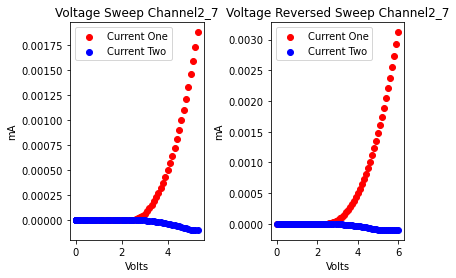

voltage
[-0.001157, 0.099995, 0.199984, 0.300026, 0.399991, 0.499986, 0.600018, 0.699996, 0.799991, 0.90002, 0.999996, 1.09999, 1.200016, 1.299997, 1.399986, 1.500015, 1.599998, 1.699985, 1.80002, 1.900004, 1.999986, 2.100009, 2.20001, 2.29999, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


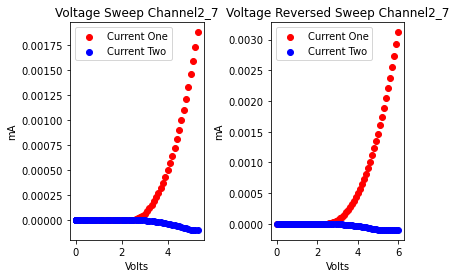

voltage
[-0.000435, 0.10001, 0.199985, 0.300006, 0.400019, 0.499981, 0.600004, 0.700009, 0.799984, 0.900005, 1.000015, 1.099986, 1.200558, 1.300022, 1.399992, 1.499984, 1.600019, 1.699997, 1.79999, 1.900015, 1.999999, 2.099988, 2.20001, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


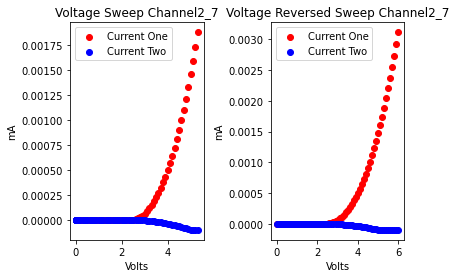

voltage
[-1.8e-05, 0.100018, 0.20004, 0.30489, 0.40179, 0.500003, 0.599991, 0.700011, 0.800011, 0.901238, 1.003526, 1.100014, 1.199987, 1.300557, 1.400023, 1.499998, 1.59999, 1.700018, 1.799997, 1.899987, 2.000014, 2.100001, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.49999, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


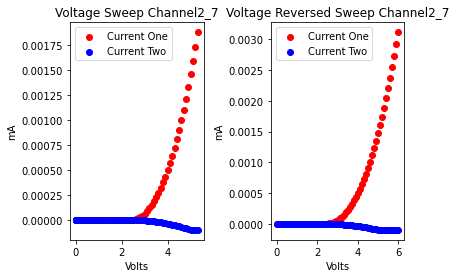

voltage
[-0.000399, 0.100006, 0.199979, 0.300005, 0.40002, 0.501019, 0.603325, 0.702681, 0.79999, 0.899991, 1.000016, 1.099996, 1.199994, 1.300023, 1.399993, 1.499986, 1.600018, 1.699997, 1.799986, 1.900017, 1.999998, 2.099985, 2.20002, 2.3, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


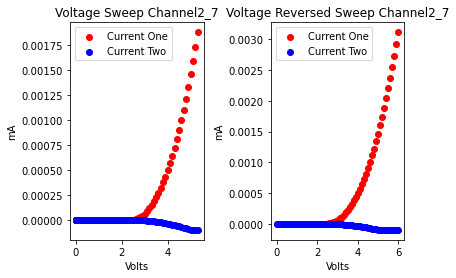

voltage
[0.000505, 0.103103, 0.202422, 0.299989, 0.39999, 0.500016, 0.599996, 0.699995, 0.800018, 0.900284, 1.00562, 1.102963, 1.199997, 1.299986, 1.399355, 1.500015, 1.599984, 1.700006, 1.800011, 1.899986, 2.00001, 2.100016, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.49999, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


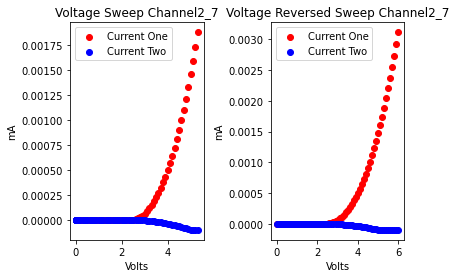

voltage
[-0.001054, 0.099988, 0.2, 0.300017, 0.399991, 0.49999, 0.600019, 0.699993, 0.799996, 0.90002, 1.000227, 1.099985, 1.199493, 1.300011, 1.399984, 1.500004, 1.600013, 1.699983, 1.800004, 1.900014, 1.999985, 2.099998, 2.20002, 2.29999, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


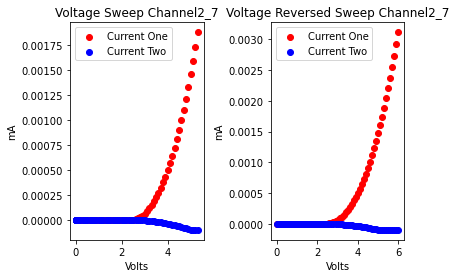

voltage
[-0.001185, 0.099995, 0.199994, 0.300026, 0.399993, 0.499986, 0.600017, 0.7, 0.799989, 0.900017, 0.999998, 1.101119, 1.203768, 1.300013, 1.399979, 1.500003, 1.600012, 1.699982, 1.800003, 1.900012, 1.999986, 2.100002, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


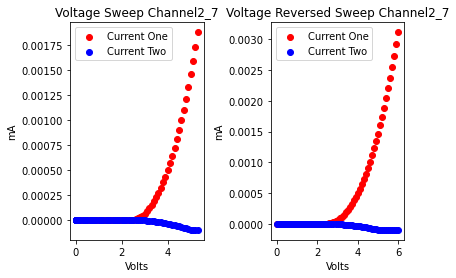

voltage
[-1.9e-05, 0.100017, 0.199995, 0.299982, 0.400015, 0.500002, 0.599984, 0.70001, 0.800009, 0.899986, 1.000007, 1.099036, 1.199983, 1.300001, 1.400021, 1.499989, 1.599999, 1.700016, 1.799992, 1.899991, 2.000018, 2.099998, 2.19998, 2.30002, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.49999, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


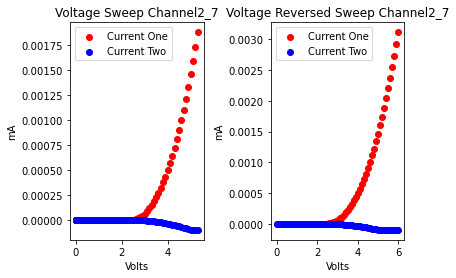

voltage
[0.000436, 0.103608, 0.202137, 0.299992, 0.399986, 0.500021, 0.599997, 0.701138, 0.802143, 0.900009, 1.00121, 1.10434, 1.200016, 1.299983, 1.399999, 1.500015, 1.599989, 1.69999, 1.80002, 1.899998, 1.999983, 2.100019, 2.19999, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


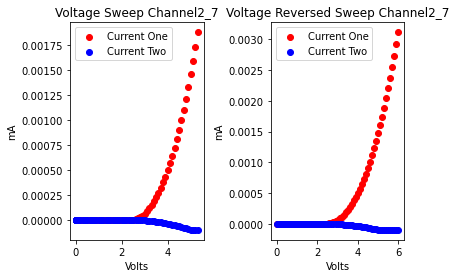

voltage
[-0.001127, 0.099996, 0.199985, 0.30002, 0.399997, 0.499989, 0.600017, 0.699996, 0.799984, 0.899344, 1.000015, 1.099984, 1.200003, 1.300014, 1.399983, 1.500005, 1.600016, 1.699982, 1.800001, 1.900016, 1.999989, 2.099995, 2.20001, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.09999, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


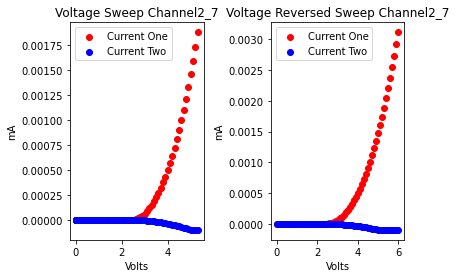

voltage
[-0.001151, 0.099991, 0.19999, 0.300023, 0.399954, 0.505081, 0.60201, 0.70001, 0.799983, 0.900006, 0.999041, 1.099984, 1.199999, 1.30002, 1.399992, 1.499989, 1.600018, 1.699997, 1.799984, 1.900021, 1.999993, 2.099989, 2.20001, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


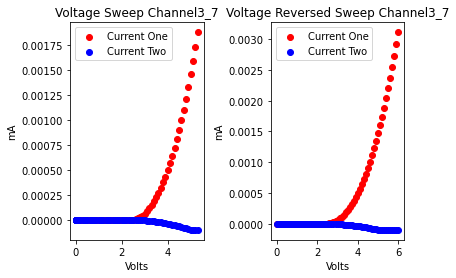

voltage
[0.001122, 0.101856, 0.200007, 0.299976, 0.400004, 0.500015, 0.599981, 0.700005, 0.800015, 0.899982, 1.000003, 1.100016, 1.199986, 1.299999, 1.400022, 1.499987, 1.600001, 1.700013, 1.799991, 1.899997, 2.000015, 2.099998, 2.19999, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


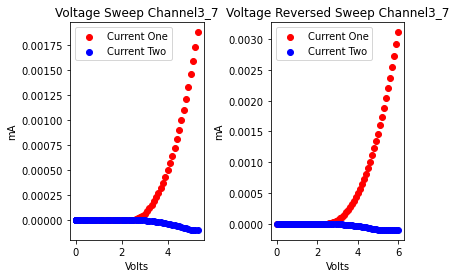

voltage
[-0.001097, 0.099987, 0.199988, 0.300019, 0.400309, 0.504732, 0.60171, 0.699997, 0.799984, 0.900018, 0.999425, 1.099983, 1.200005, 1.300011, 1.40096, 1.506138, 1.600017, 1.699997, 1.799989, 1.900017, 1.999996, 2.099988, 2.20002, 2.3, 2.39998, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


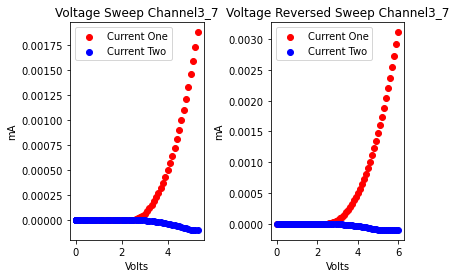

voltage
[0.001123, 0.101185, 0.200002, 0.3013, 0.402602, 0.502917, 0.599982, 0.700004, 0.800016, 0.899986, 1.000003, 1.100017, 1.199992, 1.299991, 1.40002, 1.499996, 1.599998, 1.700024, 1.799998, 1.899982, 2.000016, 2.099997, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


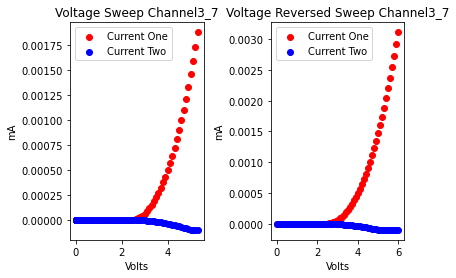

voltage
[-0.000226, 0.102781, 0.199984, 0.300005, 0.400012, 0.500876, 0.603639, 0.702179, 0.799991, 0.900927, 1.00275, 1.099993, 1.199985, 1.300015, 1.400005, 1.499985, 1.600008, 1.700009, 1.799986, 1.90001, 2.000007, 2.099977, 2.2, 2.30002, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


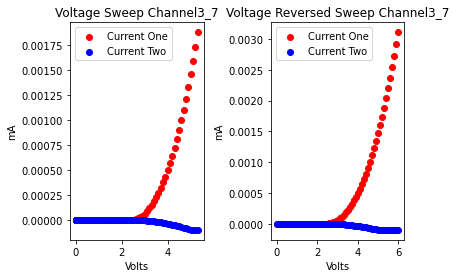

voltage
[-0.000786, 0.105255, 0.202038, 0.30001, 0.399981, 0.500002, 0.600017, 0.699985, 0.800006, 0.898945, 0.999996, 1.099985, 1.198946, 1.300002, 1.399984, 1.500015, 1.600003, 1.699985, 1.800013, 1.900011, 1.999987, 2.100003, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


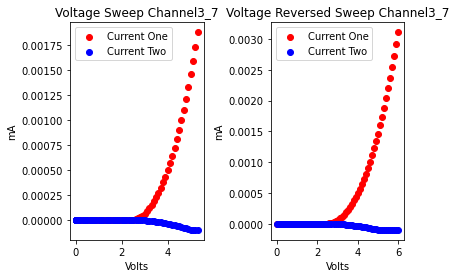

voltage
[-0.001098, 0.099993, 0.199993, 0.300024, 0.399995, 0.499991, 0.600023, 0.700241, 0.805042, 0.902595, 1.000003, 1.101171, 1.203836, 1.300018, 1.399983, 1.500004, 1.600014, 1.699984, 1.800004, 1.900012, 1.999986, 2.100007, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


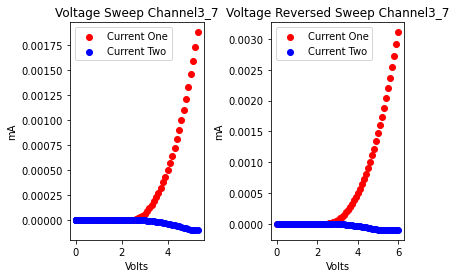

voltage
[-0.000461, 0.100009, 0.199984, 0.299803, 0.402408, 0.499986, 0.600657, 0.701949, 0.799992, 0.899989, 1.000017, 1.100055, 1.199989, 1.300011, 1.400009, 1.49998, 1.600005, 1.700019, 1.799977, 1.90001, 2.000013, 2.099981, 2.20001, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.5e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


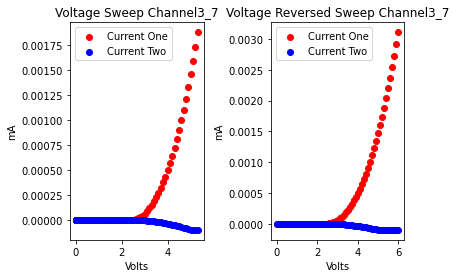

voltage
[-2e-05, 0.100016, 0.200003, 0.299982, 0.400011, 0.500011, 0.601244, 0.702568, 0.80001, 0.899984, 1.000006, 1.098895, 1.199995, 1.299982, 1.40002, 1.499997, 1.599991, 1.70002, 1.799996, 1.899987, 2.000014, 2.100004, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.89999, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


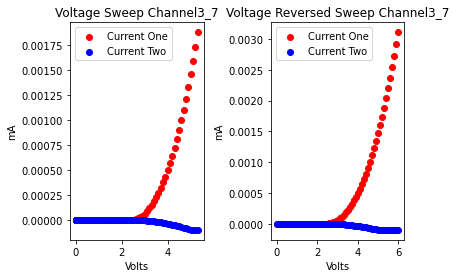

voltage
[-0.000444, 0.105262, 0.201096, 0.300011, 0.399982, 0.500003, 0.600016, 0.701024, 0.803386, 0.900016, 0.999994, 1.099997, 1.200014, 1.29999, 1.399989, 1.49875, 1.599996, 1.699986, 1.80002, 1.899998, 1.999986, 2.100016, 2.2, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


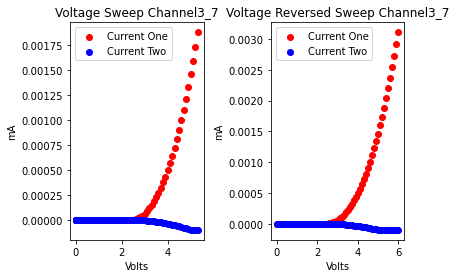

voltage
[-0.000468, 0.100006, 0.201196, 0.302472, 0.402828, 0.499982, 0.600004, 0.700012, 0.799986, 0.900361, 1.002972, 1.099994, 1.199991, 1.300022, 1.399993, 1.499989, 1.600018, 1.699997, 1.799991, 1.900018, 1.999998, 2.099983, 2.20002, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


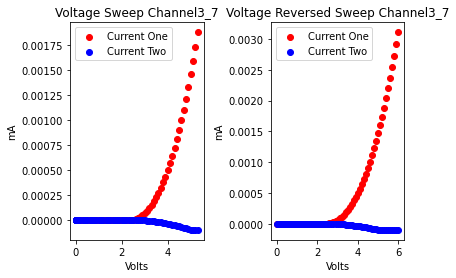

voltage
[0.001136, 0.102018, 0.200009, 0.301102, 0.402796, 0.502367, 0.599983, 0.699997, 0.800018, 0.900447, 1.004724, 1.103211, 1.199989, 1.29999, 1.40002, 1.499999, 1.59999, 1.700016, 1.800004, 1.899987, 2.000016, 2.100001, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


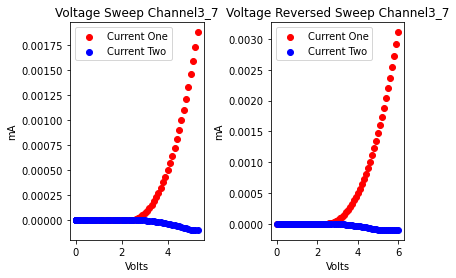

voltage
[-0.000661, 0.100008, 0.199986, 0.300004, 0.400014, 0.499976, 0.600009, 0.700016, 0.801043, 0.903414, 1.000017, 1.100381, 1.199985, 1.300017, 1.399998, 1.499987, 1.600012, 1.700005, 1.799982, 1.90001, 2.000005, 2.09999, 2.20001, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


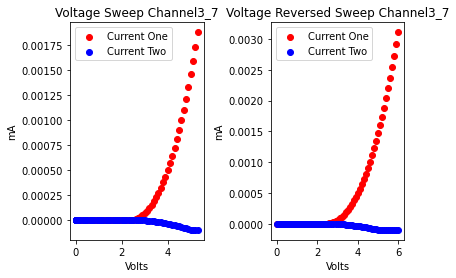

voltage
[-0.00033, 0.103, 0.199983, 0.300004, 0.398888, 0.499996, 0.599989, 0.700017, 0.799994, 0.899985, 1.000019, 1.099996, 1.199988, 1.300021, 1.399827, 1.499985, 1.600004, 1.70002, 1.799982, 1.900008, 2.000013, 2.099982, 2.2, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


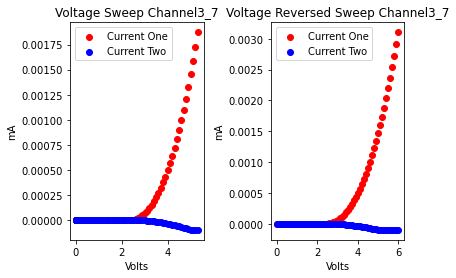

voltage
[-1e-05, 0.100003, 0.200015, 0.300615, 0.403677, 0.501868, 0.599989, 0.699987, 0.800019, 0.899996, 0.999992, 1.100016, 1.199998, 1.299984, 1.400019, 1.500001, 1.599984, 1.700018, 1.800004, 1.89999, 2.000008, 2.100011, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.3e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


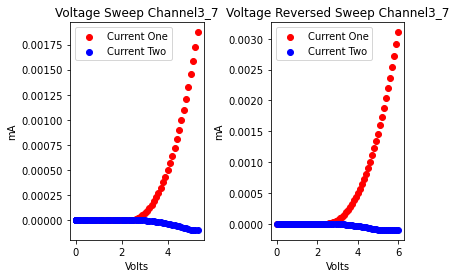

voltage
[-1.4e-05, 0.100006, 0.200013, 0.300989, 0.402981, 0.502215, 0.59999, 0.699998, 0.800015, 0.899997, 0.999993, 1.100023, 1.199997, 1.299981, 1.400024, 1.499997, 1.599992, 1.700018, 1.799996, 1.899987, 2.000017, 2.100002, 2.19998, 2.30002, 2.4, 2.5, 2.59999, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


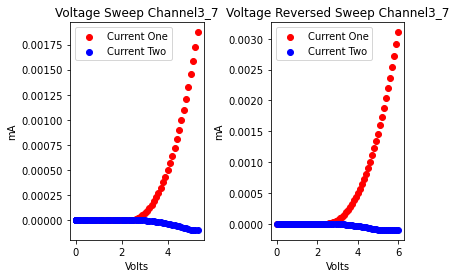

voltage
[0.000863, 0.101778, 0.199993, 0.299989, 0.400018, 0.499766, 0.59998, 0.700003, 0.799083, 0.899983, 1.0, 1.100015, 1.199989, 1.29999, 1.400023, 1.499999, 1.599997, 1.700026, 1.799998, 1.899986, 2.000018, 2.099994, 2.19999, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


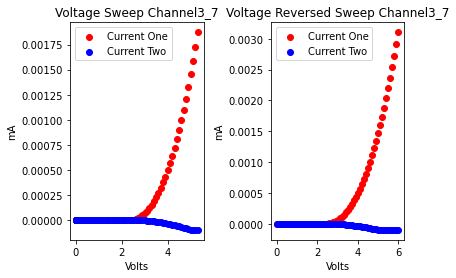

voltage
[-2e-05, 0.100016, 0.2, 0.299985, 0.400012, 0.499146, 0.599986, 0.700005, 0.800017, 0.900531, 1.004903, 1.103186, 1.199993, 1.299991, 1.400019, 1.499998, 1.599986, 1.700017, 1.800001, 1.899984, 2.000012, 2.100003, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


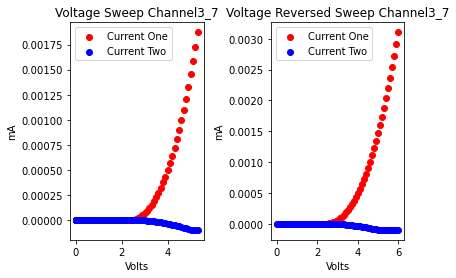

voltage
[-0.001053, 0.099989, 0.199999, 0.300013, 0.399988, 0.499992, 0.60002, 0.699995, 0.799984, 0.900019, 0.999998, 1.099993, 1.200019, 1.3, 1.39999, 1.500014, 1.599997, 1.699987, 1.800021, 1.900002, 1.999984, 2.100009, 2.2, 2.29999, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.8e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


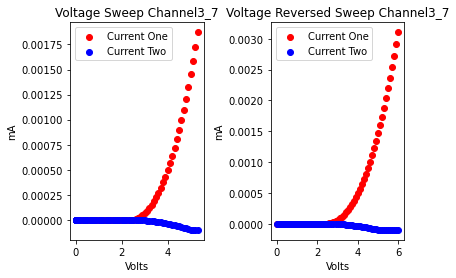

voltage
[0.000936, 0.101625, 0.199996, 0.299984, 0.40002, 0.500002, 0.599985, 0.700009, 0.800005, 0.899992, 1.000012, 1.099248, 1.199983, 1.300006, 1.400017, 1.499988, 1.6, 1.70002, 1.79999, 1.9, 2.000013, 2.099992, 2.19999, 2.30002, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


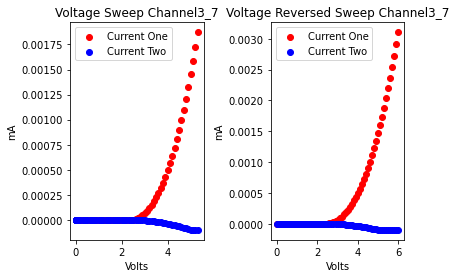

voltage
[-7.7e-05, 0.102709, 0.199984, 0.300001, 0.400015, 0.499985, 0.600002, 0.700016, 0.799988, 0.899994, 1.000014, 1.099997, 1.199989, 1.300022, 1.399995, 1.499991, 1.600019, 1.699999, 1.799986, 1.900013, 2.000001, 2.099981, 2.20001, 2.3, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


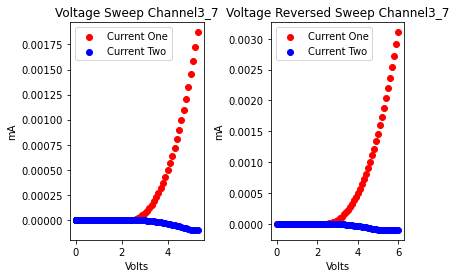

voltage
[-0.001018, 0.099983, 0.200002, 0.300019, 0.399993, 0.499989, 0.600016, 0.700297, 0.804929, 0.902173, 1.0, 1.099988, 1.200017, 1.300005, 1.399994, 1.500013, 1.600011, 1.699981, 1.800004, 1.900017, 1.999986, 2.100003, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


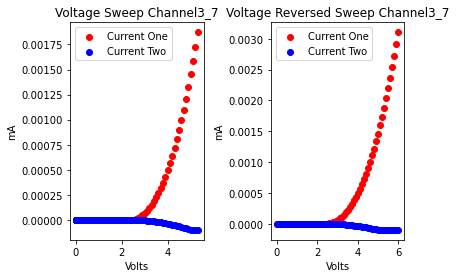

voltage
[-0.000455, 0.100015, 0.199985, 0.300006, 0.400011, 0.499983, 0.600004, 0.69895, 0.799996, 0.899984, 1.000017, 1.099996, 1.199991, 1.300019, 1.399996, 1.499989, 1.600016, 1.699996, 1.799986, 1.900015, 2.000003, 2.099985, 2.20003, 2.3, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


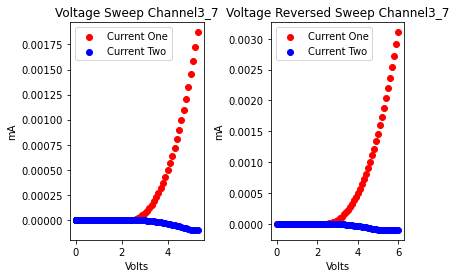

voltage
[-0.001131, 0.099994, 0.199986, 0.300017, 0.400001, 0.499983, 0.60001, 0.700007, 0.799991, 0.900008, 1.000011, 1.099983, 1.200003, 1.299035, 1.399987, 1.499993, 1.600013, 1.699996, 1.799988, 1.900022, 1.999995, 2.099989, 2.20002, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


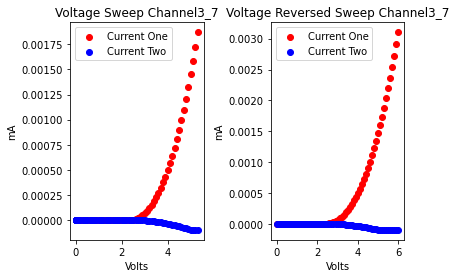

voltage
[-1.7e-05, 0.100017, 0.199998, 0.299986, 0.400014, 0.499997, 0.599986, 0.700016, 0.799354, 0.89998, 1.000006, 1.098913, 1.199991, 1.299996, 1.400027, 1.499999, 1.599982, 1.700022, 1.799993, 1.899989, 2.000019, 2.099998, 2.19999, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


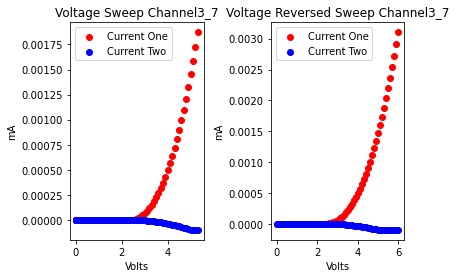

voltage
[-0.000648, 0.100005, 0.201306, 0.302519, 0.402702, 0.499983, 0.599998, 0.700015, 0.800531, 0.904551, 1.00272, 1.099994, 1.19999, 1.300019, 1.399997, 1.499986, 1.600015, 1.7, 1.799986, 1.90002, 2.000003, 2.099984, 2.20001, 2.3, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


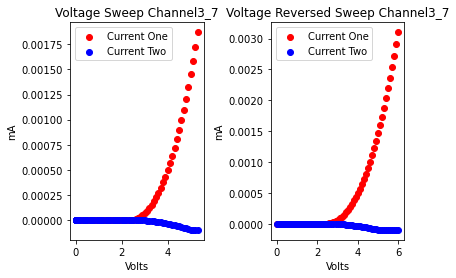

voltage
[-0.001012, 0.105398, 0.202036, 0.300019, 0.399983, 0.500003, 0.600011, 0.699985, 0.800003, 0.900013, 0.999986, 1.100005, 1.200012, 1.299984, 1.400004, 1.500013, 1.599987, 1.7, 1.800017, 1.899992, 1.999997, 2.10001, 2.19998, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


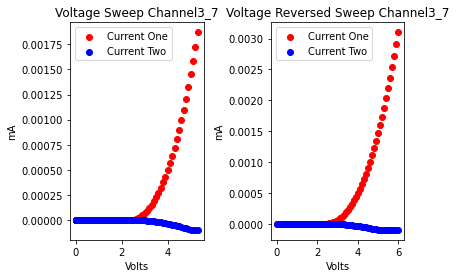

voltage
[-0.001046, 0.099995, 0.199987, 0.300018, 0.399997, 0.499989, 0.600019, 0.699997, 0.79999, 0.900017, 0.999997, 1.099985, 1.200016, 1.300003, 1.399984, 1.500008, 1.60001, 1.699984, 1.800009, 1.90001, 1.999984, 2.100002, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


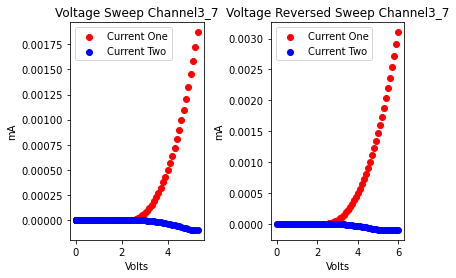

voltage
[-0.000507, 0.100017, 0.199983, 0.300005, 0.400014, 0.499983, 0.600006, 0.700011, 0.799983, 0.900006, 1.000015, 1.099983, 1.2, 1.300016, 1.399991, 1.499997, 1.600022, 1.699995, 1.799986, 1.900017, 1.999997, 2.099991, 2.20002, 2.29999, 2.39998, 2.49999, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


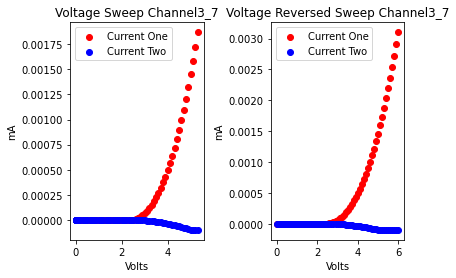

voltage
[-0.000821, 0.1053, 0.20213, 0.300018, 0.401046, 0.50288, 0.602375, 0.699991, 0.799997, 0.900013, 0.999992, 1.100863, 1.203391, 1.299998, 1.399985, 1.500015, 1.600004, 1.699986, 1.800017, 1.900005, 1.99999, 2.100007, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


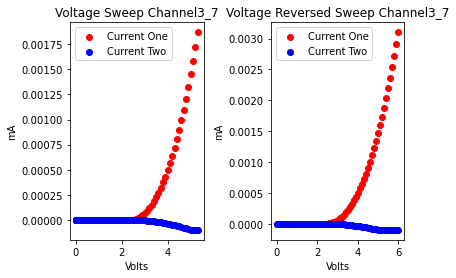

voltage
[-0.000698, 0.105142, 0.201995, 0.300007, 0.399977, 0.50001, 0.600014, 0.699984, 0.800004, 0.900015, 0.999987, 1.100496, 1.203709, 1.299989, 1.399986, 1.500016, 1.599999, 1.699986, 1.80002, 1.899998, 1.999987, 2.100018, 2.2, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.2e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


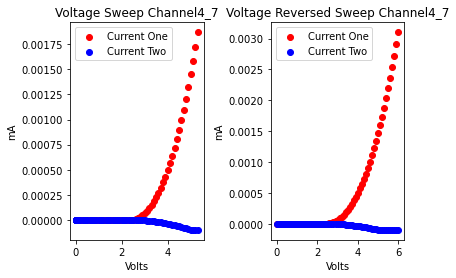

voltage
[-1.8e-05, 0.100012, 0.200011, 0.301287, 0.402569, 0.502647, 0.599983, 0.700003, 0.800016, 0.900641, 1.004789, 1.10331, 1.199996, 1.299996, 1.400026, 1.5, 1.599985, 1.700019, 1.799996, 1.899991, 2.000016, 2.099997, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.49999, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


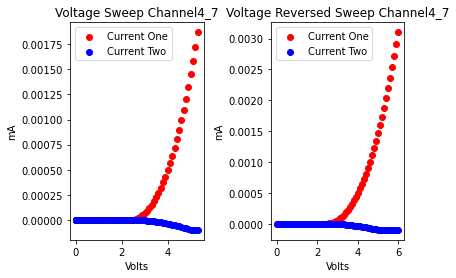

voltage
[-0.001126, 0.099995, 0.201058, 0.301897, 0.40001, 0.499981, 0.600004, 0.700014, 0.799984, 0.900007, 1.000013, 1.1009, 1.205327, 1.300014, 1.399997, 1.499989, 1.600022, 1.699992, 1.799989, 1.900021, 1.999997, 2.099987, 2.20002, 2.29999, 2.39998, 2.49999, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


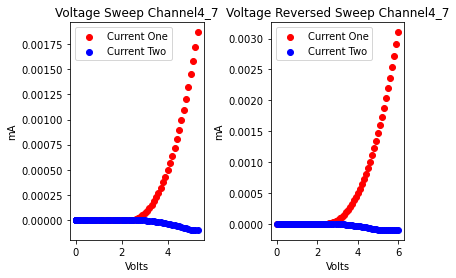

voltage
[-0.000204, 0.10473, 0.201762, 0.300004, 0.399988, 0.500012, 0.600013, 0.699986, 0.800006, 0.900018, 0.999985, 1.099986, 1.200016, 1.299992, 1.399999, 1.500015, 1.599999, 1.699989, 1.800025, 1.899993, 1.999989, 2.100018, 2.19999, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


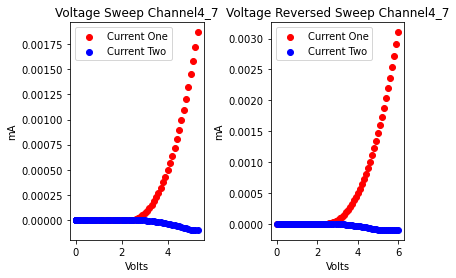

voltage
[-0.000667, 0.105087, 0.201941, 0.30001, 0.399983, 0.500007, 0.600007, 0.699981, 0.800004, 0.900017, 0.999983, 1.100006, 1.200013, 1.299985, 1.400004, 1.500016, 1.599986, 1.700001, 1.800019, 1.899987, 2.000003, 2.100018, 2.19998, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


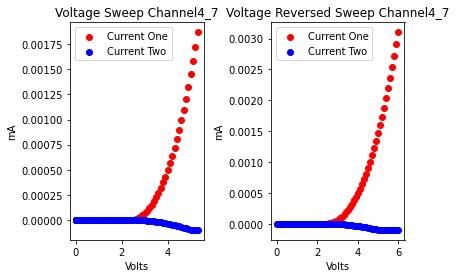

voltage
[-2.1e-05, 0.100009, 0.199164, 0.299979, 0.400004, 0.500016, 0.599985, 0.7, 0.800018, 0.899991, 0.999988, 1.100014, 1.199997, 1.299989, 1.400023, 1.499996, 1.599987, 1.70002, 1.799996, 1.899989, 2.000016, 2.099997, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


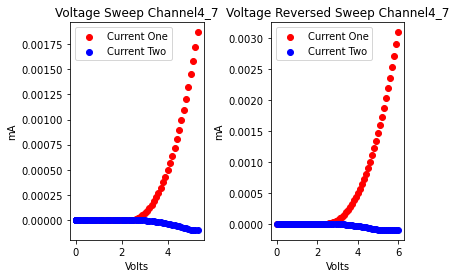

voltage
[0.00048, 0.103466, 0.20191, 0.299995, 0.400943, 0.502067, 0.600005, 0.699991, 0.800009, 0.900008, 1.001231, 1.103901, 1.200017, 1.299985, 1.400765, 1.500018, 1.599996, 1.699987, 1.80002, 1.899998, 1.999988, 2.100014, 2.2, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


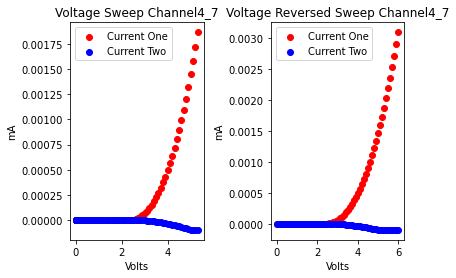

voltage
[-0.001029, 0.105068, 0.202309, 0.300011, 0.399983, 0.500005, 0.600015, 0.699988, 0.800002, 0.90002, 0.999994, 1.09999, 1.19878, 1.299996, 1.399984, 1.499316, 1.600007, 1.69998, 1.800007, 1.900014, 1.999986, 2.100003, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.8e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


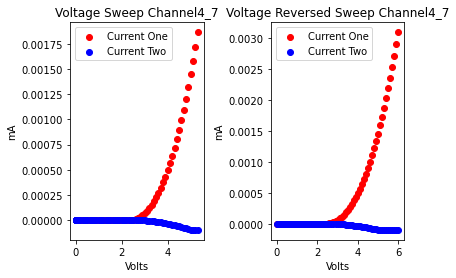

voltage
[-0.000919, 0.100004, 0.199985, 0.300014, 0.400012, 0.499981, 0.600004, 0.700016, 0.799984, 0.900003, 1.000012, 1.099985, 1.200005, 1.300017, 1.399981, 1.500002, 1.600019, 1.699992, 1.799995, 1.900012, 1.999995, 2.099989, 2.20001, 2.29999, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


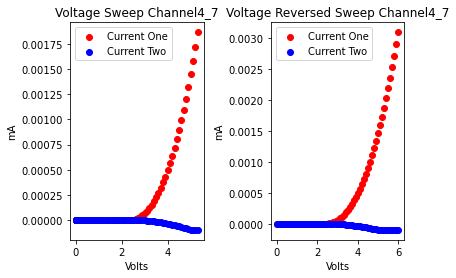

voltage
[-0.000362, 0.104823, 0.201833, 0.30001, 0.399985, 0.500006, 0.60001, 0.699979, 0.800002, 0.900017, 0.999984, 1.100004, 1.200013, 1.299984, 1.400004, 1.500015, 1.599987, 1.7, 1.800019, 1.899994, 2.000001, 2.100013, 2.19999, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


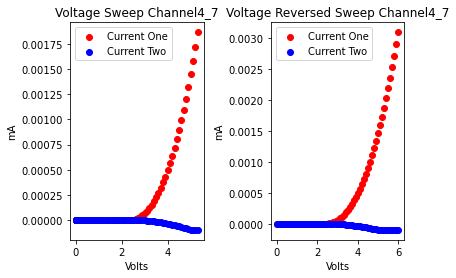

voltage
[-9.7e-05, 0.10458, 0.201694, 0.3, 0.399982, 0.499559, 0.600011, 0.700833, 0.80353, 0.902661, 0.999992, 1.099995, 1.200019, 1.299999, 1.399987, 1.500017, 1.59999, 1.699991, 1.800019, 1.899997, 1.999986, 2.100014, 2.19999, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


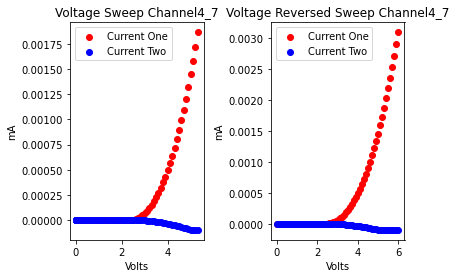

voltage
[0.001146, 0.102524, 0.202488, 0.299982, 0.400417, 0.501882, 0.599993, 0.699983, 0.800017, 0.899996, 0.99999, 1.100019, 1.199999, 1.299984, 1.400016, 1.499999, 1.599983, 1.700013, 1.800013, 1.89999, 2.000005, 2.100015, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


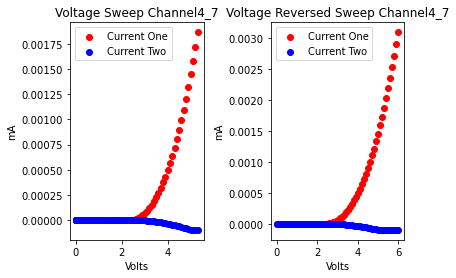

voltage
[0.000929, 0.101646, 0.199998, 0.299981, 0.400016, 0.500004, 0.599984, 0.700013, 0.800005, 0.901223, 1.003257, 1.100009, 1.199986, 1.300006, 1.400018, 1.499987, 1.600002, 1.70002, 1.799995, 1.900003, 2.000012, 2.099989, 2.19998, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


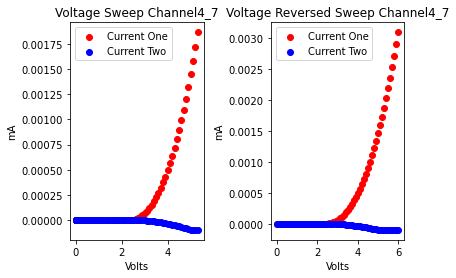

voltage
[-0.000257, 0.104912, 0.201638, 0.300001, 0.401242, 0.502637, 0.600011, 0.699985, 0.800005, 0.900015, 1.000693, 1.105038, 1.203797, 1.299993, 1.399986, 1.500017, 1.599996, 1.699988, 1.800017, 1.899996, 1.999987, 2.10002, 2.2, 2.29998, 2.40002, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


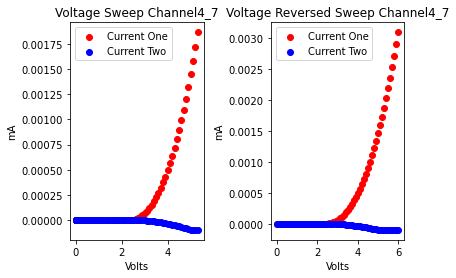

voltage
[0.001263, 0.102265, 0.20271, 0.305488, 0.402172, 0.500015, 0.599983, 0.700004, 0.800015, 0.900903, 1.004223, 1.100014, 1.199998, 1.299993, 1.400023, 1.499994, 1.600983, 1.700021, 1.800003, 1.899988, 2.000009, 2.100011, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


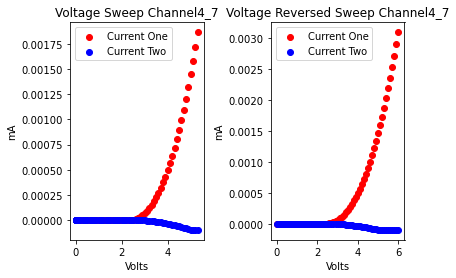

voltage
[-1.9e-05, 0.100016, 0.199997, 0.299989, 0.400021, 0.499998, 0.599988, 0.700018, 0.799999, 0.899986, 1.000015, 1.100003, 1.199986, 1.30001, 1.400003, 1.499989, 1.600008, 1.700013, 1.79999, 1.900011, 2.000012, 2.099986, 2.20001, 2.3, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


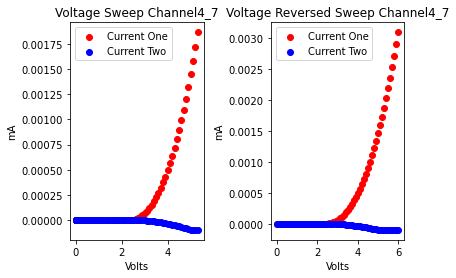

voltage
[0.001095, 0.101192, 0.2, 0.299982, 0.400012, 0.499167, 0.599984, 0.700001, 0.800017, 0.899985, 1.000003, 1.100019, 1.199989, 1.3, 1.40002, 1.499994, 1.599999, 1.700015, 1.79999, 1.899992, 2.000013, 2.099993, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


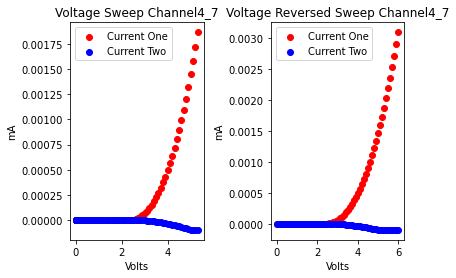

voltage
[-0.001012, 0.099979, 0.200009, 0.300019, 0.399981, 0.500005, 0.600012, 0.699987, 0.800002, 0.900015, 0.999987, 1.10036, 1.200025, 1.299993, 1.399989, 1.500017, 1.599998, 1.69999, 1.800018, 1.899998, 1.999985, 2.100015, 2.2, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


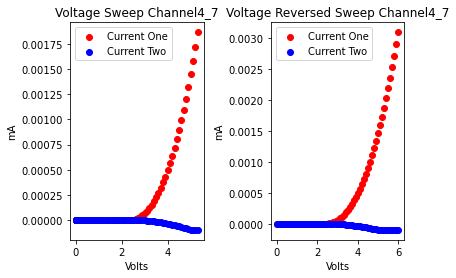

voltage
[-0.001137, 0.099994, 0.199985, 0.300019, 0.400003, 0.501231, 0.602352, 0.70001, 0.799982, 0.900005, 1.000013, 1.099985, 1.200006, 1.300017, 1.399987, 1.499997, 1.600017, 1.699982, 1.8, 1.900016, 1.999991, 2.099994, 2.20002, 2.29999, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


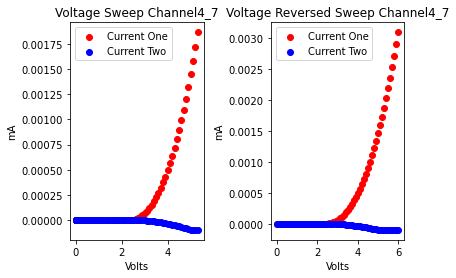

voltage
[0.000968, 0.102562, 0.202578, 0.299982, 0.400001, 0.500019, 0.600429, 0.704198, 0.801991, 0.899995, 0.999987, 1.100016, 1.200004, 1.299987, 1.400017, 1.500002, 1.599984, 1.70001, 1.800013, 1.899988, 2.000003, 2.100014, 2.19997, 2.3, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


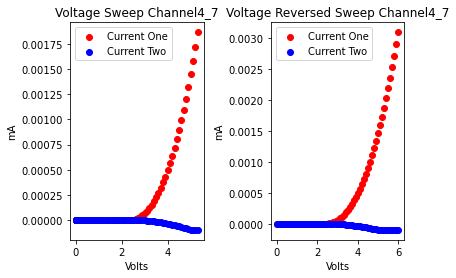

voltage
[0.001113, 0.101775, 0.200008, 0.299983, 0.400005, 0.50002, 0.599984, 0.700003, 0.800012, 0.899983, 1.000006, 1.100014, 1.199985, 1.299999, 1.400021, 1.499984, 1.599998, 1.700014, 1.79999, 1.899991, 2.000019, 2.099999, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


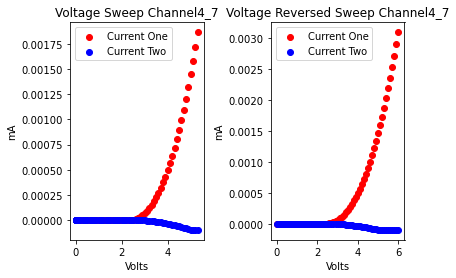

voltage
[-0.000547, 0.100007, 0.199983, 0.300001, 0.40002, 0.501007, 0.603023, 0.702459, 0.799985, 0.899999, 1.000016, 1.099993, 1.199989, 1.298755, 1.399992, 1.499986, 1.600015, 1.700002, 1.799984, 1.900009, 2.000004, 2.09999, 2.20001, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


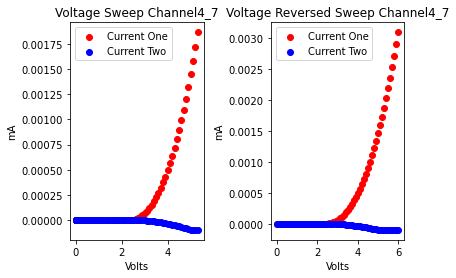

voltage
[-1.6e-05, 0.099424, 0.203197, 0.299982, 0.400004, 0.500012, 0.599985, 0.700003, 0.800016, 0.899981, 1.000001, 1.100018, 1.199992, 1.299998, 1.400016, 1.499993, 1.599998, 1.700027, 1.799999, 1.899983, 2.000015, 2.099997, 2.19999, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


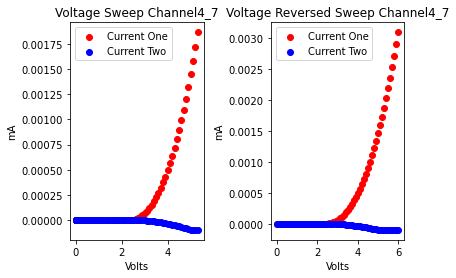

voltage
[0.001005, 0.102719, 0.202373, 0.299983, 0.400001, 0.500018, 0.600363, 0.70448, 0.801931, 0.899999, 0.999985, 1.099294, 1.200012, 1.29998, 1.400006, 1.500011, 1.599983, 1.700003, 1.800017, 1.899989, 2.000002, 2.100017, 2.19998, 2.29999, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


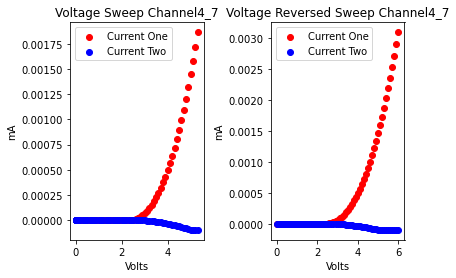

voltage
[-0.000445, 0.103299, 0.199983, 0.300008, 0.398981, 0.499987, 0.599994, 0.700016, 0.8, 0.899985, 1.000018, 1.100118, 1.199983, 1.300014, 1.400012, 1.499987, 1.600008, 1.700008, 1.79998, 1.900007, 2.000018, 2.099982, 2.20001, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


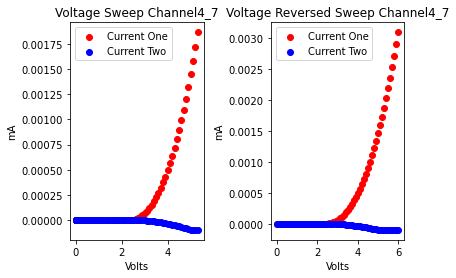

voltage
[0.000204, 0.102224, 0.199983, 0.299999, 0.400013, 0.500394, 0.604261, 0.701923, 0.799997, 0.901045, 1.003084, 1.10001, 1.199984, 1.300005, 1.400017, 1.499984, 1.60001, 1.700017, 1.799984, 1.900004, 2.000012, 2.099983, 2.2, 2.30001, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.39999, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


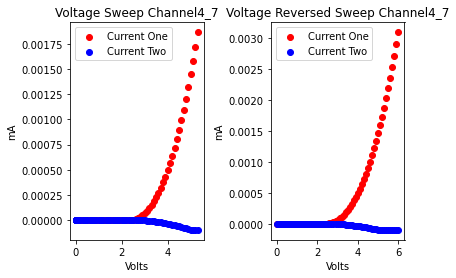

voltage
[0.001242, 0.101703, 0.200014, 0.29998, 0.400004, 0.500018, 0.599986, 0.700004, 0.800016, 0.900622, 1.004622, 1.103328, 1.199996, 1.299987, 1.400018, 1.499995, 1.599988, 1.70002, 1.799998, 1.899986, 2.000014, 2.100004, 2.19998, 2.30001, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.19999, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


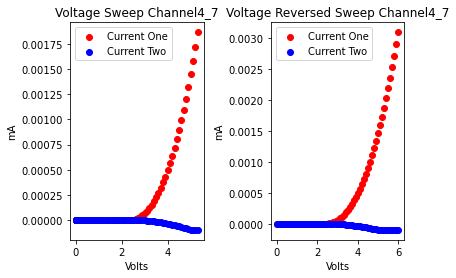

voltage
[0.001288, 0.102167, 0.200014, 0.299983, 0.400003, 0.500018, 0.599986, 0.7, 0.800019, 0.899987, 1.0, 1.100016, 1.199991, 1.299992, 1.400015, 1.499996, 1.599995, 1.700025, 1.799998, 1.899994, 2.000022, 2.099992, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


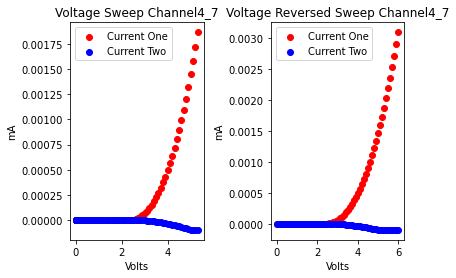

voltage
[-0.00101, 0.105054, 0.202257, 0.303029, 0.399981, 0.500004, 0.600013, 0.699988, 0.799999, 0.900018, 1.000669, 1.105176, 1.203832, 1.299994, 1.399985, 1.498956, 1.600002, 1.699985, 1.800019, 1.900006, 1.999989, 2.100014, 2.20001, 2.29999, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


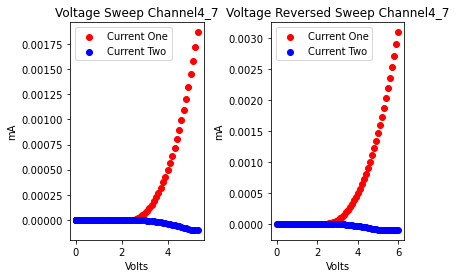

voltage
[-0.001012, 0.100001, 0.201261, 0.30232, 0.40308, 0.499982, 0.600004, 0.700012, 0.800918, 0.903868, 1.003093, 1.099991, 1.199996, 1.300023, 1.399993, 1.499987, 1.600017, 1.699995, 1.799992, 1.900018, 1.999994, 2.099986, 2.20001, 2.29999, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


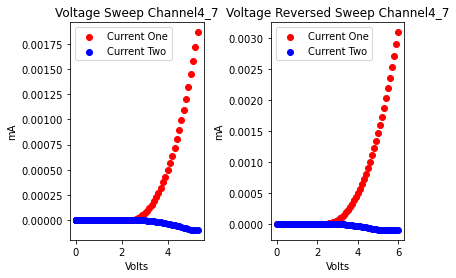

voltage
[-0.001229, 0.099997, 0.199987, 0.300021, 0.400031, 0.505271, 0.601836, 0.700003, 0.799986, 0.900011, 1.000013, 1.099982, 1.200006, 1.300012, 1.399977, 1.500006, 1.60002, 1.699982, 1.800008, 1.900012, 1.999985, 2.100007, 2.20001, 2.29998, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.79999, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


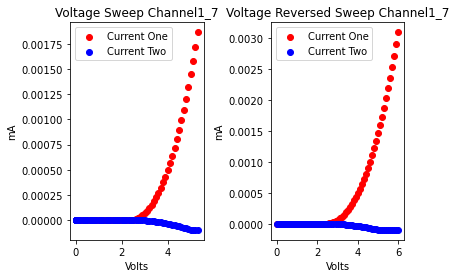

voltage
[-1.4e-05, 0.100019, 0.200003, 0.301271, 0.402331, 0.50001, 0.599985, 0.700003, 0.800017, 0.89998, 1.0, 1.100015, 1.199992, 1.299996, 1.400014, 1.499992, 1.59999, 1.700021, 1.799999, 1.899988, 2.00002, 2.099994, 2.19998, 2.30002, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


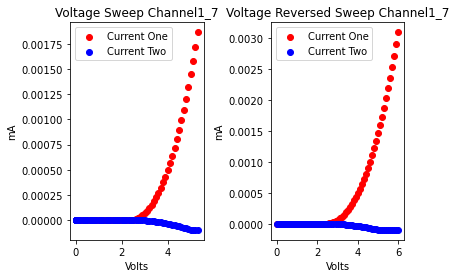

voltage
[0.001282, 0.102377, 0.202902, 0.299979, 0.400004, 0.500015, 0.599985, 0.700002, 0.800017, 0.899983, 1.000002, 1.098854, 1.199994, 1.299989, 1.400021, 1.499997, 1.599985, 1.700017, 1.800003, 1.899988, 2.000018, 2.100003, 2.19998, 2.30001, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


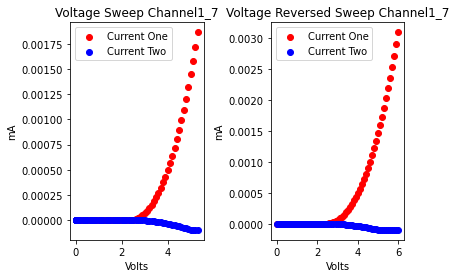

voltage
[-0.001223, 0.099994, 0.199992, 0.300019, 0.399812, 0.499979, 0.600007, 0.700016, 0.799979, 0.900008, 1.000015, 1.099985, 1.200005, 1.300018, 1.399987, 1.500005, 1.600017, 1.699983, 1.8, 1.900017, 1.999995, 2.099997, 2.20001, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.09999, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


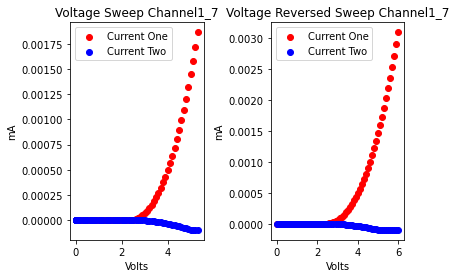

voltage
[-0.001258, 0.099992, 0.199991, 0.300022, 0.399792, 0.499981, 0.600005, 0.700012, 0.799981, 0.900002, 0.999034, 1.099988, 1.200588, 1.300021, 1.399995, 1.49999, 1.600018, 1.700002, 1.799987, 1.900019, 2.000004, 2.099981, 2.20001, 2.3, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


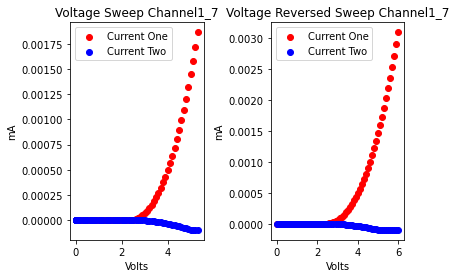

voltage
[-0.001171, 0.099994, 0.199986, 0.300018, 0.400001, 0.499984, 0.600019, 0.700002, 0.799989, 0.900012, 1.000012, 1.101291, 1.204017, 1.300012, 1.399983, 1.500004, 1.600018, 1.699987, 1.800001, 1.900017, 1.999986, 2.099999, 2.20002, 2.29999, 2.39999, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


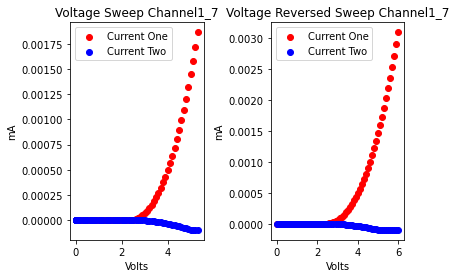

voltage
[-0.001127, 0.099991, 0.19999, 0.300023, 0.400001, 0.499986, 0.600016, 0.699999, 0.799986, 0.900022, 1.000004, 1.101219, 1.204203, 1.300012, 1.399981, 1.500006, 1.600014, 1.699983, 1.800007, 1.900015, 1.999981, 2.100001, 2.20001, 2.29999, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


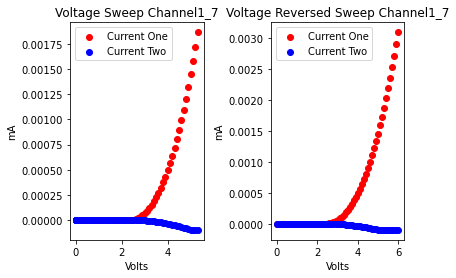

voltage
[0.000108, 0.102248, 0.199982, 0.300002, 0.400017, 0.500402, 0.604787, 0.70178, 0.799995, 0.899986, 1.000016, 1.1, 1.199983, 1.300011, 1.400004, 1.499993, 1.600012, 1.700014, 1.79999, 1.900008, 2.000011, 2.099978, 2.2, 2.3, 2.39998, 2.49999, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


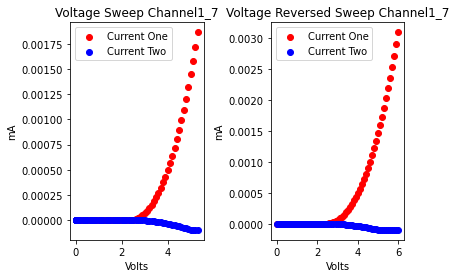

voltage
[-0.001027, 0.099982, 0.200002, 0.300018, 0.399984, 0.500003, 0.600014, 0.699987, 0.799999, 0.90002, 0.999984, 1.100618, 1.200018, 1.300004, 1.399988, 1.500007, 1.600007, 1.699983, 1.800006, 1.900007, 1.999985, 2.100005, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.19999, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


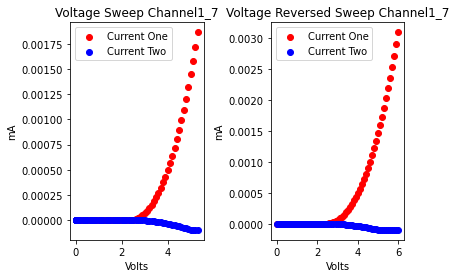

voltage
[-1.2e-05, 0.100016, 0.199996, 0.299986, 0.400018, 0.49971, 0.605424, 0.702072, 0.800006, 0.901235, 1.003504, 1.100016, 1.199984, 1.3, 1.400022, 1.499993, 1.599988, 1.700014, 1.799996, 1.899995, 2.000022, 2.099998, 2.19998, 2.30002, 2.39999, 2.5, 2.6, 2.7, 2.8, 2.89999, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.29999, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


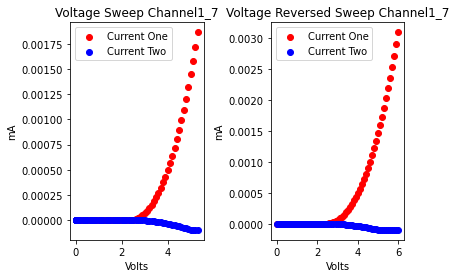

voltage
[-0.000524, 0.100008, 0.199979, 0.300014, 0.400012, 0.499982, 0.600005, 0.700013, 0.799986, 0.900568, 1.002815, 1.099995, 1.200945, 1.30376, 1.399998, 1.499986, 1.600009, 1.700005, 1.799993, 1.900009, 2.000007, 2.099981, 2.20001, 2.30001, 2.39998, 2.5, 2.6, 2.7, 2.79999, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.09999, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.79999, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.4e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


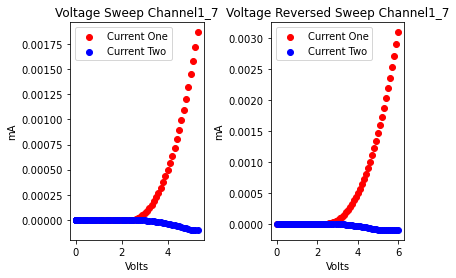

voltage
[0.001276, 0.102377, 0.202815, 0.299979, 0.400002, 0.500018, 0.599988, 0.700002, 0.798865, 0.899995, 0.999988, 1.100017, 1.199998, 1.30114, 1.404641, 1.500006, 1.599979, 1.700001, 1.800018, 1.899983, 2.000004, 2.100013, 2.19998, 2.3, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 4.99999, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


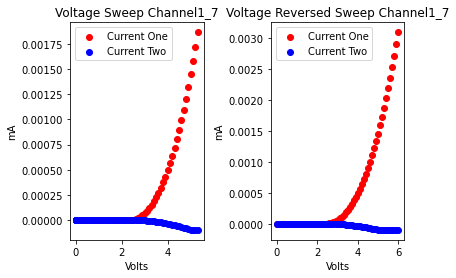

voltage
[-0.000469, 0.104968, 0.201663, 0.300001, 0.401268, 0.502736, 0.600011, 0.699986, 0.800004, 0.900017, 0.999986, 1.1, 1.200017, 1.299987, 1.4, 1.500012, 1.599992, 1.699986, 1.800018, 1.899996, 1.999984, 2.100027, 2.19999, 2.29998, 2.40002, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.69999, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


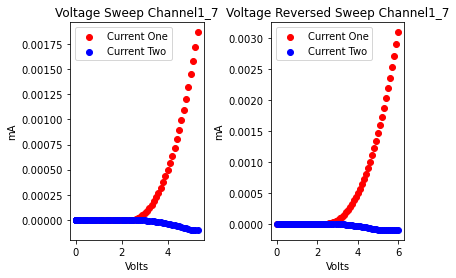

voltage
[-0.001074, 0.099985, 0.200001, 0.300019, 0.399992, 0.49999, 0.600015, 0.699994, 0.799995, 0.900026, 1.000192, 1.099982, 1.20001, 1.300009, 1.399985, 1.500006, 1.600016, 1.699982, 1.800005, 1.900011, 1.999987, 2.100005, 2.20001, 2.29998, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -1e-05, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


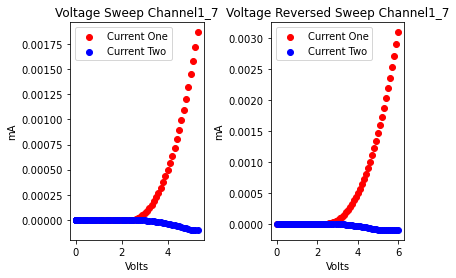

voltage
[0.000257, 0.104215, 0.201649, 0.299998, 0.399982, 0.500016, 0.600001, 0.701154, 0.802577, 0.900018, 0.999985, 1.100004, 1.200013, 1.299984, 1.400007, 1.500017, 1.599988, 1.7, 1.800018, 1.899989, 2.0, 2.100014, 2.19998, 2.3, 2.40001, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5.0, 5.1, 5.2, 5.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
currnet two
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2e-05, -4.7e-05, -5.3e-05, -5.9e-05, -6.5e-05, -7.1e-05, -7.7e-05, -8.4e-05, -9.1e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


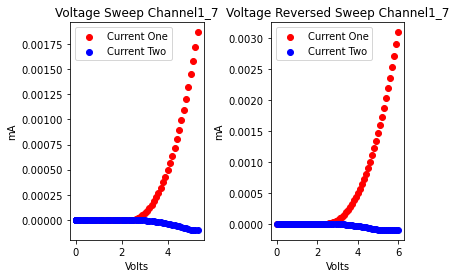

In [46]:
for i in range(len(measurementDF)-1):
    if List_of_channelNumber[i] == 7:
        print("voltage")
        print(List_of_voltageSweepList[i])
        print("currnet two")
        print(List_of_currentTwoList[i])
        plt.subplot(1, 2, 1)
        C1 = plt.scatter(List_of_voltageSweepList[i] , List_of_currentOneList[i],color='red')
        C2 = plt.scatter(List_of_voltageSweepList[i], List_of_currentTwoList[i],color='blue')
        plt.legend(['Current One', 'Current Two'])
        plt.title('Voltage Sweep Channel' + str(List_of_measurementNumber[i]))
        plt.xlabel('Volts')
        plt.ylabel('mA')

        plt.subplot(1, 2, 2)
        reverseC1 = plt.scatter(List_of_voltageSweepReversedList[i],List_of_currentOneReverseList[i],color='red')
        reverseC2 = plt.scatter(List_of_voltageSweepReversedList[i],List_of_currentTwoReverseList[i],color='blue')
        plt.legend(['Current One', 'Current Two'])
        plt.title('Voltage Reversed Sweep Channel' + str(List_of_measurementNumber[i]))
        plt.xlabel('Volts')
        plt.ylabel('mA')

        plt.subplots_adjust(wspace=0.5)

        plt.show()

In [52]:
isMeanEmpty = True
for i in range(len(measurementDF)-1):
    if List_of_channelNumber[i] == 7:
        if isMeanEmpty == True: #bunu bi test et
            isMeanEmpty = False
            channel_voltageSweep_mean = List_of_voltageSweepList[i]
            channel_currentOne_mean = List_of_currentOneList[i]
            channel_currentTwo_mean = List_of_currentTwoList[i]
            
            channel_voltageSweepReversed_mean = List_of_voltageSweepReversedList[i]
            channel_currentOneReverse_mean = List_of_currentOneReverseList[i]
            channel_currentTwoReverse_mean = List_of_currentTwoReverseList[i]
        else:
            for k in range(len(channel_voltageSweep_mean)-1):
                channel_voltageSweep_mean[k] = (channel_voltageSweep_mean[k] + List_of_voltageSweepList[i][k]) / 2
                channel_currentOne_mean[k] = (channel_currentOne_mean[k] + List_of_currentOneList[i][k]) / 2
                channel_currentTwo_mean[k] = (channel_currentTwo_mean[k] + List_of_currentTwoList[i][k]) / 2

                channel_voltageSweepReversed_mean[k] = (channel_voltageSweepReversed_mean[k] + List_of_voltageSweepReversedList[i][k]) / 2
                channel_currentOneReverse_mean[k] =  (channel_currentOneReverse_mean[k] + List_of_currentOneReverseList[i][k]) / 2
                channel_currentTwoReverse_mean[k] = (channel_currentTwoReverse_mean[k] + List_of_currentTwoReverseList[i][k]) / 2


In [32]:
a = List_of_voltageSweepList[i]
type(a)

list

In [33]:
type(channel_voltageSweep_mean)

list

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -1e-06, -1e-06, -2e-06, -4e-06, -5e-06, -7e-06, -9.312492113094776e-06, -1.2e-05, -1.5e-05, -1.8e-05, -2.1000000000000002e-05, -2.5e-05, -2.9e-05, -3.3e-05, -3.8e-05, -4.2000000000000004e-05, -4.7000000000003975e-05, -5.3e-05, -5.9e-05, -6.494573450088501e-05, -7.099999999999999e-05, -7.7e-05, -8.400000000000001e-05, -9.100000000000007e-05, -9.9e-05, -0.0001, -0.0001, -0.0001, -4.445517498970155e-166, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


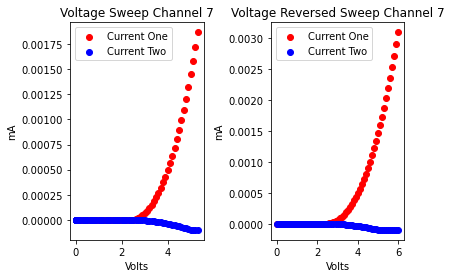

In [57]:
print(channel_currentTwo_mean)
plt.subplot(1, 2, 1)
C1 = plt.scatter(channel_voltageSweep_mean , channel_currentOne_mean,color='red')
C2 = plt.scatter(channel_voltageSweep_mean , channel_currentTwo_mean,color='blue')
plt.legend(['Current One', 'Current Two'])
plt.title('Voltage Sweep Channel ' + str("7"))
plt.xlabel("Volts")
plt.ylabel('mA')

plt.subplot(1, 2, 2)
reverseC1 = plt.scatter(channel_voltageSweepReversed_mean , channel_currentOneReverse_mean,color='red')
reverseC2 = plt.scatter(channel_voltageSweepReversed_mean , channel_currentTwoReverse_mean,color='blue')
plt.legend(['Current One', 'Current Two'])
plt.title('Voltage Reversed Sweep Channel ' + str("7"))
plt.xlabel('Volts')
plt.ylabel('mA')

plt.subplots_adjust(wspace=0.5)

plt.show()

SyntaxError: invalid syntax (Temp/ipykernel_7936/2038231695.py, line 6)